# 예제 : 신경망 기계 번역

## 1. 데이터 로드

In [1]:
import pandas as pd

df = pd.read_csv("../../data/simplest_eng_fra.csv", index_col=0)
df

,source_language,split,target_language
0,he 's the cutest boy in town .,train,c'est le garçon le plus mignon en ville .
1,he 's a nonsmoker .,train,il est non-fumeur .
2,he 's smarter than me .,train,il est plus intelligent que moi .
3,he 's a lovely young man .,train,c'est un adorable jeune homme .
4,he 's three years older than me .,train,il a trois ans de plus que moi .
...,...,...,...
13057,you are n't invited .,test,vous n'êtes pas invités .
13058,you are always watching tv .,test,tu regardes tout le temps la télé .
13059,you are trusted by every one of us .,test,chacun de nous te fait confiance .
13060,you are blinded by love .,test,vous êtes aveuglé par l'amour .


### 데이터 split(train/valid/test)

In [2]:
df['split'].value_counts()

split
train    9138
test     1969
val      1955
Name: count, dtype: int64

In [3]:
# 데이터를 다시 train/valid/test로 나눠줌

# train 데이터 
train_df = df[df.split=='train']
train_size = len(train_df)

# valid 데이터 
val_df = df[df.split=='val']
val_size = len(val_df)

# test 데이터 
test_df = df[df.split=='test']
test_size = len(test_df)

## 2. Vocabulary

In [4]:
class Vocabulary:
    def __init__(self, token_to_idx=None):

        if token_to_idx is None:
            token_to_idx = {}
        self.token_to_idx = token_to_idx

        self.idx_to_token = {idx: token 
                              for token, idx in self.token_to_idx.items()}

    def add_token(self, token):
        
#       만약 해당 토큰이 있으면 토큰 idx만 return
        if token in self.token_to_idx:
            index = self.token_to_idx[token]
            
#       만약 해당 토큰이 없으면 새로운 토큰 만들어줌
        else:
            index = len(self.token_to_idx)
            self.token_to_idx[token] = index
            self.idx_to_token[index] = token
        return index

In [5]:
class SequenceVocabulary(Vocabulary):
    def __init__(self, token_to_idx=None, unk_token="<UNK>",
                 mask_token="<MASK>", begin_seq_token="<BEGIN>",
                 end_seq_token="<END>"):

        super(SequenceVocabulary, self).__init__(token_to_idx)

        self._mask_token = mask_token
        self._unk_token = unk_token
        self._begin_seq_token = begin_seq_token
        self._end_seq_token = end_seq_token

        self.mask_index = self.add_token(self._mask_token)
        self.unk_index = self.add_token(self._unk_token)
        self.begin_seq_index = self.add_token(self._begin_seq_token)
        self.end_seq_index = self.add_token(self._end_seq_token)
        
        

In [6]:
# Voca 생성 및 각각의 max_seq를 구해준다. 

source_vocab = SequenceVocabulary()
target_vocab = SequenceVocabulary()

max_source_length = 0
max_target_length = 0

for _, row in df.iterrows():
#     영어(source) Voca 만들기 
    source_tokens = row["source_language"].split(" ")
    if len(source_tokens) > max_source_length:
        max_source_length = len(source_tokens)
    for token in source_tokens:
        source_vocab.add_token(token)

#     프랑스어(target) Voca 만들기 
    target_tokens = row["target_language"].split(" ")
    if len(target_tokens) > max_target_length:
        max_target_length = len(target_tokens)
    for token in target_tokens:
        target_vocab.add_token(token)

In [7]:
max_source_length

23

In [8]:
max_target_length

24

## Source Vocabulary

In [9]:
print(dict(list(source_vocab.token_to_idx.items())[:10]))

{'<MASK>': 0, '<UNK>': 1, '<BEGIN>': 2, '<END>': 3, 'he': 4, "'s": 5, 'the': 6, 'cutest': 7, 'boy': 8, 'in': 9}


In [10]:
print(dict(list(source_vocab.idx_to_token.items())[:10]))

{0: '<MASK>', 1: '<UNK>', 2: '<BEGIN>', 3: '<END>', 4: 'he', 5: "'s", 6: 'the', 7: 'cutest', 8: 'boy', 9: 'in'}


In [11]:
vocab_length = len(source_vocab.token_to_idx)
print("토큰의 수:", vocab_length)

토큰의 수: 3432


## Target Vocabulary

In [12]:
print(dict(list(target_vocab.token_to_idx.items())[:10]))

{'<MASK>': 0, '<UNK>': 1, '<BEGIN>': 2, '<END>': 3, "c'est": 4, 'le': 5, 'garçon': 6, 'plus': 7, 'mignon': 8, 'en': 9}


In [13]:
print(dict(list(target_vocab.idx_to_token.items())[:10]))

{0: '<MASK>', 1: '<UNK>', 2: '<BEGIN>', 3: '<END>', 4: "c'est", 5: 'le', 6: 'garçon', 7: 'plus', 8: 'mignon', 9: 'en'}


In [14]:
vocab_length = len(target_vocab.token_to_idx)
print("토큰의 수:", vocab_length)

토큰의 수: 5744


## 3. Vectorizer

In [15]:
# 주어진 토큰에 대응하는 인덱스 반환

def lookup_token(vocabulary_class,token):
    return vocabulary_class.token_to_idx[token]

In [16]:
# 주어진 인덱스에 대응하는 토큰 반환

def lookup_index(vocabulary_class, index):
        if index not in vocabulary_class.idx_to_token:
            raise KeyError("the index (%d) is not in the Vocabulary" % index)
        return vocabulary_class.idx_to_token[index]

In [17]:
import numpy as np 

# 인덱스를 벡터로 변환하는 함수
def _vectorize(indices, vector_length=-1, mask_index=0):
    
#     if vector_length < 0:
#         vector_length = len(indices)
    
    vector = np.zeros(vector_length, dtype=np.int64)
    vector[:len(indices)] = indices
    vector[len(indices):] = mask_index
    return vector


indices = [3, 6, 8, 2]
print(_vectorize(indices,10))

[3 6 8 2 0 0 0 0 0 0]


In [18]:
def vectorize(source_text, target_text):
    
    source_vector_length = max_source_length + 2
    target_vector_length = max_target_length + 1
    
    
#   Source vectorize
#   1. index (begin 토큰 ~ end 토큰)
    indices = [source_vocab.begin_seq_index]
    indices.extend(lookup_token(source_vocab,token) for token in source_text.split(" "))
    indices.append(source_vocab.end_seq_index)
    
    source_indices = indices
#   2. index를 통한 vector 생성
    source_vector = _vectorize(source_indices, source_vector_length, source_vocab.mask_index)

#   Target vectorize
#   1. index (begin 토큰 제외)
    indices = [lookup_token(target_vocab,token) for token in target_text.split(" ")]

#   2. x_indices, y_indices 구하기 
#   x_indices -> 디코더가 이전에 생성한 토큰들을 입력으로 받아들여 다음 토큰을 예측하기 위함
#   y_indices -> 디코더에서의 출력 시퀀스를 나타냅니다. 디코더는 이를 기반으로 예측을 수행하며, 실제 정답 시퀀스와 비교하여 손실을 계산
    target_x_indices = [target_vocab.begin_seq_index] + indices
    target_y_indices = indices + [target_vocab.end_seq_index]           
    
#   3. x_indices, y_indices에 대한 각각의 vector 생성
    target_x_vector = _vectorize(target_x_indices, target_vector_length, target_vocab.mask_index)
    target_y_vector = _vectorize(target_y_indices, target_vector_length, target_vocab.mask_index) 
    
    return {"source_vector": source_vector, 
            "target_x_vector": target_x_vector, 
            "target_y_vector": target_y_vector, 
            "source_length": len(source_indices)} # 각 문장의 길이
    

In [19]:
print("예시")
example = vectorize("i am", "le plus")
print(example)


예시
{'source_vector': array([  2, 128, 525,   3,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0]), 'target_x_vector': array([2, 5, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0]), 'target_y_vector': array([5, 7, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0]), 'source_length': 4}


## 4. NMTDatasetDataset class

In [20]:
import torch
from torch.utils.data import Dataset

class NMTDataset(Dataset):
    
    def __init__(self, df):
        self.df = df
        
    def __len__(self):
        return len(self.df)

    def __getitem__(self, index):
        row = self.df.iloc[index]
        
        vector_dict = vectorize(row.source_language, row.target_language)
        
        return {"x_source": vector_dict["source_vector"], 
                "x_target": vector_dict["target_x_vector"],
                "y_target": vector_dict["target_y_vector"], 
                "x_source_length": vector_dict["source_length"]}
    

## 5. Data Loader

In [21]:
# 데이터셋을 인스턴스화 해주어야 로더에 넣어줄 수 있다. 

train_dataset = NMTDataset(train_df)
train_dataset

valid_dataset = NMTDataset(val_df)
valid_dataset

test_dataset = NMTDataset(test_df)
test_dataset


In [22]:
# 데이터 로더 설정
from torch.utils.data import DataLoader

# drop_last=True -> 배치 사이즈보다 over하면 drop

Traindataloader = DataLoader(dataset=train_dataset, batch_size=64,
                            shuffle=True, drop_last=True)

Validdataloader = DataLoader(dataset=valid_dataset, batch_size=64,
                            shuffle=True, drop_last=True)

Testdataloader = DataLoader(dataset=test_dataset, batch_size=64,
                            shuffle=True, drop_last=True)


In [23]:
print(len(train_dataset),len(Traindataloader))

9138 142


In [24]:
for batch_index, batch_dict in enumerate(Traindataloader):
#     print(batch_index)
    print(batch_dict)
    
    break
    

{'x_source': tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]]), 'x_target': tensor([[   2,   35, 2968,  ...,    0,    0,    0],
        [   2,  139,  746,  ...,    0,    0,    0],
        [   2,  139, 1831,  ...,    0,    0,    0],
        ...,
        [   2,   40,  990,  ...,    0,    0,    0],
        [   2,   87, 3002,  ...,    0,    0,    0],
        [   2,  139, 1094,  ...,    0,    0,    0]]), 'y_target': tensor([[  35, 2968,   57,  ...,    0,    0,    0],
        [ 139,  746,   27,  ...,    0,    0,    0],
        [ 139, 1831,  374,  ...,    0,    0,    0],
        ...,
        [  40,  990,  223,  ...,    0,    0,    0],
        [  87, 3002,   57,  ...,    0,    0,    0],
        [ 139, 1094,   18,  ...,    

## 6. Packed Sequence

In [25]:
# 미니배치에 있는 텐서를 시퀀스 길이 순서대로 정렬
""" DataLoader를 감싸고 있는 제너레이터 함수 """

def packed_loader(loader):
    for data_dict in loader:
        lengths = data_dict['x_source_length'].numpy()
        sorted_length_indices = lengths.argsort()[::-1].tolist()

        out_data_dict = {}
        for name, tensor in data_dict.items():
            out_data_dict[name] = data_dict[name][sorted_length_indices]

        yield out_data_dict
        
train_batch = packed_loader(Traindataloader)
valid_batch = packed_loader(Validdataloader)
test_batch = packed_loader(Testdataloader)


In [26]:
train_batch

<generator object packed_loader at 0x7fe78aaa5eb0>

In [27]:
# 출력 예시 -> 데이터 길이 순서대로 정렬되어 있는 것을 볼 수 있다. 
for batch_dict in train_batch:
    print(batch_dict)
    break

{'x_source': tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]]), 'x_target': tensor([[   2,  139,  746,  ...,    0,    0,    0],
        [   2,  139,  746,  ...,    0,    0,    0],
        [   2,   35, 3577,  ...,    0,    0,    0],
        ...,
        [   2,   40,  990,  ...,    0,    0,    0],
        [   2,  139,  746,  ...,    0,    0,    0],
        [   2,   35, 3577,  ...,    0,    0,    0]]), 'y_target': tensor([[ 139,  746, 1895,  ...,    0,    0,    0],
        [ 139,  746,    9,  ...,    0,    0,    0],
        [  35, 3577,    5,  ...,    0,    0,    0],
        ...,
        [  40,  990, 5055,  ...,    0,    0,    0],
        [ 139,  746, 2804,  ...,    0,    0,    0],
        [  35, 3577, 1383,  ...,    

In [28]:
for batch_idx, batch_dict in enumerate(Traindataloader):
    print(batch_dict)
    break

{'x_source': tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]]), 'x_target': tensor([[   2,  139,  746,  ...,    0,    0,    0],
        [   2,   40,  990,  ...,    0,    0,    0],
        [   2,   87, 2624,  ...,    0,    0,    0],
        ...,
        [   2,   12,   13,  ...,    0,    0,    0],
        [   2,   87, 2624,  ...,    0,    0,    0],
        [   2,   87, 3002,  ...,    0,    0,    0]]), 'y_target': tensor([[ 139,  746,   72,  ...,    0,    0,    0],
        [  40,  990, 1851,  ...,    0,    0,    0],
        [  87, 2624,  108,  ...,    0,    0,    0],
        ...,
        [  12,   13,   77,  ...,    0,    0,    0],
        [  87, 2624,  287,  ...,    0,    0,    0],
        [  87, 3002,  137,  ...,    

## 모델 

In [29]:
# 모델 Flow
# 인코더 및 디코더 모델을 사용
# 인코더가 먼저 소스 시퀀스를 양방향 GRU로 벡터 상태의 시퀀스로 매핑
# 그 다음 디코더가 인코더의 은닉 상태를 초기 은닉 상태로 만들고 어텐션 메커니즘으로 소스 시퀀스에 있는 다양한 정보를 선택해 출력 시퀀스를 만듦


In [30]:
# 신경망 기계 번역 모델
# 구성 요소:

# NMTEncoder
# 소스 시퀀스를 입력으로 받아 임베딩하여 양방향 GRU에 주입합니다.
# NMTDecoder
# 인코더 상태와 어텐션을 사용해 디코더가 새로운 시퀀스를 생성합니다.
# 타임 스텝마다 정답 타깃 시퀀스를 입력으로 사용합니다.
# 또는 디코더가 선택한 시퀀스를 입력으로 사용할 수도 있습니다.
# 이를 커리큘럼 학습(curriculum learning), 탐색 학습(learning to search)이라 부릅니다.
# NMTModel
# 인코더와 디코더를 하나의 클래스로 구성합니다.

## 7. NMTEncoder

In [31]:
# 소스 시퀀스를 입력으로 받아 임베딩하여 양방향 GRU에 주입

import torch.nn as nn
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence # 시퀀스 packing
class NMTEncoder(nn.Module):
    def __init__(self, num_embeddings, embedding_size, rnn_hidden_size):
#         num_embeddings -> voca size

        super(NMTEncoder, self).__init__()
        
#       1. 소스 임베딩
        self.source_embedding = nn.Embedding(num_embeddings, embedding_size, padding_idx=0)
#       2. BiGRU 
        self.birnn = nn.GRU(embedding_size, rnn_hidden_size, bidirectional=True, batch_first=True)
        
    def forward(self, x_source, x_lengths):
        
#       1. 소스 임베딩      
        x_embedded = self.source_embedding(x_source)
    
        print(f"x_source:")
        print(x_source)
        
        print("")
        print(f"x_source 임베딩 결과:")
        print(x_embedded.size())
        print(x_embedded)
        
#       2. PackedSequence 생성 -> BiGRU에서 가변 길이 시퀀스의 마스킹 위치를 처리
        x_packed = pack_padded_sequence(x_embedded, x_lengths.detach().cpu().numpy(),
                                        batch_first=True, enforce_sorted=False) # 배치 차원(batch_size)이 첫 번째 차원으로 오도록 배치를 정렬
        print("")
        print("x_packed:")
        print(x_packed)
#       3. BiGRU
        x_birnn_out, x_birnn_h = self.birnn(x_packed)
    
        print("")
        print("x_birnn_out :")
        print(x_birnn_out)

        print(" ")
        print(f"x_birnn_h 결과:")
        print(x_birnn_h.size())
        print(x_birnn_h)
#       (batch_size, num_rnn, feature_size)로 변환
        x_birnn_h = x_birnn_h.permute(1,0,2)
    
        print(" ")
        print(f"x_birnn_h permute 결과:")
        print(x_birnn_h.size())
        print(x_birnn_h)
        
#       특성 펼침 -> (batch_size, num_rnn * feature_size)로 바꾸기
        x_birnn_h = x_birnn_h.contiguous().view(x_birnn_h.size(0), -1)
        
        print(" ")
        print(f"x_birnn_h 특성펼침 결과:")
        print(x_birnn_h.size())
        print(x_birnn_h)
        
        x_unpacked, _ = pad_packed_sequence(x_birnn_out, batch_first = True) # 패딩된 시퀀스를 언패킹하여 원래 형태로 복원
        print(" ")
        print(f"x_unpacked 결과:")
        print(x_unpacked.size())
        print(x_unpacked) 
        
        return x_unpacked, x_birnn_h
        

### contiguous란 ?

In [32]:
# PyTorch 텐서의 요소가 메모리에 연속적으로 배치되지 않는 상태를 연속적으로 만들어준다. 

a = torch.randn(2, 3, 4)
a = a.transpose(0, 1) #비연속적인 텐서 생성

print(a)
print(a.size())
print(a.is_contiguous())

b = torch.randn(3, 2, 4)

print(b)
print(b.stride())
print(b.is_contiguous())

tensor([[[-1.6315, -1.1403, -1.0738, -0.1900],
         [ 1.5923,  2.1730, -0.9882, -1.1494]],

        [[ 0.7636, -0.6953,  0.2722,  0.7808],
         [-0.2431, -1.4631, -0.5264, -0.9729]],

        [[ 0.4586, -0.9499, -2.0074,  0.8197],
         [-0.2537,  0.7741,  2.0938,  1.3243]]])
torch.Size([3, 2, 4])
False
tensor([[[ 0.0404,  0.5720, -0.3170,  0.8212],
         [-0.8291,  0.8500, -0.2428, -1.5744]],

        [[-1.8836, -0.8998,  0.7356,  1.2708],
         [ 0.5500, -0.2986,  1.6123,  0.2585]],

        [[-1.1913,  1.6583, -1.6279, -1.0975],
         [ 0.0054,  1.5614,  0.8906,  0.7887]]])
(8, 4, 1)
True


### Packed Sequence란?

In [33]:
def describe(x):
    print("Type: {}".format(x.type()))
    print("Shape/size: {}".format(x.shape))
    print("Values: \n{}".format(x))
    
abcd_padded = torch.tensor([1, 2, 3, 4], dtype=torch.float32)
efg_padded = torch.tensor([5, 6, 7, 0], dtype=torch.float32)
h_padded = torch.tensor([8, 0, 0, 0], dtype=torch.float32)

padded_tensor = torch.stack([abcd_padded, efg_padded, h_padded])

describe(padded_tensor)

Type: torch.FloatTensor
Shape/size: torch.Size([3, 4])
Values: 
tensor([[1., 2., 3., 4.],
        [5., 6., 7., 0.],
        [8., 0., 0., 0.]])


In [34]:
# packing
lengths = [4, 3, 1]
packed_tensor = pack_padded_sequence(padded_tensor, lengths, 
                                     batch_first=True)
packed_tensor

# batch_sizes는 시퀀스 길이들을 담아놓은것이다. 

PackedSequence(data=tensor([1., 5., 8., 2., 6., 3., 7., 4.]), batch_sizes=tensor([3, 2, 2, 1]), sorted_indices=None, unsorted_indices=None)

In [35]:
# unpacking
unpacked_tensor, unpacked_lengths = pad_packed_sequence(packed_tensor, batch_first=True)
describe(unpacked_tensor)
describe(unpacked_lengths)

Type: torch.FloatTensor
Shape/size: torch.Size([3, 4])
Values: 
tensor([[1., 2., 3., 4.],
        [5., 6., 7., 0.],
        [8., 0., 0., 0.]])
Type: torch.LongTensor
Shape/size: torch.Size([3])
Values: 
tensor([4, 3, 1])


## 8. NMTDecoder

### 어텐션 연산 함수 2가지

In [36]:
#  attention 구하는 법 (인코더 텐서, 디코더 은닉 상태벡터 활용)
  
# 원소별(element-wise) 연산을 사용한 어텐션(Attention)         
def verbose_attention(encoder_state_vectors, query_vector):
    """ 원소별 연산을 사용하는 어텐션 메커니즘 버전

    매개변수:
        encoder_state_vectors (torch.Tensor): 인코더의 양방향 GRU에서 출력된 3차원 텐서
        query_vector (torch.Tensor): 디코더 GRU의 은닉 상태
    """
    batch_size, num_vectors, vector_size = encoder_state_vectors.size()
#     dot product
    vector_scores = torch.sum(encoder_state_vectors * query_vector.view(batch_size, 1, vector_size), 
                              dim=2)
#     softmax(attention weight들)
    vector_probabilities = F.softmax(vector_scores, dim=1)
    weighted_vectors = encoder_state_vectors * vector_probabilities.view(batch_size, num_vectors, 1)
#   인코더 은닉상태 * 어텐션 가중치 -> 최종 어텐션 값(context vector) 만듦
    context_vectors = torch.sum(weighted_vectors, dim=1)
    
    
    return context_vectors, vector_probabilities, vector_scores

#  context_vectors(어텐션 값) -> 디코더의 t시점의 은닉 상태와 concat한 후 최종 예측 y 만듦
#  vector_probabilities(어텐션 분포) -> 나중에 시각화에 쓰임
    

In [37]:
# dot product Attention
def terse_attention(encoder_state_vectors, query_vector):
    """ 
        encoder_state_vectors (torch.Tensor): 인코더에서 출력된 은닉 상대들
        query_vector : 디코더 GRU의 은닉 상태
    """
    vector_scores = torch.matmul(encoder_state_vectors, query_vector.unsqueeze(dim=2)).squeeze()
    vector_probabilities = F.softmax(vector_scores, dim=-1)
    context_vectors = torch.matmul(encoder_state_vectors.transpose(-2, -1), 
                                   vector_probabilities.unsqueeze(dim=2)).squeeze()
    return context_vectors, vector_probabilities, vector_scores

#  context_vectors(어텐션 값) -> 디코더의 t시점의 은닉 상태와 concat한 후 최종 예측 y 만듦
#  vector_probabilities(어텐션 분포) -> 나중에 시각화에 쓰임

In [38]:
class NMTDecoder(nn.Module):
    def __init__(self, num_embeddings, embedding_size, rnn_hidden_size, bos_index):
        
        super(NMTDecoder, self).__init__()
        self._rnn_hidden_size = rnn_hidden_size
        self.target_embedding = nn.Embedding(num_embeddings=num_embeddings, 
                                             embedding_dim=embedding_size, 
                                             padding_idx=0)
        self.gru_cell = nn.GRUCell(embedding_size + rnn_hidden_size,
                                  rnn_hidden_size)
        self.hidden_map = nn.Linear(rnn_hidden_size, rnn_hidden_size)
        self.classifier = nn.Linear(rnn_hidden_size * 2, num_embeddings)
        self.bos_index = bos_index
        
    def forward(self, encoder_state, initial_hidden_state, target_sequence):
        
        """ 
            encoder_state (torch.Tensor): NMTEncoder의 출력
            initial_hidden_state (torch.Tensor): NMTEncoder의 마지막 은닉 상태
            target_sequence (torch.Tensor): 타깃 텍스트 
        """  
        
        # 시퀀스에 대해 반복해야 하므로 (Batch, Seq)-> (Seq, Batch) 바꿈
        
        print(f"target_sequence :")
        print(target_sequence.size())
        print(target_sequence)
        
        target_sequence = target_sequence.permute(1, 0)
        
        
        print(f"target_sequence permute 결과 :")
        print(target_sequence.size())
        print(target_sequence)
    
        output_sequence_size = target_sequence.size(0)
        
#       1. 주어진 인코더의 은닉 상태를 초기 은닉 상태로 사용
        h_t = self.hidden_map(initial_hidden_state)
    
        print(f"initial_hidden_state :")
        print(initial_hidden_state.size())
        print(initial_hidden_state)
        
        print(f"초기 hidden_map h_t:")
        print(h_t.size())
        print(h_t)
    
        batch_size = encoder_state.size(0) # batch_size
        
#       2. 문맥 벡터를 0으로 초기화합니다
        context_vectors = torch.zeros(batch_size, self._rnn_hidden_size)
    
        print(f"context_vectors 초기화 :")
        print(context_vectors.size())
        print(context_vectors)
    
#       3. 첫 단어 y_t를 BOS로 초기화합니다
        y_t_index = torch.ones(batch_size, dtype=torch.int64) * self.bos_index
    
        print(f"첫 단어 y_t를 BOS로 초기화 :")
        print(y_t_index.size())
        print(y_t_index)
    
#         h_t = h_t.to(encoder_state.device)
#         y_t_index = y_t_index.to(encoder_state.device)
#         context_vectors = context_vectors.to(encoder_state.device)

        output_vectors = []
        self._cached_p_attn = []
        self._cached_ht = []
        self._cached_decoder_state = encoder_state.cpu().detach().numpy()
        
        for i in range(output_sequence_size):
            y_t_index = target_sequence[i]
            
            # 1단계 : 단어 임베딩 및 이전 문맥과 연결
            y_input_vector = self.target_embedding(y_t_index)
            rnn_input = torch.cat([y_input_vector, context_vectors], dim=1)
            
#             print(f"target_embedding 결과 :")
#             print(y_input_vector.size())
#             print(y_input_vector)
            
#             print(f"y_input_vector, context_vectors concat 결과 :")
#             print(rnn_input.size())
#             print(rnn_input)
            
            
            # 2단계: GRU 적용 -> 새로운 hidden vector 얻기
            h_t = self.gru_cell(rnn_input, h_t)
            self._cached_ht.append(h_t.cpu().detach().numpy()) # cache에 h_t 저장
            
            
#             print(f"GRU 적용 결과 h_t:")
#             print(h_t.size())
#             print(h_t)
            
            # 3단계: 현재 디코더 은닉 상태, 인코더의 전체 은닉 상태들을 통해 attention(context_vector) 구하기
            context_vectors, p_attn, _ = terse_attention(encoder_state_vectors=encoder_state, 
                                                           query_vector=h_t)
            
            
            
#             print(f"어텐션 context_vectors 결과:")
#             print(context_vectors.size())
#             print(context_vectors)
            
#             print(f"어텐션 probability 결과:")
#             print(p_attn.size())
#             print(p_attn)
            
            # 시각화를 위해 어텐션 확률을 저장
            self._cached_p_attn.append(p_attn.cpu().detach().numpy())
            
            # 4단계: 현재 은닉 상태와 문맥 벡터를 사용해 다음 단어 예측
            prediction_vector = torch.cat((context_vectors, h_t), dim=1) # 중요
            
#             print(f"prediction_vector 결과:")
#             print(prediction_vector.size())
#             print(prediction_vector)
            
            score_for_y_t_index = self.classifier(F.dropout(prediction_vector, 0.3))
            
            
            # output_vector 저장
            output_vectors.append(score_for_y_t_index)
            
            if i==0:
                print(f"target_embedding 결과 :")
                print(y_input_vector.size())
                print(y_input_vector)

                print(f"y_input_vector, context_vectors concat 결과 :")
                print(rnn_input.size())
                print(rnn_input)
                
                print(f"GRU 적용 결과 h_t:")
                print(h_t.size())
                print(h_t)
                
                print(f"어텐션 이전 context_vectors:")
                print(context_vectors.size())
                print(context_vectors)

                print(f"어텐션 이전 h_t(query vector):")
                print(h_t.size())
                print(h_t)
                
                print(f"어텐션 context_vectors 결과:")
                print(encoder_state.size())
                print(encoder_state)

                print(f"어텐션 probability 결과:")
                print(p_attn.size())
                print(p_attn)
                
                print(f"prediction_vector 결과:")
                print(prediction_vector.size())
                print(prediction_vector)
                
                print(f"classifier(Linear) 결과:")
                print(score_for_y_t_index.size())
                print(score_for_y_t_index)
            
            
        output_vectors = torch.stack(output_vectors).permute(1, 0, 2)
        
        return output_vectors

## 9. NMTModel

In [39]:
from torch.nn import functional as F

class NMTModel(nn.Module):
    def __init__(self, source_vocab_size, source_embedding_size, 
                 target_vocab_size, target_embedding_size, encoding_size, 
                 target_bos_index):
        
        super(NMTModel, self).__init__()
        self.encoder = NMTEncoder(num_embeddings = source_vocab_size,
                                  embedding_size = source_embedding_size, 
                                  rnn_hidden_size = encoding_size)

        decoding_size = encoding_size*2
        self.decoder = NMTDecoder(num_embeddings=target_vocab_size, 
                                  embedding_size=target_embedding_size, 
                                  rnn_hidden_size=decoding_size,
                                  bos_index=target_bos_index) # -> BEGIN_OF_SEQUENCE 토큰 인덱스
    
    def forward(self, x_source, x_source_lengths, target_sequence):
        # encoder
        encoder_state, final_hidden_states = self.encoder(x_source, x_source_lengths)
        # decoder
        decoded_states = self.decoder(encoder_state = encoder_state,
                                     initial_hidden_state = final_hidden_states,
                                     target_sequence = target_sequence) # x_target(프랑스어)
        
        return decoded_states # 각 출력 타임 스텝의 예측 벡터
    
    

In [40]:
len(source_vocab.token_to_idx)

3432

In [41]:
len(target_vocab.token_to_idx)

5744

In [42]:
source_embedding_size=32
target_embedding_size=32
encoding_size=128 

model = NMTModel(source_vocab_size=len(source_vocab.token_to_idx), 
                 source_embedding_size=source_embedding_size, 
                 target_vocab_size=len(target_vocab.token_to_idx),
                 target_embedding_size=target_embedding_size, 
                 encoding_size=encoding_size,
                 target_bos_index=target_vocab.begin_seq_index) # <BEGIN>
model


NMTModel(
  (encoder): NMTEncoder(
    (source_embedding): Embedding(3432, 32, padding_idx=0)
    (birnn): GRU(32, 128, batch_first=True, bidirectional=True)
  )
  (decoder): NMTDecoder(
    (target_embedding): Embedding(5744, 32, padding_idx=0)
    (gru_cell): GRUCell(288, 256)
    (hidden_map): Linear(in_features=256, out_features=256, bias=True)
    (classifier): Linear(in_features=512, out_features=5744, bias=True)
  )
)

### packed_sequence

In [43]:
# pad_packed_sequence 예시
import torch
import torch.nn.utils.rnn as rnn_utils

# 패딩이 적용된 시퀀스
padded_sequence = torch.tensor([[1, 2, 3, 0],
                                [4, 5, 0, 0],
                                [6, 0, 0, 0]])

# 각 시퀀스의 실제 길이
lengths = [3, 2, 1]

# 패딩된 시퀀스를 패킹된 형태로 변환
packed_sequence = rnn_utils.pack_padded_sequence(padded_sequence, lengths, batch_first=True)

# 여기서 모델 처리

# 모델 출력을 다시 패딩된 형태로 변환
unpacked_sequence, unpacked_lengths = rnn_utils.pad_packed_sequence(packed_sequence, batch_first=True)

print(unpacked_sequence)
print(unpacked_lengths)


tensor([[1, 2, 3],
        [4, 5, 0],
        [6, 0, 0]])
tensor([3, 2, 1])


## 모델 뜯어보기 (인코더,디코더)

In [44]:
source_vocab_size=len(source_vocab.token_to_idx)
source_embedding_size=32
target_vocab_size=len(target_vocab.token_to_idx)
target_embedding_size=32
encoding_size=128
target_bos_index = target_vocab.begin_seq_index

encoder = NMTEncoder(num_embeddings = source_vocab_size,
                      embedding_size = source_embedding_size, 
                      rnn_hidden_size = encoding_size)

decoding_size = encoding_size*2
decoder = NMTDecoder(num_embeddings=target_vocab_size, 
                      embedding_size=target_embedding_size, 
                      rnn_hidden_size=decoding_size,
                      bos_index=target_bos_index) # -> BEGIN_OF_SEQUENCE 토큰 인덱스

# 데이터 로더에서 미니배치를 반복합니다.
for batch_index, batch in enumerate(train_batch):
    # 각 미니배치에서 샘플을 가져옵니다.
    x_source = batch['x_source']
    x_lengths = batch['x_source_length']
    target_sequence = batch['x_target']
    
    
    print("== encoder 결과 ==")
    encoder_state, final_hidden_states = encoder(x_source, x_lengths)
    
    print(f"최종 encoder_state:")
    print(encoder_state.size())
    print(encoder_state)
    
    
    # decoder
    print("== decoder 결과 ==")
    decoded_states = decoder(encoder_state = encoder_state,
                             initial_hidden_state = final_hidden_states,
                             target_sequence = target_sequence) # x_target(프랑스어)
        
    
    print(f"최종 decoded_states:")
    print(decoded_states.size())
    print(decoded_states)
    
    
    break

== encoder 결과 ==
x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.0686, -1.4079,  2.8408,  ...,  0.8331, -1.0884, -0.4266],
         [ 0.2769,  0.6292, -0.3312,  ..., -0.2001, -1.5120,  0.2674],
         [-0.0617,  1.0076,  0.1172,  ...,  0.1355,  0.3353, -0.6091],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.0686, -1.4079,  2.8408,  ...,  0.8331, -1.0884, -0.4266],
         [ 1.0200,  0.3426,  1.2677,  ..., -0.1627,  0.1940, -0.2171],
         [-0.0617,  

최종 decoded_states:
torch.Size([64, 25, 5744])
tensor([[[ 0.0479,  0.0051,  0.0569,  ..., -0.0696, -0.1273,  0.1000],
         [ 0.0523, -0.0245,  0.1144,  ..., -0.0511, -0.1243,  0.0372],
         [ 0.1874,  0.0377,  0.1246,  ..., -0.0017,  0.0226,  0.0419],
         ...,
         [ 0.1103, -0.0687, -0.0612,  ..., -0.0174, -0.0436,  0.0317],
         [ 0.1093, -0.1187, -0.0065,  ...,  0.0166, -0.0549,  0.0257],
         [ 0.0926, -0.0807, -0.0068,  ..., -0.0157, -0.0171,  0.0453]],

        [[ 0.0374,  0.0141,  0.0536,  ..., -0.0393, -0.0690, -0.0308],
         [ 0.0550,  0.0075, -0.0132,  ..., -0.0770, -0.1478,  0.0850],
         [ 0.2222, -0.0302,  0.2360,  ..., -0.0358, -0.1184, -0.1028],
         ...,
         [ 0.0582, -0.0746,  0.0197,  ...,  0.0149, -0.0048,  0.0042],
         [ 0.0147, -0.0621,  0.0172,  ...,  0.0407, -0.0216,  0.0759],
         [ 0.0271, -0.0549,  0.0999,  ..., -0.0105,  0.0028,  0.0340]],

        [[ 0.0493,  0.0287, -0.0277,  ...,  0.0257, -0.0289,  0.0013],

## 10. Train

### 옵티마이저, loss function

In [45]:
lr = 0.001
num_epochs = 3

In [46]:
# 옵티마이저
import torch.optim as optim

optimizer = optim.Adam(model.parameters(), lr = lr)
optimizer


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    eps: 1e-08
    foreach: None
    lr: 0.001
    maximize: False
    weight_decay: 0
)

In [47]:
def normalize_sizes(y_pred, y_true):
    """
        y_pred (torch.Tensor): 모델의 출력
            3차원 텐서이면 행렬로 변환합니다.
        y_true (torch.Tensor): 타깃 예측
            행렬이면 벡터로 변환합니다.
    """
    if len(y_pred.size()) == 3:
        y_pred = y_pred.contiguous().view(-1, y_pred.size(2))
    if len(y_true.size()) == 2:
        y_true = y_true.contiguous().view(-1)
    return y_pred, y_true

In [48]:
# loss function

def sequence_loss(y_pred, y_true, mask_index):
    y_pred, y_true = normalize_sizes(y_pred, y_true)
    return F.cross_entropy(y_pred, y_true, ignore_index=mask_index)

In [49]:
def compute_accuracy(y_pred, y_true, mask_index):
    y_pred, y_true = normalize_sizes(y_pred, y_true)

    _, y_pred_indices = y_pred.max(dim=1)
    
    correct_indices = torch.eq(y_pred_indices, y_true).float()
    valid_indices = torch.ne(y_true, mask_index).float() #마스킹 안된 것만 유효 index로 정의
    
    n_correct = (correct_indices * valid_indices).sum().item()
    n_valid = valid_indices.sum().item()

    return n_correct / n_valid * 100

In [50]:
# Train state 초기화 
def make_train_state():
    return {
        'stop_early':False,
        'early_stopping_step':0,
        'early_stopping_best_val':1e8,
        'early_stopping_criteria' : 10,
        'epoch_index' : 0,
        'train_loss': [], 
        'train_acc' :[], 
        'val_loss' : [],
        'val_acc' : [], 
        'test_loss' : [],
        'test_acc' : [],
         
#       모델 저장파일
        'model_filename' : 'model.pth'
    } 


# Train update 
def update_train_state(model, train_state):
    
#   학습시작하면 초기에 모델 저장하기 
    
    if train_state['epoch_index'] == 0:
        torch.save(model.state_dict(),train_state['model_filename'])
        
#   모델 성능이 향상되면 모델 저장(valid loss가 더 낮아지면)
    elif train_state['epoch_index'] >=1 :
        loss_t = train_state['val_loss'][-1]
#        loss가 나빠지면 early stop step 업데이트
        if loss_t >= train_state['early_stopping_best_val']:
            train_state['early_stopping_step']+=1
            
#        loss가 좋아지면   
        else:
#            early stop step 0으로 다시 초기화        
            train_state['early_stopping_step']=0
    
#           최저 loss이면 모델 저장 
            if loss_t < train_state['early_stopping_best_val']:
                train_state['early_stopping_best_val'] = loss_t
                torch.save(model.state_dict(),train_state['model_filename'])

#       기준점 넘으면 early stop 
        if train_state['early_stopping_step'] >= train_state['early_stopping_criteria']:
            train_state['stop_early'] = True
        
        return train_state


In [51]:
# 모델 진행 상황 함수 초기화
train_state = make_train_state()
train_state

{'stop_early': False,
 'early_stopping_step': 0,
 'early_stopping_best_val': 100000000.0,
 'early_stopping_criteria': 10,
 'epoch_index': 0,
 'train_loss': [],
 'train_acc': [],
 'val_loss': [],
 'val_acc': [],
 'test_loss': [],
 'test_acc': [],
 'model_filename': 'model.pth'}

In [52]:
import tqdm


mask_index = target_vocab.mask_index

# 에포크만큼
for epoch in tqdm.tqdm(range(num_epochs)):

#     print('epoch',epoch)
#     print(train_state['epoch_index']) 
    train_state['epoch_index'] +=1 

    running_loss = 0.0
    running_acc = 0.0


#     모델을 학습 모드로 설정 -> 드롭아웃 및 배치 정규화와 같은 학습 중에만 적용되는 기법들이 활성화
#     모델을 평가 모드로 전환하려면 model.eval()을 사용
    model.train()
# 배치 만큼
    for batch_idx, batch_dict in enumerate(Traindataloader):
        

#       1. 옵티마이저 그레디언트 0으로 초기화
        optimizer.zero_grad()
#       2. 모델에 데이터 넣어서 출력받기
        y_pred = model(batch_dict['x_source'], 
                           batch_dict['x_source_length'], 
                           batch_dict['x_target'])

#       3. loss 계산하기
        loss =  sequence_loss(y_pred, batch_dict['y_target'], mask_index)

    
#       4. gradient 계산하기
        loss.backward()

#       5. 옵티마이저 가중치 업데이트
        optimizer.step()

#       Accuracy 계산
        # 이동 손실과 이동 정확도를 계산
        running_loss += (loss.item() - running_loss) / (batch_idx + 1)
        acc_t = compute_accuracy(y_pred, batch_dict['y_target'], mask_index)
        running_acc += (acc_t - running_acc) / (batch_idx + 1)


    train_state['train_loss'].append(running_loss)
    train_state['train_acc'].append(running_acc)


#   valid에 대한 계산

    running_loss = 0.0
    running_acc = 0.0

    model.eval() # 모델 파라미터를 수정하지 못 하게 비활성화

    for batch_idx, batch_dict in enumerate(Validdataloader):

#       1. 모델의 출력값(y_pred)계산
        y_pred = model(batch_dict['x_source'], 
                       batch_dict['x_source_length'], 
                       batch_dict['x_target'])


#       2. loss 계산
        loss_t = sequence_loss(y_pred, batch_dict['y_target'], mask_index)
        running_loss += (loss_t.item() - running_loss) / (batch_idx + 1)

#       3. Accuracy 계산
        acc_t = compute_accuracy(y_pred,batch_dict['y_target'],mask_index)
        running_acc += (acc_t - running_acc) / (batch_idx + 1)
    
    print("val_loss",running_loss)
    print("val_acc",running_acc)

    train_state['val_loss'].append(running_loss)
    train_state['val_acc'].append(running_acc)
    

#   전체 loss, acc 저장
    train_state = update_train_state(model=model,
                                     train_state=train_state)
#   early stop해라고 했으면 학습 멈추기    
    if train_state['stop_early']:
        break



  0%|                                                     | 0/3 [00:00<?, ?it/s]

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8075,  0.2955, -1.4577,  ...,  0.5608,  1.0461, -0.5241],
         [ 0.4223, -0.3565,  0.6888,  ..., -1.3130,  0.0913, -1.8301],
         [-0.1831, -1.6074,  1.5905,  ..., -0.6657, -0.1968, -0.1942],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8075,  0.2955, -1.4577,  ...,  0.5608,  1.0461, -0.5241],
         [ 1.3805, -0.1880, -1.3754,  ..., -0.1838, -0.4109, -1.8468],
         [ 0.2465, -0.7585,  0.5864, 

tensor([[0.0359, 0.0743, 0.0808,  ..., 0.0503, 0.0503, 0.0503],
        [0.0392, 0.0474, 0.0459,  ..., 0.0618, 0.0618, 0.0618],
        [0.0460, 0.0496, 0.0375,  ..., 0.0649, 0.0649, 0.0649],
        ...,
        [0.0418, 0.0456, 0.0456,  ..., 0.0566, 0.0566, 0.0566],
        [0.0379, 0.0452, 0.0419,  ..., 0.0543, 0.0543, 0.0543],
        [0.0364, 0.0486, 0.0588,  ..., 0.0571, 0.0571, 0.0571]],
       grad_fn=<SoftmaxBackward0>)
prediction_vector 결과:
torch.Size([64, 512])
tensor([[ 0.0479,  0.0458,  0.0211,  ...,  0.0158,  0.1386,  0.0304],
        [ 0.1234, -0.0158,  0.0204,  ...,  0.0264,  0.1093,  0.0765],
        [ 0.1163,  0.0535,  0.0156,  ...,  0.0287,  0.1305,  0.0611],
        ...,
        [ 0.0863,  0.0850, -0.0093,  ...,  0.0203,  0.0783,  0.0583],
        [ 0.0431,  0.0970,  0.0468,  ...,  0.0399,  0.0858,  0.0482],
        [ 0.0602,  0.0599,  0.0189,  ...,  0.0259,  0.1067,  0.0513]],
       grad_fn=<CatBackward0>)
classifier(Linear) 결과:
torch.Size([64, 5744])
tensor([[-0.

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8055,  0.2946, -1.4594,  ...,  0.5627,  1.0442, -0.5226],
         [-0.0805,  0.1781, -1.9697,  ...,  0.0717, -1.0909,  0.0025],
         [-0.1850, -1.6056,  1.5925,  ..., -0.6644, -0.1985, -0.1959],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8055,  0.2946, -1.4594,  ...,  0.5627,  1.0442, -0.5226],
         [-1.7887,  0.1428, -0.9269,  ...,  1.2945, -0.4810, -1.7105],
         [-0.4746, -0.2312,  0.4262, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8045,  0.2952, -1.4603,  ...,  0.5635,  1.0434, -0.5227],
         [ 0.7497,  1.2437, -1.1026,  ..., -1.3987,  1.8355, -0.6370],
         [-0.3260, -0.2216, -0.0859,  ...,  0.5695, -0.2357, -2.0061],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8045,  0.2952, -1.4603,  ...,  0.5635,  1.0434, -0.5227],
         [ 0.7497,  1.2437, -1.1026,  ..., -1.3987,  1.8355, -0.6370],
         [-0.3260, -0.2216, -0.0859, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 8.0355e-01,  2.9591e-01, -1.4611e+00,  ...,  5.6345e-01,
           1.0430e+00, -5.2335e-01],
         [-1.7907e+00,  1.4323e-01, -9.2809e-01,  ...,  1.2957e+00,
          -4.8197e-01, -1.7119e+00],
         [-4.7653e-01, -2.3064e-01,  4.2692e-01,  ..., -7.5501e-01,
           2.7658e-01, -1.0559e+00],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8026,  0.2967, -1.4619,  ...,  0.5630,  1.0429, -0.5241],
         [ 0.7514,  1.2436, -1.1043,  ..., -1.4001,  1.8367, -0.6387],
         [-0.3263, -0.2209, -0.0853,  ...,  0.5681, -0.2345, -2.0077],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8026,  0.2967, -1.4619,  ...,  0.5630,  1.0429, -0.5241],
         [-1.7917,  0.1439, -0.9288,  ...,  1.2953, -0.4817, -1.7126],
         [-0.4775, -0.2299,  0.4267, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 8.0155e-01,  2.9755e-01, -1.4628e+00,  ...,  5.6234e-01,
           1.0434e+00, -5.2489e-01],
         [ 4.1641e-01, -3.5130e-01,  6.9374e-01,  ..., -1.3156e+00,
           8.8903e-02, -1.8330e+00],
         [-1.8885e-01, -1.6022e+00,  1.5964e+00,  ..., -6.6717e-01,
          -1.9744e-01, -1.9942e-01],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 8.0053e-01,  2.9840e-01, -1.4636e+00,  ...,  5.6158e-01,
           1.0440e+00, -5.2574e-01],
         [-1.7937e+00,  1.4553e-01, -9.3047e-01,  ...,  1.2940e+00,
          -4.8045e-01, -1.7143e+00],
         [-4.7908e-01, -2.2833e-01,  4.2658e-01,  ..., -7.5696e-01,
           2.7677e-01, -1.0584e+00],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7995,  0.2993, -1.4645,  ...,  0.5609,  1.0448, -0.5266],
         [-1.1597,  0.6914,  0.8991,  ...,  1.0967, -0.1594,  1.0290],
         [-0.1908, -1.6005,  1.5982,  ..., -0.6688, -0.1959, -0.2012],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7995,  0.2993, -1.4645,  ...,  0.5609,  1.0448, -0.5266],
         [-1.7946,  0.1464, -0.9313,  ...,  1.2933, -0.4797, -1.7153],
         [-0.4799, -0.2274,  0.4260, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7985,  0.3002, -1.4653,  ...,  0.5604,  1.0456, -0.5276],
         [ 1.3833, -0.1841, -1.3833,  ..., -0.1910, -0.4100, -1.8524],
         [ 0.2535, -0.7548,  0.5911,  ..., -0.6811,  0.3630, -0.3351],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7985,  0.3002, -1.4653,  ...,  0.5604,  1.0456, -0.5276],
         [ 0.7537,  1.2459, -1.1075,  ..., -1.4033,  1.8399, -0.6424],
         [ 0.2535, -0.7548,  0.5911, 

x_source:
tensor([[   2,  350,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7975,  0.3011, -1.4663,  ...,  0.5603,  1.0464, -0.5285],
         [ 1.3829, -0.1833, -1.3842,  ..., -0.1915, -0.4091, -1.8532],
         [-0.3244, -0.2177, -0.0850,  ...,  0.5648, -0.2306, -2.0115],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7975,  0.3011, -1.4663,  ...,  0.5603,  1.0464, -0.5285],
         [ 0.4141, -0.3481,  0.6970,  ..., -1.3188,  0.0911, -1.8363],
         [-0.1927, -1.5987,  1.5998, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7964,  0.3021, -1.4672,  ...,  0.5605,  1.0474, -0.5295],
         [-1.7977,  0.1493, -0.9339,  ...,  1.2918, -0.4770, -1.7182],
         [ 0.9802,  1.3795, -0.6504,  ...,  0.6015, -0.5502, -0.1274],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7964,  0.3021, -1.4672,  ...,  0.5605,  1.0474, -0.5295],
         [ 0.7530,  1.2476, -1.1093,  ..., -1.4041,  1.8417, -0.6443],
         [-0.3244, -0.2173, -0.0857, 

x_source:
tensor([[  2, 241, 810,  ...,   0,   0,   0],
        [  2, 332, 810,  ...,   0,   0,   0],
        [  2, 332, 810,  ...,   0,   0,   0],
        ...,
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 128, 525,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7954,  0.3030, -1.4682,  ...,  0.5608,  1.0483, -0.5305],
         [-0.0857,  0.1867, -1.9718,  ...,  0.0672, -1.0854, -0.0063],
         [-0.1941, -1.5968,  1.6010,  ..., -0.6725, -0.1923, -0.2051],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7954,  0.3030, -1.4682,  ...,  0.5608,  1.0483, -0.5305],
         [-1.1623,  0.6950,  0.8960,  ...,  1.0944, -0.1559,  1.0254],
         [-0.1941, -1.5968,  1.6010,  ..., -0.6725, -0.1923, -0.2051],
  

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7945,  0.3040, -1.4692,  ...,  0.5613,  1.0493, -0.5315],
         [-0.0865,  0.1876, -1.9727,  ...,  0.0665, -1.0845, -0.0072],
         [-0.1945, -1.5959,  1.6015,  ..., -0.6734, -0.1914, -0.2060],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7945,  0.3040, -1.4692,  ...,  0.5613,  1.0493, -0.5315],
         [ 0.7520,  1.2495, -1.1111,  ..., -1.4048,  1.8436, -0.6462],
         [ 0.2530, -0.7517,  0.5882, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7937,  0.3050, -1.4701,  ...,  0.5617,  1.0502, -0.5325],
         [-1.8007,  0.1523, -0.9368,  ...,  1.2908, -0.4742, -1.7212],
         [-0.4853, -0.2217,  0.4211,  ..., -0.7628,  0.2827, -1.0651],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7937,  0.3050, -1.4701,  ...,  0.5617,  1.0502, -0.5325],
         [-1.8007,  0.1523, -0.9368,  ...,  1.2908, -0.4742, -1.7212],
         [-0.4853, -0.2217,  0.4211, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7930,  0.3059, -1.4710,  ...,  0.5621,  1.0511, -0.5334],
         [ 0.7513,  1.2511, -1.1129,  ..., -1.4055,  1.8454, -0.6480],
         [ 0.2527, -0.7503,  0.5866,  ..., -0.6855,  0.3684, -0.3404],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7930,  0.3059, -1.4710,  ...,  0.5621,  1.0511, -0.5334],
         [ 0.4136, -0.3440,  0.7006,  ..., -1.3228,  0.0952, -1.8405],
         [-0.1948, -1.5943,  1.6024, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7922,  0.3066, -1.4717,  ...,  0.5624,  1.0518, -0.5341],
         [-1.8026,  0.1541, -0.9385,  ...,  1.2906, -0.4726, -1.7229],
         [-0.4871, -0.2200,  0.4195,  ..., -0.7642,  0.2843, -1.0668],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7922,  0.3066, -1.4717,  ...,  0.5624,  1.0518, -0.5341],
         [-1.8026,  0.1541, -0.9385,  ...,  1.2906, -0.4726, -1.7229],
         [-0.4871, -0.2200,  0.4195, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7915,  0.3072, -1.4724,  ...,  0.5626,  1.0522, -0.5347],
         [-0.0882,  0.1901, -1.9754,  ...,  0.0647, -1.0821, -0.0098],
         [-0.1949, -1.5931,  1.6033,  ..., -0.6763, -0.1885, -0.2090],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7915,  0.3072, -1.4724,  ...,  0.5626,  1.0522, -0.5347],
         [-1.8035,  0.1549, -0.9392,  ...,  1.2907, -0.4721, -1.7236],
         [-0.4881, -0.2193,  0.4188, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7908,  0.3076, -1.4728,  ...,  0.5627,  1.0525, -0.5351],
         [ 0.7509,  1.2521, -1.1146,  ..., -1.4062,  1.8468, -0.6493],
         [ 0.2527, -0.7495,  0.5849,  ..., -0.6868,  0.3696, -0.3417],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7908,  0.3076, -1.4728,  ...,  0.5627,  1.0525, -0.5351],
         [-1.8044,  0.1556, -0.9398,  ...,  1.2910, -0.4717, -1.7241],
         [-0.4891, -0.2186,  0.4181, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7901,  0.3079, -1.4732,  ...,  0.5627,  1.0525, -0.5352],
         [-1.8053,  0.1562, -0.9404,  ...,  1.2914, -0.4714, -1.7245],
         [-0.4901, -0.2181,  0.4175,  ..., -0.7650,  0.2854, -1.0683],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7901,  0.3079, -1.4732,  ...,  0.5627,  1.0525, -0.5352],
         [ 1.3801, -0.1786, -1.3905,  ..., -0.1944, -0.4047, -1.8581],
         [ 0.2529, -0.7496,  0.5845, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7894,  0.3081, -1.4734,  ...,  0.5625,  1.0524, -0.5352],
         [-1.8062,  0.1568, -0.9408,  ...,  1.2919, -0.4714, -1.7248],
         [ 0.9727,  1.3862, -0.6560,  ...,  0.5972, -0.5454, -0.1331],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7894,  0.3081, -1.4734,  ...,  0.5625,  1.0524, -0.5352],
         [-1.8062,  0.1568, -0.9408,  ...,  1.2919, -0.4714, -1.7248],
         [-0.4911, -0.2175,  0.4169, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7887,  0.3082, -1.4735,  ...,  0.5622,  1.0521, -0.5351],
         [ 0.7517,  1.2516, -1.1151,  ..., -1.4059,  1.8462, -0.6485],
         [ 0.2534, -0.7500,  0.5839,  ..., -0.6865,  0.3691, -0.3410],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7887,  0.3082, -1.4735,  ...,  0.5622,  1.0521, -0.5351],
         [-1.8071,  0.1573, -0.9413,  ...,  1.2926, -0.4714, -1.7250],
         [-0.4921, -0.2171,  0.4164, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7881,  0.3082, -1.4735,  ...,  0.5619,  1.0518, -0.5350],
         [-1.8080,  0.1579, -0.9417,  ...,  1.2933, -0.4715, -1.7251],
         [-0.4931, -0.2166,  0.4158,  ..., -0.7647,  0.2853, -1.0689],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7881,  0.3082, -1.4735,  ...,  0.5619,  1.0518, -0.5350],
         [-1.1644,  0.6960,  0.8955,  ...,  1.0928, -0.1529,  1.0236],
         [-0.1929, -1.5914,  1.6066, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7874,  0.3082, -1.4735,  ...,  0.5616,  1.0515, -0.5348],
         [-1.8089,  0.1584, -0.9421,  ...,  1.2940, -0.4716, -1.7252],
         [-0.4941, -0.2162,  0.4153,  ..., -0.7645,  0.2852, -1.0690],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7874,  0.3082, -1.4735,  ...,  0.5616,  1.0515, -0.5348],
         [-1.8089,  0.1584, -0.9421,  ...,  1.2940, -0.4716, -1.7252],
         [-0.4941, -0.2162,  0.4153, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7868,  0.3082, -1.4735,  ...,  0.5613,  1.0511, -0.5345],
         [-1.8098,  0.1589, -0.9425,  ...,  1.2949, -0.4718, -1.7253],
         [-0.4952, -0.2158,  0.4147,  ..., -0.7642,  0.2850, -1.0690],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7868,  0.3082, -1.4735,  ...,  0.5613,  1.0511, -0.5345],
         [ 0.4174, -0.3407,  0.7073,  ..., -1.3273,  0.0962, -1.8436],
         [-0.1920, -1.5911,  1.6080, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7863,  0.3081, -1.4735,  ...,  0.5611,  1.0507, -0.5343],
         [ 0.4179, -0.3406,  0.7081,  ..., -1.3277,  0.0958, -1.8437],
         [-1.2458, -0.6401, -0.5126,  ..., -0.4124, -1.0145,  0.5570],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7863,  0.3081, -1.4735,  ...,  0.5611,  1.0507, -0.5343],
         [ 0.4179, -0.3406,  0.7081,  ..., -1.3277,  0.0958, -1.8437],
         [-0.1918, -1.5910,  1.6088, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7857,  0.3081, -1.4735,  ...,  0.5610,  1.0503, -0.5340],
         [-1.8118,  0.1600, -0.9433,  ...,  1.2966, -0.4721, -1.7254],
         [-0.4973, -0.2149,  0.4135,  ..., -0.7634,  0.2846, -1.0691],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7857,  0.3081, -1.4735,  ...,  0.5610,  1.0503, -0.5340],
         [-1.8118,  0.1600, -0.9433,  ...,  1.2966, -0.4721, -1.7254],
         [-0.4973, -0.2149,  0.4135, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7852,  0.3081, -1.4735,  ...,  0.5610,  1.0499, -0.5338],
         [-1.8128,  0.1606, -0.9437,  ...,  1.2975, -0.4723, -1.7255],
         [-0.4984, -0.2144,  0.4129,  ..., -0.7630,  0.2844, -1.0692],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7852,  0.3081, -1.4735,  ...,  0.5610,  1.0499, -0.5338],
         [-1.8128,  0.1606, -0.9437,  ...,  1.2975, -0.4723, -1.7255],
         [-0.4984, -0.2144,  0.4129, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7847,  0.3080, -1.4736,  ...,  0.5609,  1.0495, -0.5335],
         [-1.8139,  0.1611, -0.9442,  ...,  1.2985, -0.4725, -1.7256],
         [-0.4996, -0.2140,  0.4122,  ..., -0.7625,  0.2842, -1.0692],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7847,  0.3080, -1.4736,  ...,  0.5609,  1.0495, -0.5335],
         [-1.8139,  0.1611, -0.9442,  ...,  1.2985, -0.4725, -1.7256],
         [-0.4996, -0.2140,  0.4122, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7842,  0.3080, -1.4736,  ...,  0.5610,  1.0492, -0.5333],
         [ 0.7566,  1.2485, -1.1143,  ..., -1.4053,  1.8429, -0.6445],
         [-0.3239, -0.2166, -0.0942,  ...,  0.5677, -0.2297, -2.0098],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7842,  0.3080, -1.4736,  ...,  0.5610,  1.0492, -0.5333],
         [ 0.4176, -0.3410,  0.7108,  ..., -1.3285,  0.0940, -1.8437],
         [-1.2446, -0.6397, -0.5116, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7838,  0.3080, -1.4736,  ...,  0.5610,  1.0490, -0.5332],
         [ 0.4172, -0.3412,  0.7114,  ..., -1.3286,  0.0936, -1.8437],
         [-0.1916, -1.5910,  1.6119,  ..., -0.6753, -0.1919, -0.2075],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7838,  0.3080, -1.4736,  ...,  0.5610,  1.0490, -0.5332],
         [ 0.4172, -0.3412,  0.7114,  ..., -1.3286,  0.0936, -1.8437],
         [-1.2443, -0.6398, -0.5114, 

x_source:
tensor([[  2,  30, 123,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        ...,
        [  2, 128, 525,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 350,  75,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7835,  0.3081, -1.4737,  ...,  0.5611,  1.0487, -0.5330],
         [ 0.4170, -0.3413,  0.7120,  ..., -1.3288,  0.0932, -1.8437],
         [-1.2440, -0.6399, -0.5111,  ..., -0.4118, -1.0164,  0.5593],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7835,  0.3081, -1.4737,  ...,  0.5611,  1.0487, -0.5330],
         [ 0.4170, -0.3413,  0.7120,  ..., -1.3288,  0.0932, -1.8437],
         [-0.1912, -1.5910,  1.6127,  ..., -0.6752, -0.1922, -0.2073],
  

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7833,  0.3081, -1.4738,  ...,  0.5611,  1.0485, -0.5330],
         [ 0.4171, -0.3415,  0.7126,  ..., -1.3290,  0.0927, -1.8437],
         [-0.1906, -1.5909,  1.6134,  ..., -0.6752, -0.1925, -0.2072],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7833,  0.3081, -1.4738,  ...,  0.5611,  1.0485, -0.5330],
         [-1.8183,  0.1636, -0.9464,  ...,  1.3025, -0.4731, -1.7264],
         [-0.5043, -0.2121,  0.4092, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7832,  0.3082, -1.4739,  ...,  0.5611,  1.0484, -0.5329],
         [ 1.3904, -0.1821, -1.3889,  ..., -0.1939, -0.4117, -1.8528],
         [ 0.2600, -0.7529,  0.5811,  ..., -0.6828,  0.3636, -0.3353],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7832,  0.3082, -1.4739,  ...,  0.5611,  1.0484, -0.5329],
         [-0.0802,  0.1879, -1.9773,  ...,  0.0697, -1.0880, -0.0050],
         [-0.1899, -1.5909,  1.6143, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7832,  0.3082, -1.4739,  ...,  0.5610,  1.0482, -0.5328],
         [ 0.4174, -0.3418,  0.7140,  ..., -1.3293,  0.0918, -1.8438],
         [-0.1892, -1.5908,  1.6152,  ..., -0.6753, -0.1931, -0.2069],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7832,  0.3082, -1.4739,  ...,  0.5610,  1.0482, -0.5328],
         [-1.1555,  0.6900,  0.9059,  ...,  1.0981, -0.1599,  1.0324],
         [-1.2427, -0.6404, -0.5095, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7832,  0.3083, -1.4740,  ...,  0.5608,  1.0481, -0.5327],
         [ 0.4176, -0.3420,  0.7146,  ..., -1.3295,  0.0914, -1.8438],
         [-0.1885, -1.5907,  1.6162,  ..., -0.6754, -0.1934, -0.2068],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7832,  0.3083, -1.4740,  ...,  0.5608,  1.0481, -0.5327],
         [-1.8217,  0.1654, -0.9481,  ...,  1.3055, -0.4734, -1.7272],
         [ 0.9575,  1.3960, -0.6644, 

x_source:
tensor([[  2,   4,   5,  ...,   0,   0,   0],
        [  2, 128, 525,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        ...,
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2, 332, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7833,  0.3083, -1.4740,  ...,  0.5606,  1.0480, -0.5327],
         [ 0.7627,  1.2473, -1.1145,  ..., -1.4061,  1.8413, -0.6422],
         [-0.3191, -0.2136, -0.0950,  ...,  0.5682, -0.2317, -2.0073],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7833,  0.3083, -1.4740,  ...,  0.5606,  1.0480, -0.5327],
         [-1.8228,  0.1660, -0.9487,  ...,  1.3065, -0.4736, -1.7275],
         [ 0.9565,  1.3968, -0.6651,  ...,  0.6040, -0.5478, -0.1328],
  

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7835,  0.3084, -1.4741,  ...,  0.5605,  1.0479, -0.5326],
         [-1.8239,  0.1665, -0.9492,  ...,  1.3075, -0.4737, -1.7278],
         [-0.5102, -0.2099,  0.4056,  ..., -0.7581,  0.2827, -1.0707],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7835,  0.3084, -1.4741,  ...,  0.5605,  1.0479, -0.5326],
         [-0.0766,  0.1882, -1.9784,  ...,  0.0708, -1.0892, -0.0044],
         [-0.1869, -1.5906,  1.6182, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7837,  0.3085, -1.4742,  ...,  0.5603,  1.0479, -0.5326],
         [-1.8250,  0.1670, -0.9498,  ...,  1.3084, -0.4738, -1.7280],
         [-0.5114, -0.2095,  0.4050,  ..., -0.7576,  0.2825, -1.0710],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7837,  0.3085, -1.4742,  ...,  0.5603,  1.0479, -0.5326],
         [-0.0758,  0.1884, -1.9788,  ...,  0.0711, -1.0895, -0.0044],
         [-1.2394, -0.6408, -0.5063, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7839,  0.3086, -1.4743,  ...,  0.5604,  1.0479, -0.5327],
         [ 0.4189, -0.3428,  0.7175,  ..., -1.3300,  0.0898, -1.8440],
         [-0.1855, -1.5905,  1.6199,  ..., -0.6759, -0.1942, -0.2066],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7839,  0.3086, -1.4743,  ...,  0.5604,  1.0479, -0.5327],
         [-1.8262,  0.1676, -0.9504,  ...,  1.3094, -0.4739, -1.7284],
         [-0.5126, -0.2091,  0.4044, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7840,  0.3088, -1.4745,  ...,  0.5605,  1.0479, -0.5328],
         [-1.8274,  0.1682, -0.9510,  ...,  1.3105, -0.4740, -1.7287],
         [-0.5138, -0.2086,  0.4036,  ..., -0.7565,  0.2822, -1.0715],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7840,  0.3088, -1.4745,  ...,  0.5605,  1.0479, -0.5328],
         [-1.8274,  0.1682, -0.9510,  ...,  1.3105, -0.4740, -1.7287],
         [-0.5138, -0.2086,  0.4036, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7842,  0.3090, -1.4747,  ...,  0.5607,  1.0480, -0.5329],
         [ 0.4197, -0.3433,  0.7189,  ..., -1.3301,  0.0889, -1.8442],
         [-0.1846, -1.5903,  1.6214,  ..., -0.6761, -0.1945, -0.2066],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7842,  0.3090, -1.4747,  ...,  0.5607,  1.0480, -0.5329],
         [-1.8286,  0.1689, -0.9517,  ...,  1.3116, -0.4741, -1.7291],
         [ 0.9520,  1.4002, -0.6679, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7844,  0.3091, -1.4748,  ...,  0.5608,  1.0481, -0.5330],
         [-0.0726,  0.1890, -1.9805,  ...,  0.0723, -1.0905, -0.0041],
         [-0.1840, -1.5903,  1.6222,  ..., -0.6763, -0.1947, -0.2066],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7844,  0.3091, -1.4748,  ...,  0.5608,  1.0481, -0.5330],
         [ 0.7686,  1.2479, -1.1158,  ..., -1.4091,  1.8417, -0.6420],
         [ 0.2687, -0.7531,  0.5799, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7847,  0.3092, -1.4749,  ...,  0.5607,  1.0481, -0.5330],
         [-1.8310,  0.1700, -0.9530,  ...,  1.3136, -0.4744, -1.7299],
         [-0.5175, -0.2075,  0.4012,  ..., -0.7545,  0.2819, -1.0723],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7847,  0.3092, -1.4749,  ...,  0.5607,  1.0481, -0.5330],
         [-1.8310,  0.1700, -0.9530,  ...,  1.3136, -0.4744, -1.7299],
         [-0.5175, -0.2075,  0.4012, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7849,  0.3092, -1.4749,  ...,  0.5605,  1.0481, -0.5329],
         [-1.8320,  0.1703, -0.9534,  ...,  1.3143, -0.4746, -1.7301],
         [-0.5184, -0.2074,  0.4007,  ..., -0.7540,  0.2818, -1.0725],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7849,  0.3092, -1.4749,  ...,  0.5605,  1.0481, -0.5329],
         [-1.8320,  0.1703, -0.9534,  ...,  1.3143, -0.4746, -1.7301],
         [-0.5184, -0.2074,  0.4007, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7852,  0.3092, -1.4749,  ...,  0.5602,  1.0482, -0.5329],
         [-1.8330,  0.1706, -0.9538,  ...,  1.3151, -0.4748, -1.7303],
         [-0.5193, -0.2074,  0.4003,  ..., -0.7536,  0.2816, -1.0727],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7852,  0.3092, -1.4749,  ...,  0.5602,  1.0482, -0.5329],
         [-1.8330,  0.1706, -0.9538,  ...,  1.3151, -0.4748, -1.7303],
         [-0.5193, -0.2074,  0.4003, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7855,  0.3091, -1.4749,  ...,  0.5600,  1.0482, -0.5328],
         [-1.8340,  0.1708, -0.9542,  ...,  1.3159, -0.4749, -1.7305],
         [-0.5201, -0.2074,  0.3999,  ..., -0.7534,  0.2814, -1.0729],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7855,  0.3091, -1.4749,  ...,  0.5600,  1.0482, -0.5328],
         [-1.8340,  0.1708, -0.9542,  ...,  1.3159, -0.4749, -1.7305],
         [-0.5201, -0.2074,  0.3999, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7859,  0.3091, -1.4749,  ...,  0.5597,  1.0482, -0.5327],
         [ 0.7745,  1.2479, -1.1160,  ..., -1.4134,  1.8426, -0.6416],
         [-0.3111, -0.2074, -0.0988,  ...,  0.5689, -0.2316, -2.0022],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7859,  0.3091, -1.4749,  ...,  0.5597,  1.0482, -0.5327],
         [ 0.4241, -0.3447,  0.7237,  ..., -1.3304,  0.0867, -1.8450],
         [-0.1804, -1.5907,  1.6266, 

x_source:
tensor([[   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7863,  0.3091, -1.4749,  ...,  0.5596,  1.0483, -0.5327],
         [ 1.4047, -0.1880, -1.3877,  ..., -0.1927, -0.4158, -1.8454],
         [-0.3106, -0.2073, -0.0998,  ...,  0.5695, -0.2315, -2.0013],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7863,  0.3091, -1.4749,  ...,  0.5596,  1.0483, -0.5327],
         [-1.8360,  0.1713, -0.9550,  ...,  1.3177, -0.4752, -1.7307],
         [-0.5218, -0.2074,  0.3988, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7865,  0.3091, -1.4750,  ...,  0.5596,  1.0484, -0.5327],
         [-1.8372,  0.1716, -0.9556,  ...,  1.3188, -0.4754, -1.7309],
         [-0.5229, -0.2074,  0.3981,  ..., -0.7518,  0.2809, -1.0733],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7865,  0.3091, -1.4750,  ...,  0.5596,  1.0484, -0.5327],
         [-1.8372,  0.1716, -0.9556,  ...,  1.3188, -0.4754, -1.7309],
         [-0.5229, -0.2074,  0.3981, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7866,  0.3092, -1.4750,  ...,  0.5597,  1.0484, -0.5327],
         [-1.8384,  0.1719, -0.9562,  ...,  1.3199, -0.4756, -1.7310],
         [-0.5241, -0.2075,  0.3972,  ..., -0.7509,  0.2807, -1.0733],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7866,  0.3092, -1.4750,  ...,  0.5597,  1.0484, -0.5327],
         [-1.1453,  0.6859,  0.9181,  ...,  1.0975, -0.1616,  1.0411],
         [-0.1794, -1.5910,  1.6285, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7868,  0.3092, -1.4751,  ...,  0.5598,  1.0485, -0.5327],
         [ 0.4260, -0.3462,  0.7268,  ..., -1.3304,  0.0847, -1.8459],
         [-0.1791, -1.5912,  1.6291,  ..., -0.6770, -0.1959, -0.2066],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7868,  0.3092, -1.4751,  ...,  0.5598,  1.0485, -0.5327],
         [ 1.4057, -0.1902, -1.3898,  ..., -0.1903, -0.4164, -1.8428],
         [ 0.2805, -0.7571,  0.5818, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7870,  0.3093, -1.4753,  ...,  0.5601,  1.0487, -0.5328],
         [-1.8410,  0.1727, -0.9575,  ...,  1.3224, -0.4759, -1.7314],
         [-0.5263, -0.2075,  0.3954,  ..., -0.7493,  0.2804, -1.0734],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7870,  0.3093, -1.4753,  ...,  0.5601,  1.0487, -0.5328],
         [ 0.7788,  1.2470, -1.1170,  ..., -1.4153,  1.8441, -0.6396],
         [ 0.2818, -0.7576,  0.5819, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 7.8733e-01,  3.0930e-01, -1.4754e+00,  ...,  5.6022e-01,
           1.0488e+00, -5.3290e-01],
         [-1.8423e+00,  1.7304e-01, -9.5820e-01,  ...,  1.3236e+00,
          -4.7607e-01, -1.7315e+00],
         [-5.2733e-01, -2.0747e-01,  3.9444e-01,  ..., -7.4858e-01,
           2.8030e-01, -1.0734e+00],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7877,  0.3093, -1.4755,  ...,  0.5603,  1.0490, -0.5330],
         [-1.8437,  0.1735, -0.9589,  ...,  1.3249, -0.4762, -1.7318],
         [-0.5285, -0.2073,  0.3934,  ..., -0.7478,  0.2801, -1.0735],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7877,  0.3093, -1.4755,  ...,  0.5603,  1.0490, -0.5330],
         [ 0.4274, -0.3477,  0.7292,  ..., -1.3305,  0.0831, -1.8470],
         [-0.1780, -1.5917,  1.6308, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 7.8840e-01,  3.0930e-01, -1.4756e+00,  ...,  5.6024e-01,
           1.0492e+00, -5.3311e-01],
         [-1.8450e+00,  1.7393e-01, -9.5968e-01,  ...,  1.3262e+00,
          -4.7641e-01, -1.7320e+00],
         [-5.2956e-01, -2.0712e-01,  3.9237e-01,  ..., -7.4708e-01,
           2.8003e-01, -1.0737e+00],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7892,  0.3092, -1.4756,  ...,  0.5600,  1.0494, -0.5331],
         [ 0.4289, -0.3488,  0.7309,  ..., -1.3306,  0.0820, -1.8478],
         [-0.1770, -1.5923,  1.6322,  ..., -0.6777, -0.1959, -0.2069],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7892,  0.3092, -1.4756,  ...,  0.5600,  1.0494, -0.5331],
         [-1.8463,  0.1743, -0.9603,  ...,  1.3273, -0.4766, -1.7321],
         [ 0.9396,  1.4090, -0.6769, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 7.9017e-01,  3.0911e-01, -1.4756e+00,  ...,  5.5955e-01,
           1.0496e+00, -5.3312e-01],
         [ 4.2975e-01, -3.4936e-01,  7.3174e-01,  ..., -1.3307e+00,
           8.1455e-02, -1.8483e+00],
         [-1.7611e-01, -1.5926e+00,  1.6331e+00,  ..., -6.7819e-01,
          -1.9598e-01, -2.0695e-01],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 7.9121e-01,  3.0893e-01, -1.4754e+00,  ...,  5.5896e-01,
           1.0499e+00, -5.3301e-01],
         [-1.8487e+00,  1.7502e-01, -9.6143e-01,  ...,  1.3294e+00,
          -4.7709e-01, -1.7325e+00],
         [-5.3264e-01, -2.0679e-01,  3.8963e-01,  ..., -7.4484e-01,
           2.7962e-01, -1.0736e+00],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 7.9221e-01,  3.0875e-01, -1.4753e+00,  ...,  5.5839e-01,
           1.0500e+00, -5.3291e-01],
         [ 4.3132e-01, -3.5045e-01,  7.3344e-01,  ..., -1.3310e+00,
           8.0488e-02, -1.8491e+00],
         [-1.7438e-01, -1.5933e+00,  1.6349e+00,  ..., -6.7900e-01,
          -1.9607e-01, -2.0712e-01],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7930,  0.3086, -1.4752,  ...,  0.5580,  1.0502, -0.5328],
         [ 0.7876,  1.2404, -1.1153,  ..., -1.4192,  1.8480, -0.6342],
         [ 0.2934, -0.7645,  0.5894,  ..., -0.6956,  0.3661, -0.3239],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7930,  0.3086, -1.4752,  ...,  0.5580,  1.0502, -0.5328],
         [ 0.4320, -0.3510,  0.7343,  ..., -1.3310,  0.0799, -1.8495],
         [-0.1738, -1.5937,  1.6357, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7937,  0.3085, -1.4751,  ...,  0.5577,  1.0503, -0.5328],
         [-1.8521,  0.1759, -0.9627,  ...,  1.3322, -0.4781, -1.7328],
         [-0.5358, -0.2066,  0.3871,  ..., -0.7423,  0.2790, -1.0732],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7937,  0.3085, -1.4751,  ...,  0.5577,  1.0503, -0.5328],
         [-1.1409,  0.6788,  0.9260,  ...,  1.0997, -0.1618,  1.0509],
         [-1.2095, -0.6571, -0.4780, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7942,  0.3083, -1.4751,  ...,  0.5575,  1.0504, -0.5328],
         [ 0.4332, -0.3520,  0.7359,  ..., -1.3311,  0.0788, -1.8504],
         [-0.1733, -1.5942,  1.6370,  ..., -0.6797, -0.1962, -0.2076],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7942,  0.3083, -1.4751,  ...,  0.5575,  1.0504, -0.5328],
         [ 0.7894,  1.2389, -1.1152,  ..., -1.4195,  1.8491, -0.6327],
         [-0.3059, -0.2085, -0.1095, 

x_source:
tensor([[   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7947,  0.3083, -1.4751,  ...,  0.5574,  1.0505, -0.5328],
         [ 1.4163, -0.1999, -1.3929,  ..., -0.1871, -0.4214, -1.8350],
         [-0.3054, -0.2083, -0.1101,  ...,  0.5772, -0.2308, -1.9904],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7947,  0.3083, -1.4751,  ...,  0.5574,  1.0505, -0.5328],
         [-1.8544,  0.1768, -0.9637,  ...,  1.3338, -0.4791, -1.7334],
         [-0.5383, -0.2063,  0.3852, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7950,  0.3082, -1.4752,  ...,  0.5574,  1.0506, -0.5329],
         [-1.8557,  0.1774, -0.9643,  ...,  1.3347, -0.4797, -1.7339],
         [ 0.9328,  1.4133, -0.6830,  ...,  0.6128, -0.5455, -0.1410],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7950,  0.3082, -1.4752,  ...,  0.5574,  1.0506, -0.5329],
         [ 0.4340, -0.3527,  0.7373,  ..., -1.3312,  0.0778, -1.8513],
         [-0.1735, -1.5943,  1.6376, 

x_source:
tensor([[  2,  30, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 128, 525,  ...,   0,   0,   0],
        ...,
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2, 350,   5,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7954,  0.3081, -1.4752,  ...,  0.5571,  1.0507, -0.5329],
         [ 0.4342, -0.3529,  0.7379,  ..., -1.3312,  0.0775, -1.8516],
         [-0.1735, -1.5944,  1.6378,  ..., -0.6800, -0.1963, -0.2079],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7954,  0.3081, -1.4752,  ...,  0.5571,  1.0507, -0.5329],
         [ 0.4342, -0.3529,  0.7379,  ..., -1.3312,  0.0775, -1.8516],
         [-0.1735, -1.5944,  1.6378,  ..., -0.6800, -0.1963, -0.2079],
  

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7958,  0.3079, -1.4752,  ...,  0.5567,  1.0508, -0.5328],
         [ 0.4347, -0.3532,  0.7386,  ..., -1.3313,  0.0771, -1.8520],
         [-1.2017, -0.6642, -0.4707,  ..., -0.4400, -1.0228,  0.5712],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7958,  0.3079, -1.4752,  ...,  0.5567,  1.0508, -0.5328],
         [-1.8583,  0.1781, -0.9653,  ...,  1.3361, -0.4808, -1.7347],
         [-0.5420, -0.2053,  0.3822, 

x_source:
tensor([[  2, 241, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        ...,
        [  2, 332, 810,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2, 332, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7963,  0.3077, -1.4751,  ...,  0.5562,  1.0510, -0.5328],
         [-0.0533,  0.1867, -1.9894,  ...,  0.0768, -1.0960,  0.0043],
         [-0.1733, -1.5944,  1.6383,  ..., -0.6803, -0.1965, -0.2081],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7963,  0.3077, -1.4751,  ...,  0.5562,  1.0510, -0.5328],
         [ 0.4354, -0.3535,  0.7394,  ..., -1.3316,  0.0767, -1.8524],
         [-0.1733, -1.5944,  1.6383,  ..., -0.6803, -0.1965, -0.2081],
  

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7968,  0.3075, -1.4751,  ...,  0.5560,  1.0512, -0.5328],
         [-1.8610,  0.1787, -0.9663,  ...,  1.3380, -0.4816, -1.7353],
         [-0.5445, -0.2043,  0.3802,  ..., -0.7359,  0.2771, -1.0728],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7968,  0.3075, -1.4751,  ...,  0.5560,  1.0512, -0.5328],
         [ 0.4361, -0.3538,  0.7401,  ..., -1.3319,  0.0762, -1.8528],
         [-0.1734, -1.5944,  1.6384, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7974,  0.3074, -1.4752,  ...,  0.5556,  1.0516, -0.5329],
         [ 0.4369, -0.3542,  0.7409,  ..., -1.3322,  0.0757, -1.8533],
         [-0.1736, -1.5943,  1.6385,  ..., -0.6806, -0.1966, -0.2085],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7974,  0.3074, -1.4752,  ...,  0.5556,  1.0516, -0.5329],
         [-1.8624,  0.1791, -0.9669,  ...,  1.3390, -0.4821, -1.7356],
         [-0.5458, -0.2038,  0.3791, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7981,  0.3073, -1.4752,  ...,  0.5553,  1.0519, -0.5329],
         [ 0.7974,  1.2357, -1.1147,  ..., -1.4231,  1.8549, -0.6287],
         [ 0.3063, -0.7737,  0.5997,  ..., -0.7069,  0.3731, -0.3168],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7981,  0.3073, -1.4752,  ...,  0.5553,  1.0519, -0.5329],
         [ 0.7974,  1.2357, -1.1147,  ..., -1.4231,  1.8549, -0.6287],
         [ 0.3063, -0.7737,  0.5997, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.7990,  0.3072, -1.4753,  ...,  0.5548,  1.0523, -0.5329],
         [ 1.4263, -0.2068, -1.3921,  ..., -0.1864, -0.4212, -1.8291],
         [ 0.3078, -0.7747,  0.6010,  ..., -0.7083,  0.3741, -0.3159],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7990,  0.3072, -1.4753,  ...,  0.5548,  1.0523, -0.5329],
         [-1.1381,  0.6758,  0.9326,  ...,  1.0988, -0.1596,  1.0558],
         [-1.1939, -0.6717, -0.4635, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8000,  0.3070, -1.4752,  ...,  0.5542,  1.0527, -0.5328],
         [-1.8661,  0.1800, -0.9680,  ...,  1.3417, -0.4834, -1.7362],
         [-0.5496, -0.2030,  0.3766,  ..., -0.7317,  0.2764, -1.0723],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8000,  0.3070, -1.4752,  ...,  0.5542,  1.0527, -0.5328],
         [-1.8661,  0.1800, -0.9680,  ...,  1.3417, -0.4834, -1.7362],
         [ 0.9246,  1.4203, -0.6894, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8009,  0.3068, -1.4751,  ...,  0.5537,  1.0531, -0.5327],
         [ 0.8015,  1.2341, -1.1132,  ..., -1.4255,  1.8579, -0.6266],
         [ 0.3108, -0.7766,  0.6037,  ..., -0.7111,  0.3759, -0.3140],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8009,  0.3068, -1.4751,  ...,  0.5537,  1.0531, -0.5327],
         [-1.8671,  0.1801, -0.9681,  ...,  1.3424, -0.4838, -1.7363],
         [-0.5507, -0.2033,  0.3763, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8020,  0.3065, -1.4749,  ...,  0.5530,  1.0535, -0.5325],
         [-1.8679,  0.1799, -0.9680,  ...,  1.3429, -0.4841, -1.7361],
         [ 0.9229,  1.4213, -0.6905,  ...,  0.6183, -0.5392, -0.1394],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8020,  0.3065, -1.4749,  ...,  0.5530,  1.0535, -0.5325],
         [ 0.4405, -0.3566,  0.7448,  ..., -1.3335,  0.0734, -1.8558],
         [-1.1894, -0.6760, -0.4593, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8031,  0.3062, -1.4747,  ...,  0.5523,  1.0539, -0.5323],
         [-1.8687,  0.1797, -0.9679,  ...,  1.3434, -0.4845, -1.7360],
         [-0.5522, -0.2043,  0.3761,  ..., -0.7290,  0.2763, -1.0702],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8031,  0.3062, -1.4747,  ...,  0.5523,  1.0539, -0.5323],
         [ 0.8043,  1.2328, -1.1122,  ..., -1.4272,  1.8599, -0.6252],
         [-0.2969, -0.2071, -0.1167, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8038,  0.3060, -1.4747,  ...,  0.5520,  1.0543, -0.5321],
         [ 0.8053,  1.2325, -1.1119,  ..., -1.4275,  1.8610, -0.6243],
         [ 0.3151, -0.7790,  0.6073,  ..., -0.7148,  0.3787, -0.3112],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8038,  0.3060, -1.4747,  ...,  0.5520,  1.0543, -0.5321],
         [-1.1370,  0.6771,  0.9350,  ...,  1.0975, -0.1574,  1.0563],
         [-1.1869, -0.6784, -0.4569, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8042,  0.3059, -1.4747,  ...,  0.5519,  1.0545, -0.5319],
         [ 0.4428, -0.3580,  0.7471,  ..., -1.3340,  0.0725, -1.8570],
         [-0.1756, -1.5941,  1.6387,  ..., -0.6823, -0.1975, -0.2100],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8042,  0.3059, -1.4747,  ...,  0.5519,  1.0545, -0.5319],
         [-1.8708,  0.1798, -0.9680,  ...,  1.3449, -0.4856, -1.7362],
         [-0.5540, -0.2049,  0.3759, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8044,  0.3058, -1.4747,  ...,  0.5520,  1.0548, -0.5318],
         [ 0.4432, -0.3583,  0.7476,  ..., -1.3341,  0.0723, -1.8574],
         [-0.1759, -1.5940,  1.6386,  ..., -0.6823, -0.1977, -0.2099],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8044,  0.3058, -1.4747,  ...,  0.5520,  1.0548, -0.5318],
         [-1.8720,  0.1800, -0.9683,  ...,  1.3458, -0.4863, -1.7365],
         [ 0.9189,  1.4247, -0.6941, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8046,  0.3057, -1.4747,  ...,  0.5520,  1.0550, -0.5317],
         [-1.8732,  0.1802, -0.9686,  ...,  1.3466, -0.4869, -1.7368],
         [-0.5560, -0.2048,  0.3751,  ..., -0.7257,  0.2756, -1.0688],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8046,  0.3057, -1.4747,  ...,  0.5520,  1.0550, -0.5317],
         [ 0.4435, -0.3585,  0.7480,  ..., -1.3341,  0.0720, -1.8578],
         [-0.1763, -1.5940,  1.6385, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8050,  0.3056, -1.4748,  ...,  0.5519,  1.0553, -0.5316],
         [ 1.4336, -0.2108, -1.3958,  ..., -0.1851, -0.4203, -1.8239],
         [ 0.3192, -0.7808,  0.6101,  ..., -0.7177,  0.3814, -0.3081],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8050,  0.3056, -1.4748,  ...,  0.5519,  1.0553, -0.5316],
         [-1.8743,  0.1804, -0.9689,  ...,  1.3474, -0.4875, -1.7372],
         [-0.5569, -0.2048,  0.3746, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8054,  0.3054, -1.4748,  ...,  0.5518,  1.0556, -0.5315],
         [ 0.4440, -0.3590,  0.7490,  ..., -1.3343,  0.0714, -1.8588],
         [-1.1807, -0.6841, -0.4515,  ..., -0.4571, -1.0187,  0.5888],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8054,  0.3054, -1.4748,  ...,  0.5518,  1.0556, -0.5315],
         [ 0.4440, -0.3590,  0.7490,  ..., -1.3343,  0.0714, -1.8588],
         [-0.1772, -1.5943,  1.6385, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8057,  0.3053, -1.4749,  ...,  0.5517,  1.0560, -0.5316],
         [-1.8768,  0.1808, -0.9698,  ...,  1.3492, -0.4889, -1.7381],
         [ 0.9145,  1.4282, -0.6975,  ...,  0.6224, -0.5339, -0.1409],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8057,  0.3053, -1.4749,  ...,  0.5517,  1.0560, -0.5316],
         [-1.8768,  0.1808, -0.9698,  ...,  1.3492, -0.4889, -1.7381],
         [-0.5588, -0.2043,  0.3734, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8062,  0.3053, -1.4750,  ...,  0.5516,  1.0563, -0.5316],
         [ 0.4445, -0.3595,  0.7501,  ..., -1.3347,  0.0705, -1.8601],
         [-1.1783, -0.6862, -0.4496,  ..., -0.4590, -1.0180,  0.5906],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8062,  0.3053, -1.4750,  ...,  0.5516,  1.0563, -0.5316],
         [-1.8780,  0.1810, -0.9702,  ...,  1.3501, -0.4895, -1.7385],
         [-0.5596, -0.2040,  0.3728, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8066,  0.3052, -1.4751,  ...,  0.5514,  1.0566, -0.5317],
         [-1.8791,  0.1812, -0.9705,  ...,  1.3509, -0.4901, -1.7389],
         [-0.5605, -0.2038,  0.3723,  ..., -0.7226,  0.2748, -1.0695],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8066,  0.3052, -1.4751,  ...,  0.5514,  1.0566, -0.5317],
         [ 0.4448, -0.3599,  0.7507,  ..., -1.3349,  0.0701, -1.8608],
         [-0.1791, -1.5948,  1.6386, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8072,  0.3051, -1.4752,  ...,  0.5513,  1.0570, -0.5317],
         [-1.8801,  0.1814, -0.9709,  ...,  1.3516, -0.4906, -1.7392],
         [-0.5612, -0.2037,  0.3717,  ..., -0.7221,  0.2747, -1.0696],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8072,  0.3051, -1.4752,  ...,  0.5513,  1.0570, -0.5317],
         [ 0.8141,  1.2330, -1.1136,  ..., -1.4321,  1.8701, -0.6204],
         [-0.2959, -0.2019, -0.1245, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8077,  0.3051, -1.4753,  ...,  0.5512,  1.0574, -0.5318],
         [-1.8810,  0.1817, -0.9711,  ...,  1.3522, -0.4911, -1.7396],
         [-0.5616, -0.2036,  0.3712,  ..., -0.7218,  0.2745, -1.0697],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8077,  0.3051, -1.4753,  ...,  0.5512,  1.0574, -0.5318],
         [ 0.4457, -0.3608,  0.7520,  ..., -1.3353,  0.0692, -1.8622],
         [-0.1800, -1.5951,  1.6386, 

x_source:
tensor([[  2,   4,  75,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2,  30, 123,  ...,   0,   0,   0],
        ...,
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8086,  0.3050, -1.4754,  ...,  0.5507,  1.0578, -0.5319],
         [ 0.8158,  1.2336, -1.1143,  ..., -1.4330,  1.8719, -0.6200],
         [ 0.3267, -0.7825,  0.6149,  ..., -0.7235,  0.3877, -0.3038],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8086,  0.3050, -1.4754,  ...,  0.5507,  1.0578, -0.5319],
         [ 0.4465, -0.3613,  0.7528,  ..., -1.3357,  0.0687, -1.8629],
         [-0.1797, -1.5956,  1.6390,  ..., -0.6821, -0.1999, -0.2093],
  

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8095,  0.3049, -1.4753,  ...,  0.5502,  1.0582, -0.5318],
         [ 0.8168,  1.2336, -1.1143,  ..., -1.4337,  1.8730, -0.6197],
         [-0.2951, -0.2016, -0.1262,  ...,  0.5815, -0.2241, -1.9853],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8095,  0.3049, -1.4753,  ...,  0.5502,  1.0582, -0.5318],
         [-1.8825,  0.1820, -0.9714,  ...,  1.3531, -0.4921, -1.7402],
         [-0.5623, -0.2035,  0.3708, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8104,  0.3047, -1.4753,  ...,  0.5497,  1.0587, -0.5317],
         [ 0.4479, -0.3622,  0.7542,  ..., -1.3362,  0.0684, -1.8637],
         [-0.1792, -1.5964,  1.6400,  ..., -0.6825, -0.2003, -0.2088],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8104,  0.3047, -1.4753,  ...,  0.5497,  1.0587, -0.5317],
         [-1.1388,  0.6843,  0.9402,  ...,  1.0947, -0.1543,  1.0557],
         [-1.1714, -0.6916, -0.4441, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8110,  0.3046, -1.4753,  ...,  0.5493,  1.0592, -0.5316],
         [-1.8837,  0.1821, -0.9717,  ...,  1.3539, -0.4926, -1.7402],
         [-0.5629, -0.2039,  0.3707,  ..., -0.7205,  0.2745, -1.0686],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8110,  0.3046, -1.4753,  ...,  0.5493,  1.0592, -0.5316],
         [-1.8837,  0.1821, -0.9717,  ...,  1.3539, -0.4926, -1.7402],
         [-0.5629, -0.2039,  0.3707, 

x_source:
tensor([[   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8114,  0.3045, -1.4753,  ...,  0.5493,  1.0597, -0.5315],
         [-1.1401,  0.6849,  0.9415,  ...,  1.0948, -0.1536,  1.0559],
         [-1.1691, -0.6933, -0.4424,  ..., -0.4667, -1.0147,  0.5971],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8114,  0.3045, -1.4753,  ...,  0.5493,  1.0597, -0.5315],
         [-1.8845,  0.1822, -0.9719,  ...,  1.3545, -0.4929, -1.7403],
         [-0.5635, -0.2040,  0.3704, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8117,  0.3045, -1.4754,  ...,  0.5492,  1.0600, -0.5315],
         [-1.8853,  0.1824, -0.9722,  ...,  1.3551, -0.4933, -1.7405],
         [-0.5641, -0.2040,  0.3701,  ..., -0.7194,  0.2747, -1.0680],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8117,  0.3045, -1.4754,  ...,  0.5492,  1.0600, -0.5315],
         [-1.8853,  0.1824, -0.9722,  ...,  1.3551, -0.4933, -1.7405],
         [-0.5641, -0.2040,  0.3701, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8120,  0.3046, -1.4755,  ...,  0.5493,  1.0603, -0.5315],
         [-0.0164,  0.1790, -1.9835,  ...,  0.0596, -1.0934,  0.0305],
         [-0.1792, -1.5980,  1.6418,  ..., -0.6829, -0.2013, -0.2078],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8120,  0.3046, -1.4755,  ...,  0.5493,  1.0603, -0.5315],
         [ 1.4414, -0.2130, -1.4014,  ..., -0.1839, -0.4173, -1.8206],
         [-0.2956, -0.2018, -0.1294, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        ...,
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8124,  0.3046, -1.4757,  ...,  0.5493,  1.0608, -0.5314],
         [-1.8869,  0.1829, -0.9727,  ...,  1.3560, -0.4942, -1.7410],
         [ 0.9020,  1.4350, -0.7065,  ...,  0.6282, -0.5269, -0.1443],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8124,  0.3046, -1.4757,  ...,  0.5493,  1.0608, -0.5314],
         [-1.8869,  0.1829, -0.9727,  ...,  1.3560, -0.4942, -1.7410],
         [-0.5651, -0.2042,  0.3695, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8130,  0.3047, -1.4758,  ...,  0.5492,  1.0613, -0.5314],
         [ 0.4488, -0.3637,  0.7570,  ..., -1.3368,  0.0690, -1.8651],
         [-0.1799, -1.5986,  1.6420,  ..., -0.6824, -0.2021, -0.2075],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8130,  0.3047, -1.4758,  ...,  0.5492,  1.0613, -0.5314],
         [-1.8875,  0.1828, -0.9729,  ...,  1.3563, -0.4945, -1.7412],
         [-0.5655, -0.2045,  0.3693, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8137,  0.3046, -1.4759,  ...,  0.5490,  1.0618, -0.5313],
         [ 0.8219,  1.2362, -1.1167,  ..., -1.4361,  1.8811, -0.6178],
         [-0.2936, -0.2030, -0.1313,  ...,  0.5804, -0.2232, -1.9883],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8137,  0.3046, -1.4759,  ...,  0.5490,  1.0618, -0.5313],
         [-1.8880,  0.1827, -0.9729,  ...,  1.3565, -0.4947, -1.7413],
         [ 0.9001,  1.4354, -0.7078, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8143,  0.3046, -1.4761,  ...,  0.5488,  1.0623, -0.5313],
         [-0.0118,  0.1796, -1.9830,  ...,  0.0581, -1.0914,  0.0362],
         [-0.1807, -1.5988,  1.6420,  ..., -0.6818, -0.2026, -0.2072],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8143,  0.3046, -1.4761,  ...,  0.5488,  1.0623, -0.5313],
         [ 0.8226,  1.2367, -1.1171,  ..., -1.4366,  1.8821, -0.6177],
         [ 0.3333, -0.7841,  0.6178, 

x_source:
tensor([[  2, 241, 810,  ...,   0,   0,   0],
        [  2, 128, 525,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0],
        ...,
        [  2, 332, 810,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8146,  0.3046, -1.4763,  ...,  0.5488,  1.0628, -0.5313],
         [-0.0108,  0.1796, -1.9828,  ...,  0.0578, -1.0909,  0.0376],
         [-0.1811, -1.5989,  1.6420,  ..., -0.6815, -0.2029, -0.2071],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8146,  0.3046, -1.4763,  ...,  0.5488,  1.0628, -0.5313],
         [-1.8893,  0.1829, -0.9734,  ...,  1.3571, -0.4956, -1.7420],
         [ 0.8980,  1.4357, -0.7091,  ...,  0.6300, -0.5245, -0.1445],
  

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8149,  0.3046, -1.4765,  ...,  0.5489,  1.0632, -0.5313],
         [-1.8902,  0.1831, -0.9736,  ...,  1.3576, -0.4963, -1.7425],
         [-0.5671, -0.2058,  0.3686,  ..., -0.7162,  0.2763, -1.0658],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8149,  0.3046, -1.4765,  ...,  0.5489,  1.0632, -0.5313],
         [ 0.4476, -0.3631,  0.7573,  ..., -1.3369,  0.0693, -1.8658],
         [-0.1815, -1.5991,  1.6422, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8152,  0.3046, -1.4766,  ...,  0.5491,  1.0636, -0.5312],
         [-0.0087,  0.1790, -1.9821,  ...,  0.0571, -1.0906,  0.0404],
         [-0.1822, -1.5993,  1.6423,  ..., -0.6810, -0.2037, -0.2067],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8152,  0.3046, -1.4766,  ...,  0.5491,  1.0636, -0.5312],
         [-0.0087,  0.1790, -1.9821,  ...,  0.0571, -1.0906,  0.0404],
         [-0.1822, -1.5993,  1.6423, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8156,  0.3045, -1.4767,  ...,  0.5492,  1.0639, -0.5311],
         [-0.0077,  0.1785, -1.9816,  ...,  0.0567, -1.0906,  0.0417],
         [-0.1831, -1.5995,  1.6425,  ..., -0.6805, -0.2043, -0.2067],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8156,  0.3045, -1.4767,  ...,  0.5492,  1.0639, -0.5311],
         [ 1.4494, -0.2189, -1.4024,  ..., -0.1848, -0.4170, -1.8234],
         [ 0.3360, -0.7860,  0.6184, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8161,  0.3044, -1.4768,  ...,  0.5491,  1.0642, -0.5309],
         [-1.8919,  0.1836, -0.9739,  ...,  1.3586, -0.4974, -1.7433],
         [-0.5680, -0.2072,  0.3688,  ..., -0.7149,  0.2768, -1.0644],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8161,  0.3044, -1.4768,  ...,  0.5491,  1.0642, -0.5309],
         [ 0.4469, -0.3625,  0.7574,  ..., -1.3370,  0.0695, -1.8665],
         [-0.1837, -1.5998,  1.6428, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8165,  0.3041, -1.4767,  ...,  0.5489,  1.0646, -0.5305],
         [ 0.4468, -0.3624,  0.7575,  ..., -1.3371,  0.0693, -1.8669],
         [-0.1844, -1.6002,  1.6431,  ..., -0.6800, -0.2053, -0.2065],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8165,  0.3041, -1.4767,  ...,  0.5489,  1.0646, -0.5305],
         [ 1.4513, -0.2207, -1.4019,  ..., -0.1853, -0.4176, -1.8246],
         [ 0.3370, -0.7866,  0.6187, 

x_source:
tensor([[   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8171,  0.3039, -1.4766,  ...,  0.5486,  1.0650, -0.5302],
         [-1.1512,  0.6902,  0.9478,  ...,  1.0977, -0.1538,  1.0546],
         [-0.1851, -1.6005,  1.6434,  ..., -0.6797, -0.2059, -0.2064],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8171,  0.3039, -1.4766,  ...,  0.5486,  1.0650, -0.5302],
         [-1.8921,  0.1829, -0.9735,  ...,  1.3585, -0.4977, -1.7432],
         [-0.5674, -0.2087,  0.3693, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8176,  0.3036, -1.4766,  ...,  0.5484,  1.0653, -0.5299],
         [ 0.4465, -0.3626,  0.7581,  ..., -1.3372,  0.0688, -1.8676],
         [-0.1859, -1.6009,  1.6435,  ..., -0.6794, -0.2065, -0.2065],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8176,  0.3036, -1.4766,  ...,  0.5484,  1.0653, -0.5299],
         [-1.8920,  0.1826, -0.9732,  ...,  1.3583, -0.4978, -1.7431],
         [-0.5671, -0.2095,  0.3697, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8179,  0.3035, -1.4766,  ...,  0.5485,  1.0657, -0.5296],
         [ 0.4463, -0.3628,  0.7584,  ..., -1.3373,  0.0685, -1.8681],
         [-0.1866, -1.6012,  1.6438,  ..., -0.6792, -0.2070, -0.2065],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8179,  0.3035, -1.4766,  ...,  0.5485,  1.0657, -0.5296],
         [ 0.8254,  1.2424, -1.1218,  ..., -1.4393,  1.8899, -0.6170],
         [ 0.3381, -0.7872,  0.6184, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 8.1806e-01,  3.0328e-01, -1.4767e+00,  ...,  5.4872e-01,
           1.0662e+00, -5.2922e-01],
         [-1.8924e+00,  1.8247e-01, -9.7307e-01,  ...,  1.3583e+00,
          -4.9832e-01, -1.7432e+00],
         [-5.6701e-01, -2.1081e-01,  3.7002e-01,  ..., -7.1426e-01,
           2.7838e-01, -1.0609e+00],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8184,  0.3032, -1.4769,  ...,  0.5489,  1.0668, -0.5289],
         [ 0.4466, -0.3630,  0.7590,  ..., -1.3376,  0.0681, -1.8689],
         [-0.1878, -1.6017,  1.6444,  ..., -0.6787, -0.2079, -0.2064],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8184,  0.3032, -1.4769,  ...,  0.5489,  1.0668, -0.5289],
         [ 0.4466, -0.3630,  0.7590,  ..., -1.3376,  0.0681, -1.8689],
         [-0.1878, -1.6017,  1.6444, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 8.1863e-01,  3.0314e-01, -1.4771e+00,  ...,  5.4920e-01,
           1.0673e+00, -5.2874e-01],
         [ 1.1886e-03,  1.7383e-01, -1.9779e+00,  ...,  5.1806e-02,
          -1.0909e+00,  5.1076e-02],
         [-1.8825e-01, -1.6018e+00,  1.6448e+00,  ..., -6.7859e-01,
          -2.0837e-01, -2.0633e-01],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8190,  0.3031, -1.4774,  ...,  0.5495,  1.0679, -0.5287],
         [ 0.8260,  1.2470, -1.1256,  ..., -1.4398,  1.8936, -0.6162],
         [-0.2928, -0.1965, -0.1432,  ...,  0.5818, -0.2212, -1.9878],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8190,  0.3031, -1.4774,  ...,  0.5495,  1.0679, -0.5287],
         [-1.8938,  0.1829, -0.9737,  ...,  1.3591, -0.4993, -1.7441],
         [-0.5677, -0.2123,  0.3697, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8194,  0.3031, -1.4777,  ...,  0.5497,  1.0685, -0.5286],
         [-1.8943,  0.1832, -0.9740,  ...,  1.3596, -0.4997, -1.7445],
         [-0.5681, -0.2125,  0.3693,  ..., -0.7126,  0.2794, -1.0599],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8194,  0.3031, -1.4777,  ...,  0.5497,  1.0685, -0.5286],
         [ 0.4480, -0.3631,  0.7595,  ..., -1.3385,  0.0679, -1.8701],
         [-1.1510, -0.7026, -0.4319, 

x_source:
tensor([[   2,  332,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8198,  0.3030, -1.4779,  ...,  0.5498,  1.0691, -0.5285],
         [-1.1576,  0.6953,  0.9518,  ...,  1.1014, -0.1534,  1.0551],
         [-0.1886, -1.6022,  1.6463,  ..., -0.6792, -0.2094, -0.2061],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8198,  0.3030, -1.4779,  ...,  0.5498,  1.0691, -0.5285],
         [ 0.4488, -0.3633,  0.7596,  ..., -1.3389,  0.0679, -1.8704],
         [-0.1886, -1.6022,  1.6463, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8202,  0.3029, -1.4781,  ...,  0.5500,  1.0697, -0.5284],
         [-1.8954,  0.1838, -0.9745,  ...,  1.3602, -0.5008, -1.7455],
         [-0.5689, -0.2129,  0.3689,  ..., -0.7119,  0.2793, -1.0599],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8202,  0.3029, -1.4781,  ...,  0.5500,  1.0697, -0.5284],
         [ 0.8271,  1.2500, -1.1280,  ..., -1.4406,  1.8964, -0.6159],
         [ 0.3400, -0.7852,  0.6151, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8205,  0.3027, -1.4782,  ...,  0.5501,  1.0703, -0.5283],
         [-1.8958,  0.1838, -0.9745,  ...,  1.3603, -0.5011, -1.7457],
         [-0.5691, -0.2132,  0.3688,  ..., -0.7116,  0.2795, -1.0596],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8205,  0.3027, -1.4782,  ...,  0.5501,  1.0703, -0.5283],
         [-1.8958,  0.1838, -0.9745,  ...,  1.3603, -0.5011, -1.7457],
         [-0.5691, -0.2132,  0.3688, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8208,  0.3026, -1.4783,  ...,  0.5502,  1.0708, -0.5281],
         [ 0.4509, -0.3636,  0.7602,  ..., -1.3401,  0.0681, -1.8709],
         [-0.1887, -1.6026,  1.6484,  ..., -0.6800, -0.2104, -0.2054],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8208,  0.3026, -1.4783,  ...,  0.5502,  1.0708, -0.5281],
         [-1.8962,  0.1839, -0.9747,  ...,  1.3606, -0.5014, -1.7460],
         [-0.5693, -0.2135,  0.3688, 

x_source:
tensor([[   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8213,  0.3025, -1.4784,  ...,  0.5502,  1.0713, -0.5280],
         [ 1.4590, -0.2278, -1.4117,  ..., -0.1831, -0.4193, -1.8290],
         [-0.2952, -0.1937, -0.1490,  ...,  0.5853, -0.2205, -1.9872],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8213,  0.3025, -1.4784,  ...,  0.5502,  1.0713, -0.5280],
         [-1.8966,  0.1841, -0.9748,  ...,  1.3608, -0.5018, -1.7463],
         [-0.5697, -0.2137,  0.3688, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8217,  0.3024, -1.4785,  ...,  0.5503,  1.0716, -0.5277],
         [ 0.4520, -0.3639,  0.7606,  ..., -1.3405,  0.0684, -1.8709],
         [-0.1891, -1.6032,  1.6503,  ..., -0.6803, -0.2113, -0.2045],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8217,  0.3024, -1.4785,  ...,  0.5503,  1.0716, -0.5277],
         [-1.8971,  0.1843, -0.9749,  ...,  1.3610, -0.5022, -1.7467],
         [-0.5701, -0.2139,  0.3689, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8221,  0.3024, -1.4786,  ...,  0.5503,  1.0720, -0.5274],
         [ 0.4525, -0.3640,  0.7609,  ..., -1.3407,  0.0686, -1.8708],
         [-1.1447, -0.7065, -0.4283,  ..., -0.4843, -1.0005,  0.6160],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8221,  0.3024, -1.4786,  ...,  0.5503,  1.0720, -0.5274],
         [ 0.4525, -0.3640,  0.7609,  ..., -1.3407,  0.0686, -1.8708],
         [-0.1897, -1.6036,  1.6510, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8228,  0.3023, -1.4787,  ...,  0.5502,  1.0727, -0.5270],
         [ 0.0114,  0.1666, -1.9704,  ...,  0.0447, -1.0947,  0.0601],
         [-0.1901, -1.6039,  1.6517,  ..., -0.6801, -0.2122, -0.2039],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8228,  0.3023, -1.4787,  ...,  0.5502,  1.0727, -0.5270],
         [ 0.4532, -0.3639,  0.7610,  ..., -1.3408,  0.0692, -1.8705],
         [-0.1901, -1.6039,  1.6517, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8233,  0.3023, -1.4787,  ...,  0.5503,  1.0733, -0.5267],
         [ 0.0122,  0.1662, -1.9699,  ...,  0.0442, -1.0952,  0.0611],
         [-0.1908, -1.6041,  1.6522,  ..., -0.6799, -0.2128, -0.2038],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8233,  0.3023, -1.4787,  ...,  0.5503,  1.0733, -0.5267],
         [ 0.4536, -0.3635,  0.7610,  ..., -1.3407,  0.0698, -1.8703],
         [-1.1429, -0.7079, -0.4269, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8239,  0.3024, -1.4788,  ...,  0.5503,  1.0740, -0.5264],
         [-1.8980,  0.1842, -0.9748,  ...,  1.3616, -0.5023, -1.7467],
         [-0.5707, -0.2149,  0.3690,  ..., -0.7090,  0.2810, -1.0574],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8239,  0.3024, -1.4788,  ...,  0.5503,  1.0740, -0.5264],
         [ 0.8307,  1.2595, -1.1348,  ..., -1.4421,  1.9046, -0.6149],
         [-0.2984, -0.1900, -0.1542, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8244,  0.3025, -1.4789,  ...,  0.5505,  1.0745, -0.5261],
         [-1.8985,  0.1845, -0.9748,  ...,  1.3618, -0.5027, -1.7470],
         [-0.5710, -0.2148,  0.3691,  ..., -0.7088,  0.2807, -1.0574],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8244,  0.3025, -1.4789,  ...,  0.5505,  1.0745, -0.5261],
         [-1.8985,  0.1845, -0.9748,  ...,  1.3618, -0.5027, -1.7470],
         [-0.5710, -0.2148,  0.3691, 

x_source:
tensor([[  2, 241, 810,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        ...,
        [  2, 350,  75,  ...,   0,   0,   0],
        [  2,  30, 123,  ...,   0,   0,   0],
        [  2,   4,   5,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8246,  0.3026, -1.4790,  ...,  0.5508,  1.0750, -0.5260],
         [ 0.0152,  0.1642, -1.9685,  ...,  0.0420, -1.0968,  0.0641],
         [-0.1922, -1.6052,  1.6539,  ..., -0.6800, -0.2143, -0.2041],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8246,  0.3026, -1.4790,  ...,  0.5508,  1.0750, -0.5260],
         [ 0.0152,  0.1642, -1.9685,  ...,  0.0420, -1.0968,  0.0641],
         [-0.1922, -1.6052,  1.6539,  ..., -0.6800, -0.2143, -0.2041],
  

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8248,  0.3026, -1.4790,  ...,  0.5511,  1.0754, -0.5260],
         [-1.8995,  0.1850, -0.9749,  ...,  1.3624, -0.5039, -1.7478],
         [-0.5715, -0.2146,  0.3692,  ..., -0.7083,  0.2799, -1.0575],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8248,  0.3026, -1.4790,  ...,  0.5511,  1.0754, -0.5260],
         [-1.8995,  0.1850, -0.9749,  ...,  1.3624, -0.5039, -1.7478],
         [-0.5715, -0.2146,  0.3692, 

x_source:
tensor([[   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8251,  0.3025, -1.4790,  ...,  0.5512,  1.0760, -0.5259],
         [ 0.0172,  0.1626, -1.9679,  ...,  0.0405, -1.0982,  0.0660],
         [-1.1377, -0.7114, -0.4235,  ..., -0.4888, -0.9975,  0.6231],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8251,  0.3025, -1.4790,  ...,  0.5512,  1.0760, -0.5259],
         [-1.8999,  0.1850, -0.9749,  ...,  1.3626, -0.5044, -1.7481],
         [-0.5716, -0.2146,  0.3692, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8254,  0.3023, -1.4790,  ...,  0.5513,  1.0765, -0.5258],
         [-1.9004,  0.1851, -0.9749,  ...,  1.3628, -0.5050, -1.7485],
         [-0.5717, -0.2147,  0.3692,  ..., -0.7079,  0.2795, -1.0574],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8254,  0.3023, -1.4790,  ...,  0.5513,  1.0765, -0.5258],
         [-1.9004,  0.1851, -0.9749,  ...,  1.3628, -0.5050, -1.7485],
         [-0.5717, -0.2147,  0.3692, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8259,  0.3022, -1.4791,  ...,  0.5514,  1.0770, -0.5257],
         [ 0.0191,  0.1611, -1.9672,  ...,  0.0391, -1.0997,  0.0680],
         [-0.1943, -1.6069,  1.6569,  ..., -0.6797, -0.2168, -0.2041],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8259,  0.3022, -1.4791,  ...,  0.5514,  1.0770, -0.5257],
         [-1.9009,  0.1853, -0.9749,  ...,  1.3629, -0.5057, -1.7490],
         [-0.5719, -0.2146,  0.3693, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8262,  0.3022, -1.4792,  ...,  0.5514,  1.0773, -0.5257],
         [ 0.0201,  0.1602, -1.9668,  ...,  0.0384, -1.1006,  0.0688],
         [-0.1948, -1.6076,  1.6578,  ..., -0.6797, -0.2175, -0.2042],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8262,  0.3022, -1.4792,  ...,  0.5514,  1.0773, -0.5257],
         [-1.9013,  0.1856, -0.9749,  ...,  1.3628, -0.5066, -1.7497],
         [-0.5721, -0.2144,  0.3695, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8266,  0.3022, -1.4792,  ...,  0.5513,  1.0778, -0.5257],
         [-1.9017,  0.1858, -0.9749,  ...,  1.3627, -0.5072, -1.7502],
         [-0.5722, -0.2145,  0.3696,  ..., -0.7078,  0.2783, -1.0576],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8266,  0.3022, -1.4792,  ...,  0.5513,  1.0778, -0.5257],
         [ 0.0210,  0.1592, -1.9662,  ...,  0.0377, -1.1016,  0.0696],
         [-1.1337, -0.7146, -0.4207, 

x_source:
tensor([[  2, 350,  75,  ...,   0,   0,   0],
        [  2, 332, 123,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0],
        ...,
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8272,  0.3021, -1.4793,  ...,  0.5512,  1.0784, -0.5257],
         [ 1.4671, -0.2338, -1.4218,  ..., -0.1822, -0.4211, -1.8329],
         [ 0.3487, -0.7763,  0.6066,  ..., -0.7394,  0.4145, -0.3012],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8272,  0.3021, -1.4793,  ...,  0.5512,  1.0784, -0.5257],
         [-1.1744,  0.7121,  0.9675,  ...,  1.1098, -0.1605,  1.0502],
         [-1.1326, -0.7156, -0.4199,  ..., -0.4929, -0.9973,  0.6273],
  

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8279,  0.3019, -1.4793,  ...,  0.5510,  1.0790, -0.5257],
         [ 0.4532, -0.3645,  0.7635,  ..., -1.3412,  0.0667, -1.8735],
         [-0.1959, -1.6097,  1.6608,  ..., -0.6802, -0.2193, -0.2047],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8279,  0.3019, -1.4793,  ...,  0.5510,  1.0790, -0.5257],
         [ 1.4678, -0.2340, -1.4222,  ..., -0.1824, -0.4213, -1.8332],
         [ 0.3490, -0.7760,  0.6063, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8286,  0.3018, -1.4794,  ...,  0.5508,  1.0798, -0.5257],
         [ 0.4536, -0.3645,  0.7634,  ..., -1.3412,  0.0666, -1.8737],
         [-0.1961, -1.6104,  1.6618,  ..., -0.6804, -0.2198, -0.2048],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8286,  0.3018, -1.4794,  ...,  0.5508,  1.0798, -0.5257],
         [-1.9016,  0.1854, -0.9746,  ...,  1.3615, -0.5082, -1.7509],
         [-0.5712, -0.2156,  0.3696, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8292,  0.3018, -1.4794,  ...,  0.5508,  1.0805, -0.5257],
         [ 0.4538, -0.3643,  0.7633,  ..., -1.3412,  0.0666, -1.8737],
         [-0.1965, -1.6109,  1.6628,  ..., -0.6806, -0.2202, -0.2049],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8292,  0.3018, -1.4794,  ...,  0.5508,  1.0805, -0.5257],
         [-1.9014,  0.1852, -0.9746,  ...,  1.3609, -0.5084, -1.7511],
         [-0.5707, -0.2161,  0.3694, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8296,  0.3019, -1.4796,  ...,  0.5508,  1.0812, -0.5256],
         [-1.9013,  0.1852, -0.9746,  ...,  1.3604, -0.5086, -1.7514],
         [-0.5704, -0.2164,  0.3692,  ..., -0.7075,  0.2794, -1.0565],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8296,  0.3019, -1.4796,  ...,  0.5508,  1.0812, -0.5256],
         [ 1.4694, -0.2345, -1.4237,  ..., -0.1825, -0.4219, -1.8341],
         [-0.3050, -0.1848, -0.1653, 

x_source:
tensor([[  2,   4,  75,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        ...,
        [  2,  30, 123,  ...,   0,   0,   0],
        [  2,   4,   5,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8299,  0.3020, -1.4797,  ...,  0.5509,  1.0817, -0.5256],
         [ 0.8333,  1.2736, -1.1482,  ..., -1.4438,  1.9172, -0.6193],
         [ 0.3488, -0.7753,  0.6056,  ..., -0.7393,  0.4157, -0.3026],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8299,  0.3020, -1.4797,  ...,  0.5509,  1.0817, -0.5256],
         [ 0.8333,  1.2736, -1.1482,  ..., -1.4438,  1.9172, -0.6193],
         [ 0.3488, -0.7753,  0.6056,  ..., -0.7393,  0.4157, -0.3026],
  

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8301,  0.3021, -1.4799,  ...,  0.5510,  1.0823, -0.5256],
         [-1.9011,  0.1854, -0.9746,  ...,  1.3596, -0.5091, -1.7519],
         [-0.5699, -0.2171,  0.3692,  ..., -0.7073,  0.2799, -1.0561],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8301,  0.3021, -1.4799,  ...,  0.5510,  1.0823, -0.5256],
         [-1.9011,  0.1854, -0.9746,  ...,  1.3596, -0.5091, -1.7519],
         [ 0.8715,  1.4371, -0.7243, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8302,  0.3023, -1.4801,  ...,  0.5512,  1.0827, -0.5256],
         [ 0.0268,  0.1547, -1.9631,  ...,  0.0328, -1.1097,  0.0758],
         [-0.1989, -1.6116,  1.6649,  ..., -0.6801, -0.2221, -0.2050],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8302,  0.3023, -1.4801,  ...,  0.5512,  1.0827, -0.5256],
         [ 0.4537, -0.3635,  0.7626,  ..., -1.3413,  0.0659, -1.8743],
         [-0.1989, -1.6116,  1.6649, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8304,  0.3025, -1.4803,  ...,  0.5514,  1.0831, -0.5255],
         [ 1.4704, -0.2343, -1.4266,  ..., -0.1815, -0.4220, -1.8351],
         [ 0.3486, -0.7748,  0.6047,  ..., -0.7390,  0.4159, -0.3041],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8304,  0.3025, -1.4803,  ...,  0.5514,  1.0831, -0.5255],
         [ 0.0274,  0.1545, -1.9629,  ...,  0.0323, -1.1106,  0.0769],
         [-0.1994, -1.6118,  1.6654, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8307,  0.3025, -1.4805,  ...,  0.5516,  1.0836, -0.5254],
         [ 0.8333,  1.2764, -1.1527,  ..., -1.4434,  1.9204, -0.6231],
         [ 0.3487, -0.7744,  0.6041,  ..., -0.7388,  0.4163, -0.3046],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8307,  0.3025, -1.4805,  ...,  0.5516,  1.0836, -0.5254],
         [ 0.8333,  1.2764, -1.1527,  ..., -1.4434,  1.9204, -0.6231],
         [ 0.3487, -0.7744,  0.6041, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8309,  0.3025, -1.4807,  ...,  0.5518,  1.0841, -0.5253],
         [ 0.4528, -0.3630,  0.7624,  ..., -1.3411,  0.0654, -1.8748],
         [-0.2002, -1.6122,  1.6665,  ..., -0.6797, -0.2232, -0.2044],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8309,  0.3025, -1.4807,  ...,  0.5518,  1.0841, -0.5253],
         [ 0.0285,  0.1547, -1.9627,  ...,  0.0317, -1.1122,  0.0793],
         [-0.2002, -1.6122,  1.6665, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8313,  0.3025, -1.4808,  ...,  0.5520,  1.0846, -0.5252],
         [ 0.4525, -0.3629,  0.7624,  ..., -1.3412,  0.0653, -1.8750],
         [-0.2006, -1.6125,  1.6671,  ..., -0.6797, -0.2236, -0.2042],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8313,  0.3025, -1.4808,  ...,  0.5520,  1.0846, -0.5252],
         [-1.9017,  0.1865, -0.9747,  ...,  1.3594, -0.5101, -1.7532],
         [-0.5702, -0.2175,  0.3699, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.8344,  1.2778, -1.1565,  ..., -1.4436,  1.9232, -0.6255],
         [ 0.3497, -0.7737,  0.6018,  ..., -0.7381,  0.4181, -0.3061],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-0.2010, -1.6128,  1.6677, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.8344,  1.2778, -1.1565,  ..., -1.4436,  1.9232, -0.6255],
         [-0.3058, -0.1808, -0.1731, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.0292,  0.1546, -1.9624,  ...,  0.0313, -1.1146,  0.0813],
         [-0.2010, -1.6128,  1.6677,  ..., -0.6797, -0.2240, -0.2041],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 1.4712, -0.2330, -1.4305,  ..., -0.1799, -0.4225, -1.8358],
         [ 0.3497, -0.7737,  0.6018, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.8344,  1.2778, -1.1565,  ..., -1.4436,  1.9232, -0.6255],
         [-0.3058, -0.1808, -0.1731, 

x_source:
tensor([[   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 1.4712, -0.2330, -1.4305,  ..., -0.1799, -0.4225, -1.8358],
         [-0.3058, -0.1808, -0.1731,  ...,  0.5958, -0.2136, -1.9900],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-1.1235, -0.7251, -0.4137,  ..., -0.4998, -0.9953,  0.6373],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.1829,  0.7192,  0.9811,  ...,  1.1147, -0.1601,  1.0521],
         [-0.2010, -1.6128,  1.6677, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-0.2010, -1.6128,  1.6677,  ..., -0.6797, -0.2240, -0.2041],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.8344,  1.2778, -1.1565,  ..., -1.4436,  1.9232, -0.6255],
         [-0.3058, -0.1808, -0.1731, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.8344,  1.2778, -1.1565,  ..., -1.4436,  1.9232, -0.6255],
         [-0.3058, -0.1808, -0.1731,  ...,  0.5958, -0.2136, -1.9900],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.8344,  1.2778, -1.1565,  ..., -1.4436,  1.9232, -0.6255],
         [ 0.3497, -0.7737,  0.6018, 

x_source:
tensor([[  2, 350,  75,  ...,   0,   0,   0],
        [  2,  30, 123,  ...,   0,   0,   0],
        [  2, 332, 123,  ...,   0,   0,   0],
        ...,
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 1.4712, -0.2330, -1.4305,  ..., -0.1799, -0.4225, -1.8358],
         [ 0.3497, -0.7737,  0.6018,  ..., -0.7381,  0.4181, -0.3061],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-1.1235, -0.7251, -0.4137,  ..., -0.4998, -0.9953,  0.6373],
  

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701, 

x_source:
tensor([[   2,  241,  123,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.0292,  0.1546, -1.9624,  ...,  0.0313, -1.1146,  0.0813],
         [-1.1235, -0.7251, -0.4137,  ..., -0.4998, -0.9953,  0.6373],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.0292,  0.1546, -1.9624,  ...,  0.0313, -1.1146,  0.0813],
         [-0.2010, -1.6128,  1.6677, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-0.2010, -1.6128,  1.6677, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-0.2010, -1.6128,  1.6677, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [ 0.8701,  1.4376, -0.7254,  ...,  0.6504, -0.5082, -0.1456],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-0.2010, -1.6128,  1.6677, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-0.2010, -1.6128,  1.6677, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-0.2010, -1.6128,  1.6677,  ..., -0.6797, -0.2240, -0.2041],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 1.4712, -0.2330, -1.4305,  ..., -0.1799, -0.4225, -1.8358],
         [ 0.3497, -0.7737,  0.6018, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 1.4712, -0.2330, -1.4305,  ..., -0.1799, -0.4225, -1.8358],
         [ 0.3497, -0.7737,  0.6018, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 1.4712, -0.2330, -1.4305,  ..., -0.1799, -0.4225, -1.8358],
         [-0.3058, -0.1808, -0.1731, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-0.2010, -1.6128,  1.6677,  ..., -0.6797, -0.2240, -0.2041],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-0.2010, -1.6128,  1.6677, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.8344,  1.2778, -1.1565,  ..., -1.4436,  1.9232, -0.6255],
         [ 0.3497, -0.7737,  0.6018,  ..., -0.7381,  0.4181, -0.3061],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-0.2010, -1.6128,  1.6677, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-0.2010, -1.6128,  1.6677,  ..., -0.6797, -0.2240, -0.2041],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.0292,  0.1546, -1.9624,  ...,  0.0313, -1.1146,  0.0813],
         [-0.2010, -1.6128,  1.6677,  ..., -0.6797, -0.2240, -0.2041],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.8344,  1.2778, -1.1565,  ..., -1.4436,  1.9232, -0.6255],
         [ 0.3497, -0.7737,  0.6018, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701,  ..., -0.7063,  0.2801, -1.0552],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.0292,  0.1546, -1.9624,  ...,  0.0313, -1.1146,  0.0813],
         [-0.2010, -1.6128,  1.6677,  ..., -0.6797, -0.2240, -0.2041],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0.5102, -1.7533],
         [-0.5702, -0.2175,  0.3701, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.4523, -0.3627,  0.7625,  ..., -1.3413,  0.0651, -1.8753],
         [-0.2010, -1.6128,  1.6677,  ..., -0.6797, -0.2240, -0.2041],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.1829,  0.7192,  0.9811,  ...,  1.1147, -0.1601,  1.0521],
         [-1.1235, -0.7251, -0.4137, 

 33%|██████████████▋                             | 1/3 [02:07<04:15, 127.55s/it]

val_loss 3.6064379374186193
val_acc 46.56413091432427
x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [ 0.8344,  1.2778, -1.1565,  ..., -1.4436,  1.9232, -0.6255],
         [ 0.3497, -0.7737,  0.6018,  ..., -0.7381,  0.4181, -0.3061],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8315,  0.3024, -1.4809,  ...,  0.5521,  1.0849, -0.5250],
         [-1.9017,  0.1866, -0.9747,  ...,  1.3594, -0

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8317,  0.3023, -1.4810,  ...,  0.5522,  1.0852, -0.5248],
         [ 0.4521, -0.3626,  0.7627,  ..., -1.3414,  0.0649, -1.8756],
         [-0.2013, -1.6133,  1.6685,  ..., -0.6798, -0.2244, -0.2039],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8317,  0.3023, -1.4810,  ...,  0.5522,  1.0852, -0.5248],
         [ 0.4521, -0.3626,  0.7627,  ..., -1.3414,  0.0649, -1.8756],
         [-0.2013, -1.6133,  1.6685, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8317,  0.3022, -1.4810,  ...,  0.5523,  1.0855, -0.5247],
         [ 0.4518, -0.3626,  0.7630,  ..., -1.3417,  0.0645, -1.8760],
         [-1.1225, -0.7262, -0.4128,  ..., -0.5007, -0.9955,  0.6388],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8317,  0.3022, -1.4810,  ...,  0.5523,  1.0855, -0.5247],
         [-1.9021,  0.1870, -0.9747,  ...,  1.3597, -0.5106, -1.7539],
         [-0.5703, -0.2175,  0.3705, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8317,  0.3022, -1.4811,  ...,  0.5526,  1.0858, -0.5246],
         [ 0.4518, -0.3627,  0.7634,  ..., -1.3420,  0.0644, -1.8763],
         [-0.2015, -1.6142,  1.6705,  ..., -0.6808, -0.2254, -0.2034],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8317,  0.3022, -1.4811,  ...,  0.5526,  1.0858, -0.5246],
         [-1.9025,  0.1873, -0.9748,  ...,  1.3599, -0.5109, -1.7543],
         [-0.5705, -0.2174,  0.3706, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8318,  0.3020, -1.4811,  ...,  0.5527,  1.0861, -0.5244],
         [-1.9027,  0.1873, -0.9747,  ...,  1.3602, -0.5109, -1.7544],
         [-0.5705, -0.2175,  0.3706,  ..., -0.7059,  0.2799, -1.0547],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8318,  0.3020, -1.4811,  ...,  0.5527,  1.0861, -0.5244],
         [ 0.0314,  0.1529, -1.9609,  ...,  0.0296, -1.1206,  0.0849],
         [-0.2016, -1.6149,  1.6716, 

x_source:
tensor([[   2,  332,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8318,  0.3018, -1.4810,  ...,  0.5529,  1.0864, -0.5242],
         [-1.1857,  0.7189,  0.9880,  ...,  1.1138, -0.1635,  1.0540],
         [-1.1216, -0.7276, -0.4116,  ..., -0.5016, -0.9957,  0.6410],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8318,  0.3018, -1.4810,  ...,  0.5529,  1.0864, -0.5242],
         [ 0.4517, -0.3629,  0.7643,  ..., -1.3427,  0.0645, -1.8770],
         [-0.2017, -1.6154,  1.6725, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8320,  0.3015, -1.4810,  ...,  0.5531,  1.0868, -0.5240],
         [-1.9030,  0.1875, -0.9751,  ...,  1.3611, -0.5104, -1.7545],
         [-0.5703, -0.2177,  0.3701,  ..., -0.7053,  0.2808, -1.0543],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8320,  0.3015, -1.4810,  ...,  0.5531,  1.0868, -0.5240],
         [ 0.8360,  1.2804, -1.1631,  ..., -1.4435,  1.9280, -0.6297],
         [-0.3059, -0.1777, -0.1779, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8325,  0.3013, -1.4810,  ...,  0.5530,  1.0873, -0.5238],
         [-1.9030,  0.1873, -0.9753,  ...,  1.3615, -0.5101, -1.7544],
         [-0.5700, -0.2179,  0.3695,  ..., -0.7049,  0.2815, -1.0540],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8325,  0.3013, -1.4810,  ...,  0.5530,  1.0873, -0.5238],
         [-1.1868,  0.7186,  0.9906,  ...,  1.1136, -0.1648,  1.0549],
         [-0.2019, -1.6164,  1.6744, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8330,  0.3012, -1.4810,  ...,  0.5530,  1.0878, -0.5236],
         [-1.9031,  0.1872, -0.9755,  ...,  1.3619, -0.5097, -1.7543],
         [-0.5697, -0.2181,  0.3691,  ..., -0.7046,  0.2820, -1.0539],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8330,  0.3012, -1.4810,  ...,  0.5530,  1.0878, -0.5236],
         [ 0.4513, -0.3630,  0.7651,  ..., -1.3428,  0.0653, -1.8774],
         [-0.2019, -1.6169,  1.6754, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8334,  0.3012, -1.4811,  ...,  0.5530,  1.0882, -0.5236],
         [ 0.8373,  1.2819, -1.1657,  ..., -1.4444,  1.9307, -0.6318],
         [ 0.3514, -0.7724,  0.5983,  ..., -0.7369,  0.4207, -0.3103],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8334,  0.3012, -1.4811,  ...,  0.5530,  1.0882, -0.5236],
         [ 0.8373,  1.2819, -1.1657,  ..., -1.4444,  1.9307, -0.6318],
         [ 0.3514, -0.7724,  0.5983, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8340,  0.3014, -1.4813,  ...,  0.5529,  1.0887, -0.5236],
         [ 0.4510, -0.3632,  0.7655,  ..., -1.3427,  0.0656, -1.8774],
         [-1.1208, -0.7306, -0.4101,  ..., -0.5024, -0.9974,  0.6437],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8340,  0.3014, -1.4813,  ...,  0.5529,  1.0887, -0.5236],
         [ 0.8381,  1.2827, -1.1667,  ..., -1.4451,  1.9319, -0.6325],
         [-0.3054, -0.1757, -0.1799, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8346,  0.3016, -1.4816,  ...,  0.5527,  1.0892, -0.5238],
         [-1.9037,  0.1876, -0.9761,  ...,  1.3622, -0.5100, -1.7551],
         [-0.5695, -0.2185,  0.3688,  ..., -0.7046,  0.2825, -1.0539],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8346,  0.3016, -1.4816,  ...,  0.5527,  1.0892, -0.5238],
         [ 0.0367,  0.1485, -1.9576,  ...,  0.0243, -1.1299,  0.0899],
         [-0.2019, -1.6191,  1.6785, 

x_source:
tensor([[   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8354,  0.3017, -1.4819,  ...,  0.5525,  1.0899, -0.5239],
         [ 1.4730, -0.2302, -1.4410,  ..., -0.1757, -0.4245, -1.8387],
         [-0.3051, -0.1746, -0.1809,  ...,  0.5975, -0.2065, -1.9924],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8354,  0.3017, -1.4819,  ...,  0.5525,  1.0899, -0.5239],
         [-1.9037,  0.1875, -0.9764,  ...,  1.3620, -0.5100, -1.7553],
         [-0.5692, -0.2188,  0.3683, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8361,  0.3018, -1.4822,  ...,  0.5525,  1.0906, -0.5240],
         [ 0.0384,  0.1469, -1.9572,  ...,  0.0225, -1.1327,  0.0906],
         [-0.2020, -1.6207,  1.6805,  ..., -0.6857, -0.2299, -0.2003],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8361,  0.3018, -1.4822,  ...,  0.5525,  1.0906, -0.5240],
         [ 0.0384,  0.1469, -1.9572,  ...,  0.0225, -1.1327,  0.0906],
         [-0.2020, -1.6207,  1.6805, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8368,  0.3018, -1.4824,  ...,  0.5525,  1.0914, -0.5242],
         [-1.9038,  0.1874, -0.9768,  ...,  1.3619, -0.5100, -1.7557],
         [-0.5686, -0.2188,  0.3673,  ..., -0.7039,  0.2835, -1.0536],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8368,  0.3018, -1.4824,  ...,  0.5525,  1.0914, -0.5242],
         [ 0.4499, -0.3627,  0.7650,  ..., -1.3409,  0.0666, -1.8768],
         [-1.1200, -0.7326, -0.4091, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8375,  0.3017, -1.4827,  ...,  0.5525,  1.0922, -0.5243],
         [ 0.0401,  0.1450, -1.9566,  ...,  0.0204, -1.1355,  0.0914],
         [-0.2023, -1.6223,  1.6823,  ..., -0.6863, -0.2314, -0.1999],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8375,  0.3017, -1.4827,  ...,  0.5525,  1.0922, -0.5243],
         [-1.9038,  0.1872, -0.9768,  ...,  1.3618, -0.5098, -1.7557],
         [-0.5682, -0.2189,  0.3667, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8379,  0.3017, -1.4828,  ...,  0.5526,  1.0928, -0.5245],
         [-1.9041,  0.1871, -0.9767,  ...,  1.3622, -0.5098, -1.7560],
         [-0.5681, -0.2190,  0.3666,  ..., -0.7033,  0.2837, -1.0536],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8379,  0.3017, -1.4828,  ...,  0.5526,  1.0928, -0.5245],
         [-1.9041,  0.1871, -0.9767,  ...,  1.3622, -0.5098, -1.7560],
         [-0.5681, -0.2190,  0.3666, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8382,  0.3017, -1.4830,  ...,  0.5527,  1.0932, -0.5247],
         [-1.9043,  0.1870, -0.9766,  ...,  1.3623, -0.5099, -1.7563],
         [-0.5679, -0.2190,  0.3665,  ..., -0.7032,  0.2834, -1.0536],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8382,  0.3017, -1.4830,  ...,  0.5527,  1.0932, -0.5247],
         [ 0.0415,  0.1433, -1.9558,  ...,  0.0185, -1.1379,  0.0922],
         [-0.2026, -1.6235,  1.6839, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8385,  0.3016, -1.4831,  ...,  0.5528,  1.0937, -0.5248],
         [ 0.8425,  1.2868, -1.1736,  ..., -1.4475,  1.9394, -0.6369],
         [ 0.3548, -0.7726,  0.5946,  ..., -0.7391,  0.4255, -0.3130],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8385,  0.3016, -1.4831,  ...,  0.5528,  1.0937, -0.5248],
         [ 0.0420,  0.1426, -1.9554,  ...,  0.0176, -1.1391,  0.0927],
         [-0.2031, -1.6240,  1.6846, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8388,  0.3015, -1.4832,  ...,  0.5529,  1.0942, -0.5248],
         [ 0.8426,  1.2871, -1.1740,  ..., -1.4474,  1.9399, -0.6372],
         [ 0.3549, -0.7730,  0.5943,  ..., -0.7388,  0.4260, -0.3131],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8388,  0.3015, -1.4832,  ...,  0.5529,  1.0942, -0.5248],
         [-1.9046,  0.1864, -0.9761,  ...,  1.3627, -0.5096, -1.7563],
         [-0.5672, -0.2193,  0.3663, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8390,  0.3014, -1.4832,  ...,  0.5530,  1.0946, -0.5246],
         [-1.9048,  0.1862, -0.9758,  ...,  1.3628, -0.5094, -1.7562],
         [-0.5670, -0.2195,  0.3661,  ..., -0.7025,  0.2837, -1.0527],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8390,  0.3014, -1.4832,  ...,  0.5530,  1.0946, -0.5246],
         [ 0.8425,  1.2874, -1.1745,  ..., -1.4472,  1.9404, -0.6376],
         [ 0.3550, -0.7731,  0.5938, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8390,  0.3015, -1.4833,  ...,  0.5530,  1.0949, -0.5247],
         [ 0.0435,  0.1405, -1.9541,  ...,  0.0154, -1.1425,  0.0940],
         [-0.2044, -1.6249,  1.6865,  ..., -0.6868, -0.2346, -0.1998],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8390,  0.3015, -1.4833,  ...,  0.5530,  1.0949, -0.5247],
         [ 0.8423,  1.2879, -1.1749,  ..., -1.4471,  1.9407, -0.6380],
         [ 0.3549, -0.7731,  0.5933, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8388,  0.3015, -1.4833,  ...,  0.5532,  1.0951, -0.5247],
         [ 0.8420,  1.2886, -1.1754,  ..., -1.4467,  1.9412, -0.6384],
         [ 0.3547, -0.7727,  0.5926,  ..., -0.7374,  0.4276, -0.3138],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8388,  0.3015, -1.4833,  ...,  0.5532,  1.0951, -0.5247],
         [ 0.0437,  0.1401, -1.9537,  ...,  0.0149, -1.1435,  0.0943],
         [-0.2048, -1.6250,  1.6869, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8389,  0.3014, -1.4833,  ...,  0.5533,  1.0955, -0.5248],
         [ 0.4511, -0.3620,  0.7666,  ..., -1.3397,  0.0670, -1.8778],
         [-0.2053, -1.6252,  1.6871,  ..., -0.6864, -0.2355, -0.2004],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8389,  0.3014, -1.4833,  ...,  0.5533,  1.0955, -0.5248],
         [-1.9054,  0.1856, -0.9752,  ...,  1.3634, -0.5087, -1.7561],
         [ 0.8635,  1.4414, -0.7254, 

x_source:
tensor([[  2, 332, 810,  ...,   0,   0,   0],
        [  2, 128, 525,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        ...,
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 350,  75,  ...,   0,   0,   0],
        [  2, 332, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8392,  0.3013, -1.4834,  ...,  0.5533,  1.0961, -0.5247],
         [-1.2003,  0.7297,  1.0049,  ...,  1.1198, -0.1702,  1.0607],
         [-0.2056, -1.6253,  1.6872,  ..., -0.6861, -0.2359, -0.2008],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8392,  0.3013, -1.4834,  ...,  0.5533,  1.0961, -0.5247],
         [-1.9052,  0.1851, -0.9750,  ...,  1.3634, -0.5083, -1.7558],
         [ 0.8631,  1.4414, -0.7251,  ...,  0.6529, -0.5069, -0.1486],
  

x_source:
tensor([[   2,  332,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8393,  0.3012, -1.4834,  ...,  0.5533,  1.0965, -0.5246],
         [-1.2012,  0.7303,  1.0055,  ...,  1.1203, -0.1704,  1.0607],
         [-0.2060, -1.6256,  1.6874,  ..., -0.6859, -0.2362, -0.2012],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8393,  0.3012, -1.4834,  ...,  0.5533,  1.0965, -0.5246],
         [ 0.8411,  1.2908, -1.1772,  ..., -1.4457,  1.9432, -0.6386],
         [ 0.3542, -0.7714,  0.5901, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8395,  0.3010, -1.4833,  ...,  0.5533,  1.0968, -0.5243],
         [ 0.4524, -0.3614,  0.7673,  ..., -1.3396,  0.0670, -1.8785],
         [-1.1169, -0.7424, -0.4044,  ..., -0.5055, -1.0048,  0.6524],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8395,  0.3010, -1.4833,  ...,  0.5533,  1.0968, -0.5243],
         [ 0.8408,  1.2917, -1.1778,  ..., -1.4454,  1.9439, -0.6387],
         [-0.3058, -0.1677, -0.1843, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8396,  0.3010, -1.4832,  ...,  0.5533,  1.0970, -0.5239],
         [ 0.4527, -0.3614,  0.7674,  ..., -1.3396,  0.0669, -1.8788],
         [-0.2074, -1.6260,  1.6881,  ..., -0.6849, -0.2368, -0.2014],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8396,  0.3010, -1.4832,  ...,  0.5533,  1.0970, -0.5239],
         [ 0.4527, -0.3614,  0.7674,  ..., -1.3396,  0.0669, -1.8788],
         [-0.2074, -1.6260,  1.6881, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8397,  0.3010, -1.4831,  ...,  0.5533,  1.0972, -0.5237],
         [ 0.4532, -0.3613,  0.7676,  ..., -1.3398,  0.0666, -1.8792],
         [-1.1163, -0.7444, -0.4036,  ..., -0.5058, -1.0052,  0.6537],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8397,  0.3010, -1.4831,  ...,  0.5533,  1.0972, -0.5237],
         [-1.9048,  0.1831, -0.9734,  ...,  1.3637, -0.5069, -1.7537],
         [-0.5647, -0.2241,  0.3656, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8400,  0.3009, -1.4831,  ...,  0.5534,  1.0975, -0.5234],
         [ 0.0453,  0.1367, -1.9524,  ...,  0.0120, -1.1517,  0.0963],
         [-0.2085, -1.6272,  1.6895,  ..., -0.6842, -0.2377, -0.2007],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8400,  0.3009, -1.4831,  ...,  0.5534,  1.0975, -0.5234],
         [-1.9048,  0.1828, -0.9731,  ...,  1.3639, -0.5065, -1.7533],
         [-0.5646, -0.2248,  0.3657, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8401,  0.3008, -1.4830,  ...,  0.5536,  1.0977, -0.5231],
         [-1.9048,  0.1826, -0.9729,  ...,  1.3641, -0.5064, -1.7530],
         [-0.5645, -0.2256,  0.3657,  ..., -0.7001,  0.2873, -1.0485],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8401,  0.3008, -1.4830,  ...,  0.5536,  1.0977, -0.5231],
         [ 0.4543, -0.3611,  0.7683,  ..., -1.3407,  0.0660, -1.8800],
         [-0.2095, -1.6275,  1.6901, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8403,  0.3007, -1.4830,  ...,  0.5538,  1.0979, -0.5229],
         [-1.9048,  0.1825, -0.9728,  ...,  1.3642, -0.5062, -1.7528],
         [ 0.8605,  1.4405, -0.7222,  ...,  0.6576, -0.5048, -0.1464],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8403,  0.3007, -1.4830,  ...,  0.5538,  1.0979, -0.5229],
         [ 0.4546, -0.3609,  0.7686,  ..., -1.3411,  0.0657, -1.8804],
         [-0.2106, -1.6279,  1.6906, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8404,  0.3006, -1.4829,  ...,  0.5541,  1.0983, -0.5226],
         [ 0.4548, -0.3606,  0.7689,  ..., -1.3415,  0.0655, -1.8809],
         [-0.2117, -1.6282,  1.6911,  ..., -0.6823, -0.2393, -0.2002],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8404,  0.3006, -1.4829,  ...,  0.5541,  1.0983, -0.5226],
         [ 0.8408,  1.2970, -1.1816,  ..., -1.4463,  1.9469, -0.6398],
         [ 0.3535, -0.7668,  0.5845, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8405,  0.3005, -1.4827,  ...,  0.5545,  1.0987, -0.5224],
         [ 0.4549, -0.3606,  0.7692,  ..., -1.3419,  0.0652, -1.8815],
         [-0.2129, -1.6283,  1.6916,  ..., -0.6816, -0.2396, -0.2001],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8405,  0.3005, -1.4827,  ...,  0.5545,  1.0987, -0.5224],
         [ 0.8413,  1.2974, -1.1822,  ..., -1.4468,  1.9474, -0.6401],
         [ 0.3539, -0.7666,  0.5836, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8406,  0.3004, -1.4827,  ...,  0.5548,  1.0991, -0.5221],
         [ 0.8419,  1.2978, -1.1829,  ..., -1.4473,  1.9480, -0.6405],
         [ 0.3544, -0.7665,  0.5828,  ..., -0.7313,  0.4350, -0.3151],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8406,  0.3004, -1.4827,  ...,  0.5548,  1.0991, -0.5221],
         [-1.9051,  0.1823, -0.9724,  ...,  1.3644, -0.5063, -1.7525],
         [-0.5646, -0.2282,  0.3657, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8408,  0.3003, -1.4827,  ...,  0.5552,  1.0997, -0.5220],
         [-1.9055,  0.1824, -0.9724,  ...,  1.3644, -0.5066, -1.7528],
         [-0.5647, -0.2285,  0.3656,  ..., -0.6986,  0.2889, -1.0472],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8408,  0.3003, -1.4827,  ...,  0.5552,  1.0997, -0.5220],
         [-1.9055,  0.1824, -0.9724,  ...,  1.3644, -0.5066, -1.7528],
         [-0.5647, -0.2285,  0.3656, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8410,  0.3001, -1.4827,  ...,  0.5557,  1.1003, -0.5219],
         [ 0.4555, -0.3602,  0.7705,  ..., -1.3428,  0.0648, -1.8828],
         [-0.2155, -1.6287,  1.6930,  ..., -0.6802, -0.2406, -0.2002],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8410,  0.3001, -1.4827,  ...,  0.5557,  1.1003, -0.5219],
         [-1.9058,  0.1825, -0.9725,  ...,  1.3645, -0.5068, -1.7530],
         [-0.5649, -0.2288,  0.3654, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8413,  0.3000, -1.4828,  ...,  0.5561,  1.1011, -0.5219],
         [ 0.4560, -0.3601,  0.7707,  ..., -1.3430,  0.0648, -1.8831],
         [-0.2159, -1.6290,  1.6937,  ..., -0.6799, -0.2412, -0.1998],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8413,  0.3000, -1.4828,  ...,  0.5561,  1.1011, -0.5219],
         [ 1.4795, -0.2254, -1.4586,  ..., -0.1714, -0.4239, -1.8430],
         [ 0.3556, -0.7659,  0.5805, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8418,  0.2999, -1.4829,  ...,  0.5564,  1.1020, -0.5219],
         [ 1.4797, -0.2257, -1.4590,  ..., -0.1711, -0.4233, -1.8431],
         [ 0.3561, -0.7657,  0.5796,  ..., -0.7313,  0.4368, -0.3161],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8418,  0.2999, -1.4829,  ...,  0.5564,  1.1020, -0.5219],
         [ 0.4568, -0.3600,  0.7709,  ..., -1.3431,  0.0648, -1.8832],
         [-0.2161, -1.6296,  1.6945, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8422,  0.2998, -1.4830,  ...,  0.5565,  1.1028, -0.5219],
         [ 0.8449,  1.3004, -1.1868,  ..., -1.4493,  1.9515, -0.6416],
         [ 0.3564, -0.7651,  0.5785,  ..., -0.7313,  0.4374, -0.3163],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8422,  0.2998, -1.4830,  ...,  0.5565,  1.1028, -0.5219],
         [-1.9064,  0.1826, -0.9729,  ...,  1.3647, -0.5074, -1.7536],
         [-0.5648, -0.2296,  0.3648, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8425,  0.2997, -1.4831,  ...,  0.5567,  1.1033, -0.5220],
         [-1.9067,  0.1827, -0.9730,  ...,  1.3649, -0.5077, -1.7539],
         [ 0.8586,  1.4389, -0.7207,  ...,  0.6610, -0.5035, -0.1453],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8425,  0.2997, -1.4831,  ...,  0.5567,  1.1033, -0.5220],
         [-1.9067,  0.1827, -0.9730,  ...,  1.3649, -0.5077, -1.7539],
         [-0.5648, -0.2298,  0.3647, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8425,  0.2997, -1.4832,  ...,  0.5571,  1.1034, -0.5220],
         [ 0.4581, -0.3601,  0.7712,  ..., -1.3440,  0.0643, -1.8842],
         [-0.2170, -1.6313,  1.6964,  ..., -0.6798, -0.2438, -0.1999],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8425,  0.2997, -1.4832,  ...,  0.5571,  1.1034, -0.5220],
         [-1.9071,  0.1831, -0.9731,  ...,  1.3652, -0.5080, -1.7543],
         [-0.5650, -0.2298,  0.3647, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8423,  0.2998, -1.4834,  ...,  0.5575,  1.1035, -0.5220],
         [ 0.8453,  1.3021, -1.1888,  ..., -1.4502,  1.9530, -0.6420],
         [ 0.3568, -0.7641,  0.5756,  ..., -0.7313,  0.4387, -0.3171],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8423,  0.2998, -1.4834,  ...,  0.5575,  1.1035, -0.5220],
         [ 0.0430,  0.1339, -1.9496,  ...,  0.0116, -1.1629,  0.0987],
         [-0.2174, -1.6321,  1.6969, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8427,  0.2996, -1.4835,  ...,  0.5577,  1.1039, -0.5218],
         [ 0.4581, -0.3605,  0.7715,  ..., -1.3448,  0.0633, -1.8851],
         [-1.1098, -0.7577, -0.3942,  ..., -0.5133, -1.0095,  0.6664],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8427,  0.2996, -1.4835,  ...,  0.5577,  1.1039, -0.5218],
         [-1.9080,  0.1834, -0.9731,  ...,  1.3658, -0.5083, -1.7549],
         [ 0.8582,  1.4391, -0.7198, 

x_source:
tensor([[   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8430,  0.2993, -1.4835,  ...,  0.5579,  1.1044, -0.5216],
         [ 0.0429,  0.1325, -1.9496,  ...,  0.0114, -1.1651,  0.0985],
         [-1.1091, -0.7586, -0.3938,  ..., -0.5142, -1.0099,  0.6671],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8430,  0.2993, -1.4835,  ...,  0.5579,  1.1044, -0.5216],
         [-1.9081,  0.1834, -0.9729,  ...,  1.3659, -0.5079, -1.7546],
         [-0.5651, -0.2300,  0.3648, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8436,  0.2990, -1.4836,  ...,  0.5578,  1.1050, -0.5214],
         [ 0.4581, -0.3607,  0.7718,  ..., -1.3454,  0.0625, -1.8859],
         [-0.2181, -1.6343,  1.6977,  ..., -0.6795, -0.2460, -0.2019],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8436,  0.2990, -1.4836,  ...,  0.5578,  1.1050, -0.5214],
         [ 0.4581, -0.3607,  0.7718,  ..., -1.3454,  0.0625, -1.8859],
         [-0.2181, -1.6343,  1.6977, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8440,  0.2988, -1.4836,  ...,  0.5577,  1.1055, -0.5212],
         [-1.9081,  0.1829, -0.9726,  ...,  1.3659, -0.5073, -1.7539],
         [-0.5646, -0.2303,  0.3645,  ..., -0.6965,  0.2904, -1.0473],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8440,  0.2988, -1.4836,  ...,  0.5577,  1.1055, -0.5212],
         [-1.9081,  0.1829, -0.9726,  ...,  1.3659, -0.5073, -1.7539],
         [-0.5646, -0.2303,  0.3645, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8444,  0.2987, -1.4837,  ...,  0.5576,  1.1059, -0.5210],
         [ 0.8462,  1.3039, -1.1915,  ..., -1.4517,  1.9542, -0.6428],
         [ 0.3579, -0.7645,  0.5725,  ..., -0.7318,  0.4400, -0.3178],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8444,  0.2987, -1.4837,  ...,  0.5576,  1.1059, -0.5210],
         [ 0.8462,  1.3039, -1.1915,  ..., -1.4517,  1.9542, -0.6428],
         [ 0.3579, -0.7645,  0.5725, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8450,  0.2986, -1.4838,  ...,  0.5574,  1.1063, -0.5209],
         [ 0.8464,  1.3040, -1.1918,  ..., -1.4523,  1.9540, -0.6431],
         [ 0.3583, -0.7646,  0.5720,  ..., -0.7321,  0.4402, -0.3179],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8450,  0.2986, -1.4838,  ...,  0.5574,  1.1063, -0.5209],
         [ 0.0429,  0.1299, -1.9503,  ...,  0.0111, -1.1685,  0.0981],
         [-0.2187, -1.6359,  1.6983, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8455,  0.2986, -1.4841,  ...,  0.5572,  1.1066, -0.5209],
         [-1.9084,  0.1828, -0.9727,  ...,  1.3658, -0.5069, -1.7536],
         [-0.5646, -0.2303,  0.3646,  ..., -0.6963,  0.2909, -1.0468],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8455,  0.2986, -1.4841,  ...,  0.5572,  1.1066, -0.5209],
         [-1.9084,  0.1828, -0.9727,  ...,  1.3658, -0.5069, -1.7536],
         [-0.5646, -0.2303,  0.3646, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8460,  0.2986, -1.4843,  ...,  0.5571,  1.1070, -0.5209],
         [ 0.4575, -0.3603,  0.7718,  ..., -1.3453,  0.0621, -1.8866],
         [-1.1060, -0.7634, -0.3919,  ..., -0.5174, -1.0102,  0.6701],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8460,  0.2986, -1.4843,  ...,  0.5571,  1.1070, -0.5209],
         [ 0.4575, -0.3603,  0.7718,  ..., -1.3453,  0.0621, -1.8866],
         [-1.1060, -0.7634, -0.3919, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8466,  0.2986, -1.4846,  ...,  0.5572,  1.1076, -0.5211],
         [-1.9085,  0.1829, -0.9733,  ...,  1.3659, -0.5067, -1.7541],
         [-0.5651, -0.2305,  0.3650,  ..., -0.6962,  0.2907, -1.0473],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8466,  0.2986, -1.4846,  ...,  0.5572,  1.1076, -0.5211],
         [-1.2133,  0.7293,  1.0277,  ...,  1.1233, -0.1779,  1.0711],
         [-0.2198, -1.6379,  1.6995, 

x_source:
tensor([[   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8470,  0.2987, -1.4850,  ...,  0.5575,  1.1081, -0.5213],
         [-1.2135,  0.7296,  1.0283,  ...,  1.1232, -0.1782,  1.0715],
         [-0.2201, -1.6383,  1.6997,  ..., -0.6797, -0.2500, -0.2051],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8470,  0.2987, -1.4850,  ...,  0.5575,  1.1081, -0.5213],
         [-1.9088,  0.1831, -0.9737,  ...,  1.3659, -0.5069, -1.7546],
         [-0.5654, -0.2302,  0.3652, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8472,  0.2988, -1.4853,  ...,  0.5577,  1.1087, -0.5215],
         [ 0.8475,  1.3044, -1.1935,  ..., -1.4545,  1.9547, -0.6441],
         [ 0.3596, -0.7651,  0.5704,  ..., -0.7319,  0.4418, -0.3178],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8472,  0.2988, -1.4853,  ...,  0.5577,  1.1087, -0.5215],
         [ 1.4871, -0.2282, -1.4679,  ..., -0.1699, -0.4144, -1.8399],
         [-0.3036, -0.1566, -0.1947, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8473,  0.2989, -1.4857,  ...,  0.5581,  1.1091, -0.5218],
         [ 1.4875, -0.2283, -1.4685,  ..., -0.1693, -0.4137, -1.8396],
         [ 0.3598, -0.7652,  0.5702,  ..., -0.7317,  0.4424, -0.3177],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8473,  0.2989, -1.4857,  ...,  0.5581,  1.1091, -0.5218],
         [-1.2139,  0.7304,  1.0294,  ...,  1.1233, -0.1787,  1.0721],
         [-0.2207, -1.6390,  1.7001, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8474,  0.2991, -1.4860,  ...,  0.5584,  1.1094, -0.5220],
         [-1.9097,  0.1840, -0.9745,  ...,  1.3666, -0.5068, -1.7560],
         [-0.5664, -0.2291,  0.3652,  ..., -0.6959,  0.2900, -1.0493],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8474,  0.2991, -1.4860,  ...,  0.5584,  1.1094, -0.5220],
         [ 1.4877, -0.2283, -1.4691,  ..., -0.1687, -0.4132, -1.8393],
         [ 0.3599, -0.7654,  0.5701, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8476,  0.2992, -1.4863,  ...,  0.5585,  1.1097, -0.5222],
         [-1.9099,  0.1844, -0.9748,  ...,  1.3670, -0.5069, -1.7565],
         [-0.5666, -0.2288,  0.3649,  ..., -0.6960,  0.2898, -1.0499],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8476,  0.2992, -1.4863,  ...,  0.5585,  1.1097, -0.5222],
         [-1.9099,  0.1844, -0.9748,  ...,  1.3670, -0.5069, -1.7565],
         [-0.5666, -0.2288,  0.3649, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8475,  0.2993, -1.4865,  ...,  0.5587,  1.1100, -0.5225],
         [ 0.4570, -0.3583,  0.7706,  ..., -1.3446,  0.0635, -1.8875],
         [-0.2223, -1.6385,  1.6997,  ..., -0.6784, -0.2504, -0.2068],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8475,  0.2993, -1.4865,  ...,  0.5587,  1.1100, -0.5225],
         [ 1.4882, -0.2284, -1.4703,  ..., -0.1678, -0.4126, -1.8390],
         [ 0.3605, -0.7656,  0.5696, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8473,  0.2995, -1.4866,  ...,  0.5589,  1.1100, -0.5226],
         [-1.9104,  0.1852, -0.9749,  ...,  1.3679, -0.5069, -1.7572],
         [-0.5672, -0.2279,  0.3648,  ..., -0.6964,  0.2891, -1.0507],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8473,  0.2995, -1.4866,  ...,  0.5589,  1.1100, -0.5226],
         [-1.9104,  0.1852, -0.9749,  ...,  1.3679, -0.5069, -1.7572],
         [-0.5672, -0.2279,  0.3648, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8471,  0.2996, -1.4866,  ...,  0.5588,  1.1099, -0.5228],
         [-1.9103,  0.1852, -0.9750,  ...,  1.3679, -0.5070, -1.7574],
         [-0.5674, -0.2280,  0.3650,  ..., -0.6968,  0.2887, -1.0508],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8471,  0.2996, -1.4866,  ...,  0.5588,  1.1099, -0.5228],
         [-1.9103,  0.1852, -0.9750,  ...,  1.3679, -0.5070, -1.7574],
         [-0.5674, -0.2280,  0.3650, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8472,  0.2996, -1.4867,  ...,  0.5586,  1.1100, -0.5229],
         [-1.9101,  0.1853, -0.9752,  ...,  1.3679, -0.5069, -1.7576],
         [-0.5673, -0.2283,  0.3650,  ..., -0.6970,  0.2887, -1.0509],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8472,  0.2996, -1.4867,  ...,  0.5586,  1.1100, -0.5229],
         [-1.9101,  0.1853, -0.9752,  ...,  1.3679, -0.5069, -1.7576],
         [ 0.8629,  1.4369, -0.7186, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8475,  0.2996, -1.4867,  ...,  0.5585,  1.1103, -0.5230],
         [-1.9096,  0.1852, -0.9754,  ...,  1.3678, -0.5066, -1.7576],
         [ 0.8633,  1.4366, -0.7187,  ...,  0.6665, -0.4983, -0.1378],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8475,  0.2996, -1.4867,  ...,  0.5585,  1.1103, -0.5230],
         [-1.9096,  0.1852, -0.9754,  ...,  1.3678, -0.5066, -1.7576],
         [-0.5670, -0.2287,  0.3649, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8477,  0.2995, -1.4869,  ...,  0.5584,  1.1107, -0.5232],
         [ 0.0427,  0.1241, -1.9510,  ...,  0.0099, -1.1786,  0.0965],
         [-0.2252, -1.6379,  1.6994,  ..., -0.6768, -0.2493, -0.2080],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8477,  0.2995, -1.4869,  ...,  0.5584,  1.1107, -0.5232],
         [-1.2153,  0.7343,  1.0347,  ...,  1.1224, -0.1805,  1.0766],
         [-0.2252, -1.6379,  1.6994, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8478,  0.2994, -1.4870,  ...,  0.5584,  1.1113, -0.5233],
         [ 0.4545, -0.3568,  0.7702,  ..., -1.3448,  0.0640, -1.8893],
         [-0.2259, -1.6379,  1.6994,  ..., -0.6764, -0.2493, -0.2083],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8478,  0.2994, -1.4870,  ...,  0.5584,  1.1113, -0.5233],
         [ 0.8519,  1.3047, -1.1963,  ..., -1.4586,  1.9580, -0.6437],
         [ 0.3607, -0.7665,  0.5710, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8477,  0.2995, -1.4870,  ...,  0.5584,  1.1116, -0.5233],
         [-1.9093,  0.1852, -0.9755,  ...,  1.3681, -0.5053, -1.7573],
         [-0.5667, -0.2301,  0.3656,  ..., -0.6966,  0.2888, -1.0503],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8477,  0.2995, -1.4870,  ...,  0.5584,  1.1116, -0.5233],
         [ 0.0424,  0.1233, -1.9511,  ...,  0.0105, -1.1801,  0.0964],
         [-1.1032, -0.7693, -0.3881, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8475,  0.2996, -1.4870,  ...,  0.5584,  1.1116, -0.5232],
         [-1.9097,  0.1853, -0.9753,  ...,  1.3683, -0.5050, -1.7573],
         [-0.5670, -0.2306,  0.3664,  ..., -0.6963,  0.2886, -1.0500],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8475,  0.2996, -1.4870,  ...,  0.5584,  1.1116, -0.5232],
         [-1.9097,  0.1853, -0.9753,  ...,  1.3683, -0.5050, -1.7573],
         [-0.5670, -0.2306,  0.3664, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8474,  0.2996, -1.4871,  ...,  0.5583,  1.1116, -0.5231],
         [ 0.0421,  0.1224, -1.9508,  ...,  0.0110, -1.1812,  0.0966],
         [-0.2278, -1.6383,  1.6998,  ..., -0.6755, -0.2493, -0.2088],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8474,  0.2996, -1.4871,  ...,  0.5583,  1.1116, -0.5231],
         [-1.9101,  0.1854, -0.9750,  ...,  1.3686, -0.5047, -1.7570],
         [-0.5673, -0.2313,  0.3673, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8474,  0.2995, -1.4871,  ...,  0.5581,  1.1120, -0.5230],
         [ 0.4528, -0.3566,  0.7700,  ..., -1.3445,  0.0639, -1.8902],
         [-0.2281, -1.6386,  1.7001,  ..., -0.6754, -0.2496, -0.2086],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8474,  0.2995, -1.4871,  ...,  0.5581,  1.1120, -0.5230],
         [-1.9104,  0.1855, -0.9748,  ...,  1.3690, -0.5043, -1.7567],
         [-0.5675, -0.2319,  0.3680, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8477,  0.2994, -1.4872,  ...,  0.5580,  1.1125, -0.5229],
         [-1.9104,  0.1855, -0.9746,  ...,  1.3693, -0.5037, -1.7562],
         [ 0.8638,  1.4373, -0.7212,  ...,  0.6655, -0.4978, -0.1388],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8477,  0.2994, -1.4872,  ...,  0.5580,  1.1125, -0.5229],
         [-1.9104,  0.1855, -0.9746,  ...,  1.3693, -0.5037, -1.7562],
         [ 0.8638,  1.4373, -0.7212, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8481,  0.2991, -1.4873,  ...,  0.5577,  1.1132, -0.5227],
         [ 0.4525, -0.3567,  0.7699,  ..., -1.3444,  0.0643, -1.8904],
         [-0.2283, -1.6390,  1.7004,  ..., -0.6752, -0.2503, -0.2083],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8481,  0.2991, -1.4873,  ...,  0.5577,  1.1132, -0.5227],
         [ 0.0424,  0.1211, -1.9506,  ...,  0.0107, -1.1834,  0.0973],
         [-0.2283, -1.6390,  1.7004, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8484,  0.2988, -1.4873,  ...,  0.5575,  1.1138, -0.5224],
         [ 0.4523, -0.3566,  0.7699,  ..., -1.3443,  0.0645, -1.8906],
         [-0.2284, -1.6392,  1.7007,  ..., -0.6753, -0.2508, -0.2082],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8484,  0.2988, -1.4873,  ...,  0.5575,  1.1138, -0.5224],
         [-1.9103,  0.1853, -0.9740,  ...,  1.3698, -0.5026, -1.7551],
         [-0.5671, -0.2336,  0.3686, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8486,  0.2986, -1.4872,  ...,  0.5573,  1.1143, -0.5221],
         [-1.9104,  0.1852, -0.9737,  ...,  1.3700, -0.5022, -1.7546],
         [-0.5669, -0.2341,  0.3687,  ..., -0.6931,  0.2891, -1.0474],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8486,  0.2986, -1.4872,  ...,  0.5573,  1.1143, -0.5221],
         [ 0.8539,  1.3058, -1.1992,  ..., -1.4661,  1.9561, -0.6471],
         [-0.3024, -0.1538, -0.1964, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8486,  0.2984, -1.4872,  ...,  0.5570,  1.1146, -0.5219],
         [ 0.0435,  0.1199, -1.9506,  ...,  0.0100, -1.1854,  0.0984],
         [-0.2288, -1.6400,  1.7015,  ..., -0.6754, -0.2519, -0.2082],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8486,  0.2984, -1.4872,  ...,  0.5570,  1.1146, -0.5219],
         [ 0.4518, -0.3563,  0.7702,  ..., -1.3440,  0.0648, -1.8909],
         [-1.1040, -0.7706, -0.3876, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8487,  0.2982, -1.4872,  ...,  0.5568,  1.1146, -0.5216],
         [ 0.4515, -0.3562,  0.7703,  ..., -1.3439,  0.0648, -1.8911],
         [-0.2289, -1.6403,  1.7018,  ..., -0.6755, -0.2524, -0.2084],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8487,  0.2982, -1.4872,  ...,  0.5568,  1.1146, -0.5216],
         [-1.9110,  0.1852, -0.9731,  ...,  1.3704, -0.5021, -1.7542],
         [-0.5671, -0.2349,  0.3693, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8489,  0.2981, -1.4872,  ...,  0.5566,  1.1148, -0.5214],
         [ 0.0443,  0.1187, -1.9510,  ...,  0.0093, -1.1868,  0.0991],
         [-0.2290, -1.6406,  1.7019,  ..., -0.6755, -0.2527, -0.2084],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8489,  0.2981, -1.4872,  ...,  0.5566,  1.1148, -0.5214],
         [ 0.0443,  0.1187, -1.9510,  ...,  0.0093, -1.1868,  0.0991],
         [-0.2290, -1.6406,  1.7019, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8492,  0.2978, -1.4873,  ...,  0.5568,  1.1152, -0.5212],
         [-1.9118,  0.1851, -0.9723,  ...,  1.3711, -0.5020, -1.7539],
         [-0.5672, -0.2353,  0.3695,  ..., -0.6925,  0.2884, -1.0466],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8492,  0.2978, -1.4873,  ...,  0.5568,  1.1152, -0.5212],
         [ 0.0445,  0.1182, -1.9513,  ...,  0.0094, -1.1874,  0.0994],
         [-0.2290, -1.6407,  1.7018, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8497,  0.2975, -1.4873,  ...,  0.5569,  1.1158, -0.5210],
         [ 0.4510, -0.3560,  0.7705,  ..., -1.3437,  0.0653, -1.8914],
         [-0.2292, -1.6410,  1.7018,  ..., -0.6755, -0.2531, -0.2083],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8497,  0.2975, -1.4873,  ...,  0.5569,  1.1158, -0.5210],
         [ 1.4837, -0.2271, -1.4758,  ..., -0.1710, -0.4193, -1.8437],
         [-0.3028, -0.1537, -0.1964, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8502,  0.2972, -1.4873,  ...,  0.5570,  1.1164, -0.5207],
         [ 0.0447,  0.1172, -1.9520,  ...,  0.0096, -1.1886,  0.0998],
         [-0.2295, -1.6411,  1.7019,  ..., -0.6755, -0.2534, -0.2083],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8502,  0.2972, -1.4873,  ...,  0.5570,  1.1164, -0.5207],
         [-1.9122,  0.1848, -0.9710,  ...,  1.3720, -0.5014, -1.7531],
         [-0.5669, -0.2355,  0.3693, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8505,  0.2971, -1.4875,  ...,  0.5571,  1.1170, -0.5206],
         [-1.9124,  0.1848, -0.9704,  ...,  1.3725, -0.5012, -1.7528],
         [-0.5667, -0.2355,  0.3691,  ..., -0.6917,  0.2892, -1.0455],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8505,  0.2971, -1.4875,  ...,  0.5571,  1.1170, -0.5206],
         [ 0.4506, -0.3562,  0.7707,  ..., -1.3439,  0.0657, -1.8919],
         [-0.2300, -1.6415,  1.7020, 

x_source:
tensor([[   2,  350,    5,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8507,  0.2971, -1.4876,  ...,  0.5572,  1.1174, -0.5205],
         [ 1.4846, -0.2262, -1.4768,  ..., -0.1708, -0.4186, -1.8429],
         [-0.3029, -0.1533, -0.1972,  ...,  0.5973, -0.1804, -1.9898],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8507,  0.2971, -1.4876,  ...,  0.5572,  1.1174, -0.5205],
         [ 1.4846, -0.2262, -1.4768,  ..., -0.1708, -0.4186, -1.8429],
         [ 0.3631, -0.7691,  0.5735, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8507,  0.2973, -1.4877,  ...,  0.5571,  1.1176, -0.5205],
         [-1.9131,  0.1848, -0.9693,  ...,  1.3735, -0.5011, -1.7526],
         [-0.5668, -0.2356,  0.3692,  ..., -0.6917,  0.2893, -1.0452],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8507,  0.2973, -1.4877,  ...,  0.5571,  1.1176, -0.5205],
         [ 0.4501, -0.3564,  0.7709,  ..., -1.3444,  0.0658, -1.8927],
         [-0.2309, -1.6422,  1.7022, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8506,  0.2975, -1.4878,  ...,  0.5571,  1.1177, -0.5204],
         [ 0.4499, -0.3564,  0.7711,  ..., -1.3446,  0.0657, -1.8930],
         [-0.2313, -1.6426,  1.7024,  ..., -0.6767, -0.2540, -0.2107],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8506,  0.2975, -1.4878,  ...,  0.5571,  1.1177, -0.5204],
         [ 0.4499, -0.3564,  0.7711,  ..., -1.3446,  0.0657, -1.8930],
         [-0.2313, -1.6426,  1.7024, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8508,  0.2976, -1.4879,  ...,  0.5570,  1.1179, -0.5203],
         [ 0.8564,  1.3059, -1.2036,  ..., -1.4756,  1.9532, -0.6512],
         [ 0.3640, -0.7689,  0.5727,  ..., -0.7400,  0.4391, -0.3190],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8508,  0.2976, -1.4879,  ...,  0.5570,  1.1179, -0.5203],
         [ 0.8564,  1.3059, -1.2036,  ..., -1.4756,  1.9532, -0.6512],
         [-0.3036, -0.1527, -0.1990, 

x_source:
tensor([[   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8511,  0.2976, -1.4880,  ...,  0.5567,  1.1183, -0.5202],
         [ 0.0446,  0.1155, -1.9534,  ...,  0.0085, -1.1901,  0.0991],
         [-1.1061, -0.7726, -0.3872,  ..., -0.5093, -1.0157,  0.6736],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8511,  0.2976, -1.4880,  ...,  0.5567,  1.1183, -0.5202],
         [-1.9136,  0.1848, -0.9682,  ...,  1.3745, -0.5008, -1.7520],
         [-0.5665, -0.2356,  0.3687, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8515,  0.2976, -1.4881,  ...,  0.5564,  1.1187, -0.5202],
         [ 0.4499, -0.3567,  0.7720,  ..., -1.3453,  0.0659, -1.8940],
         [-0.2323, -1.6441,  1.7035,  ..., -0.6783, -0.2539, -0.2125],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8515,  0.2976, -1.4881,  ...,  0.5564,  1.1187, -0.5202],
         [-1.9137,  0.1847, -0.9678,  ...,  1.3748, -0.5007, -1.7518],
         [ 0.8571,  1.4387, -0.7201, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8522,  0.2975, -1.4883,  ...,  0.5560,  1.1192, -0.5201],
         [ 0.4500, -0.3568,  0.7722,  ..., -1.3455,  0.0660, -1.8943],
         [-0.2325, -1.6445,  1.7038,  ..., -0.6789, -0.2538, -0.2129],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8522,  0.2975, -1.4883,  ...,  0.5560,  1.1192, -0.5201],
         [-1.9137,  0.1846, -0.9674,  ...,  1.3750, -0.5005, -1.7514],
         [-0.5661, -0.2358,  0.3683, 

x_source:
tensor([[   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8528,  0.2975, -1.4885,  ...,  0.5557,  1.1196, -0.5202],
         [-1.2230,  0.7426,  1.0457,  ...,  1.1233, -0.1806,  1.0800],
         [-0.2327, -1.6449,  1.7042,  ..., -0.6795, -0.2536, -0.2133],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8528,  0.2975, -1.4885,  ...,  0.5557,  1.1196, -0.5202],
         [-1.9138,  0.1846, -0.9672,  ...,  1.3753, -0.5005, -1.7513],
         [-0.5661, -0.2359,  0.3682, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8534,  0.2975, -1.4887,  ...,  0.5555,  1.1201, -0.5203],
         [ 0.4503, -0.3568,  0.7729,  ..., -1.3459,  0.0662, -1.8951],
         [-0.2329, -1.6453,  1.7046,  ..., -0.6800, -0.2534, -0.2136],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8534,  0.2975, -1.4887,  ...,  0.5555,  1.1201, -0.5203],
         [-1.9140,  0.1846, -0.9669,  ...,  1.3756, -0.5005, -1.7512],
         [-0.5661, -0.2360,  0.3683, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8535,  0.2975, -1.4888,  ...,  0.5555,  1.1202, -0.5205],
         [-1.9145,  0.1845, -0.9666,  ...,  1.3755, -0.5009, -1.7515],
         [-0.5666, -0.2362,  0.3688,  ..., -0.6920,  0.2887, -1.0429],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8535,  0.2975, -1.4888,  ...,  0.5555,  1.1202, -0.5205],
         [-1.9145,  0.1845, -0.9666,  ...,  1.3755, -0.5009, -1.7515],
         [ 0.8553,  1.4391, -0.7200, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8536,  0.2976, -1.4889,  ...,  0.5556,  1.1204, -0.5208],
         [-1.9148,  0.1843, -0.9666,  ...,  1.3748, -0.5014, -1.7519],
         [-0.5671, -0.2365,  0.3694,  ..., -0.6924,  0.2880, -1.0428],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8536,  0.2976, -1.4889,  ...,  0.5556,  1.1204, -0.5208],
         [ 0.8580,  1.3064, -1.2071,  ..., -1.4779,  1.9544, -0.6536],
         [-0.3028, -0.1562, -0.2013, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8536,  0.2978, -1.4890,  ...,  0.5558,  1.1207, -0.5210],
         [ 0.8579,  1.3061, -1.2070,  ..., -1.4774,  1.9548, -0.6539],
         [-0.3030, -0.1570, -0.2012,  ...,  0.5972, -0.1773, -1.9893],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8536,  0.2978, -1.4890,  ...,  0.5558,  1.1207, -0.5210],
         [ 0.4507, -0.3561,  0.7733,  ..., -1.3457,  0.0659, -1.8960],
         [-0.2335, -1.6460,  1.7052, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8537,  0.2979, -1.4891,  ...,  0.5562,  1.1211, -0.5210],
         [ 0.8575,  1.3058, -1.2067,  ..., -1.4768,  1.9550, -0.6543],
         [-0.3033, -0.1578, -0.2010,  ...,  0.5976, -0.1775, -1.9893],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8537,  0.2979, -1.4891,  ...,  0.5562,  1.1211, -0.5210],
         [ 0.4510, -0.3559,  0.7732,  ..., -1.3456,  0.0659, -1.8962],
         [-0.2336, -1.6461,  1.7054, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8539,  0.2980, -1.4891,  ...,  0.5567,  1.1216, -0.5209],
         [ 0.4517, -0.3558,  0.7730,  ..., -1.3455,  0.0659, -1.8962],
         [-1.1081, -0.7761, -0.3817,  ..., -0.5041, -1.0158,  0.6761],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8539,  0.2980, -1.4891,  ...,  0.5567,  1.1216, -0.5209],
         [ 0.4517, -0.3558,  0.7730,  ..., -1.3455,  0.0659, -1.8962],
         [-0.2336, -1.6463,  1.7056, 

x_source:
tensor([[   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8540,  0.2980, -1.4891,  ...,  0.5572,  1.1220, -0.5206],
         [ 0.0446,  0.1133, -1.9543,  ...,  0.0073, -1.1914,  0.0988],
         [-1.1084, -0.7764, -0.3813,  ..., -0.5037, -1.0159,  0.6764],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8540,  0.2980, -1.4891,  ...,  0.5572,  1.1220, -0.5206],
         [-1.9151,  0.1831, -0.9673,  ...,  1.3737, -0.5016, -1.7522],
         [-0.5675, -0.2379,  0.3701, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8542,  0.2980, -1.4892,  ...,  0.5577,  1.1225, -0.5203],
         [ 0.8555,  1.3057, -1.2057,  ..., -1.4751,  1.9545, -0.6558],
         [-0.3044, -0.1597, -0.2004,  ...,  0.6001, -0.1777, -1.9892],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8542,  0.2980, -1.4892,  ...,  0.5577,  1.1225, -0.5203],
         [-1.9146,  0.1827, -0.9676,  ...,  1.3736, -0.5012, -1.7518],
         [-0.5671, -0.2385,  0.3698, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8546,  0.2979, -1.4892,  ...,  0.5580,  1.1229, -0.5198],
         [-1.9140,  0.1822, -0.9680,  ...,  1.3733, -0.5008, -1.7513],
         [-0.5666, -0.2393,  0.3696,  ..., -0.6920,  0.2880, -1.0403],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8546,  0.2979, -1.4892,  ...,  0.5580,  1.1229, -0.5198],
         [ 0.0445,  0.1126, -1.9540,  ...,  0.0070, -1.1927,  0.0993],
         [-0.2340, -1.6468,  1.7061, 

x_source:
tensor([[  2,   4,   5,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        ...,
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2, 128, 525,  ...,   0,   0,   0],
        [  2,  30, 123,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8549,  0.2979, -1.4893,  ...,  0.5583,  1.1233, -0.5193],
         [ 0.8540,  1.3056, -1.2052,  ..., -1.4742,  1.9544, -0.6572],
         [-0.3052, -0.1610, -0.2003,  ...,  0.6018, -0.1774, -1.9892],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8549,  0.2979, -1.4893,  ...,  0.5583,  1.1233, -0.5193],
         [ 0.8540,  1.3056, -1.2052,  ..., -1.4742,  1.9544, -0.6572],
         [ 0.3631, -0.7663,  0.5680,  ..., -0.7394,  0.4419, -0.3212],
  

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8552,  0.2977, -1.4894,  ...,  0.5584,  1.1234, -0.5191],
         [-1.9131,  0.1816, -0.9690,  ...,  1.3731, -0.5005, -1.7509],
         [-0.5662, -0.2404,  0.3693,  ..., -0.6921,  0.2881, -1.0393],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8552,  0.2977, -1.4894,  ...,  0.5584,  1.1234, -0.5191],
         [ 0.4538, -0.3551,  0.7717,  ..., -1.3442,  0.0660, -1.8957],
         [-0.2341, -1.6479,  1.7069, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8555,  0.2973, -1.4893,  ...,  0.5586,  1.1236, -0.5188],
         [-1.9128,  0.1812, -0.9692,  ...,  1.3732, -0.5004, -1.7508],
         [-0.5661, -0.2410,  0.3694,  ..., -0.6922,  0.2880, -1.0390],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8555,  0.2973, -1.4893,  ...,  0.5586,  1.1236, -0.5188],
         [-1.9128,  0.1812, -0.9692,  ...,  1.3732, -0.5004, -1.7508],
         [-0.5661, -0.2410,  0.3694, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8558,  0.2971, -1.4893,  ...,  0.5587,  1.1238, -0.5185],
         [ 0.4543, -0.3549,  0.7711,  ..., -1.3444,  0.0657, -1.8959],
         [-0.2347, -1.6499,  1.7084,  ..., -0.6810, -0.2535, -0.2133],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8558,  0.2971, -1.4893,  ...,  0.5587,  1.1238, -0.5185],
         [-1.9125,  0.1810, -0.9696,  ...,  1.3733, -0.5004, -1.7508],
         [-0.5662, -0.2415,  0.3695, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8560,  0.2969, -1.4893,  ...,  0.5590,  1.1240, -0.5184],
         [-1.9125,  0.1808, -0.9698,  ...,  1.3735, -0.5004, -1.7508],
         [-0.5663, -0.2417,  0.3696,  ..., -0.6926,  0.2878, -1.0386],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8560,  0.2969, -1.4893,  ...,  0.5590,  1.1240, -0.5184],
         [-1.2284,  0.7472,  1.0548,  ...,  1.1250, -0.1804,  1.0845],
         [-0.2350, -1.6507,  1.7091, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8562,  0.2967, -1.4894,  ...,  0.5594,  1.1243, -0.5184],
         [-1.9125,  0.1809, -0.9703,  ...,  1.3737, -0.5004, -1.7509],
         [-0.5664, -0.2417,  0.3697,  ..., -0.6927,  0.2877, -1.0385],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8562,  0.2967, -1.4894,  ...,  0.5594,  1.1243, -0.5184],
         [ 1.4943, -0.2395, -1.4813,  ..., -0.1677, -0.4114, -1.8469],
         [ 0.3628, -0.7681,  0.5657, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8566,  0.2966, -1.4896,  ...,  0.5598,  1.1248, -0.5184],
         [-1.9126,  0.1812, -0.9710,  ...,  1.3739, -0.5003, -1.7510],
         [-0.5665, -0.2415,  0.3695,  ..., -0.6926,  0.2878, -1.0385],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8566,  0.2966, -1.4896,  ...,  0.5598,  1.1248, -0.5184],
         [ 0.8517,  1.3060, -1.2056,  ..., -1.4733,  1.9537, -0.6612],
         [ 0.3632, -0.7683,  0.5649, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8570,  0.2965, -1.4897,  ...,  0.5601,  1.1252, -0.5184],
         [ 0.4544, -0.3556,  0.7708,  ..., -1.3459,  0.0634, -1.8973],
         [-0.2354, -1.6517,  1.7108,  ..., -0.6818, -0.2544, -0.2132],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8570,  0.2965, -1.4897,  ...,  0.5601,  1.1252, -0.5184],
         [ 0.4544, -0.3556,  0.7708,  ..., -1.3459,  0.0634, -1.8973],
         [-1.1101, -0.7789, -0.3773, 

x_source:
tensor([[   2,  241,  123,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8573,  0.2965, -1.4898,  ...,  0.5604,  1.1254, -0.5183],
         [ 0.0436,  0.1062, -1.9492,  ...,  0.0037, -1.1998,  0.0994],
         [-1.1101, -0.7793, -0.3771,  ..., -0.5020, -1.0134,  0.6782],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8573,  0.2965, -1.4898,  ...,  0.5604,  1.1254, -0.5183],
         [ 0.0436,  0.1062, -1.9492,  ...,  0.0037, -1.1998,  0.0994],
         [-0.2356, -1.6518,  1.7115, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8578,  0.2965, -1.4900,  ...,  0.5605,  1.1258, -0.5181],
         [-1.9128,  0.1819, -0.9724,  ...,  1.3743, -0.5000, -1.7513],
         [-0.5667, -0.2410,  0.3693,  ..., -0.6922,  0.2883, -1.0386],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8578,  0.2965, -1.4900,  ...,  0.5605,  1.1258, -0.5181],
         [ 0.0434,  0.1056, -1.9486,  ...,  0.0035, -1.2005,  0.0992],
         [-0.2357, -1.6517,  1.7123, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8582,  0.2964, -1.4900,  ...,  0.5607,  1.1263, -0.5179],
         [-1.9127,  0.1819, -0.9729,  ...,  1.3744, -0.4999, -1.7514],
         [-0.5667, -0.2408,  0.3691,  ..., -0.6920,  0.2885, -1.0387],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8582,  0.2964, -1.4900,  ...,  0.5607,  1.1263, -0.5179],
         [-1.2289,  0.7502,  1.0594,  ...,  1.1244, -0.1804,  1.0894],
         [-0.2360, -1.6515,  1.7129, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8586,  0.2963, -1.4900,  ...,  0.5607,  1.1267, -0.5178],
         [-1.9126,  0.1820, -0.9733,  ...,  1.3745, -0.4998, -1.7514],
         [-0.5664, -0.2407,  0.3688,  ..., -0.6918,  0.2887, -1.0387],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8586,  0.2963, -1.4900,  ...,  0.5607,  1.1267, -0.5178],
         [-1.9126,  0.1820, -0.9733,  ...,  1.3745, -0.4998, -1.7514],
         [-0.5664, -0.2407,  0.3688, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8588,  0.2964, -1.4901,  ...,  0.5607,  1.1269, -0.5178],
         [-1.9126,  0.1821, -0.9739,  ...,  1.3747, -0.4998, -1.7515],
         [-0.5664, -0.2406,  0.3687,  ..., -0.6917,  0.2889, -1.0387],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8588,  0.2964, -1.4901,  ...,  0.5607,  1.1269, -0.5178],
         [ 0.4549, -0.3571,  0.7717,  ..., -1.3482,  0.0617, -1.8994],
         [-0.2366, -1.6510,  1.7141, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8590,  0.2966, -1.4902,  ...,  0.5606,  1.1271, -0.5178],
         [ 0.0423,  0.1040, -1.9470,  ...,  0.0026, -1.2029,  0.0984],
         [-0.2371, -1.6509,  1.7149,  ..., -0.6840, -0.2563, -0.2110],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8590,  0.2966, -1.4902,  ...,  0.5606,  1.1271, -0.5178],
         [-1.9127,  0.1823, -0.9744,  ...,  1.3749, -0.4998, -1.7518],
         [ 0.8546,  1.4395, -0.7271, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8589,  0.2968, -1.4902,  ...,  0.5605,  1.1271, -0.5179],
         [ 0.4555, -0.3574,  0.7718,  ..., -1.3490,  0.0612, -1.9000],
         [-0.2373, -1.6506,  1.7155,  ..., -0.6843, -0.2563, -0.2108],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8589,  0.2968, -1.4902,  ...,  0.5605,  1.1271, -0.5179],
         [-1.9128,  0.1826, -0.9750,  ...,  1.3750, -0.4998, -1.7521],
         [-0.5664, -0.2404,  0.3686, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8589,  0.2970, -1.4904,  ...,  0.5605,  1.1271, -0.5181],
         [ 0.4554, -0.3573,  0.7719,  ..., -1.3492,  0.0609, -1.9003],
         [-0.2376, -1.6505,  1.7161,  ..., -0.6847, -0.2565, -0.2106],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8589,  0.2970, -1.4904,  ...,  0.5605,  1.1271, -0.5181],
         [ 0.0418,  0.1036, -1.9468,  ...,  0.0021, -1.2041,  0.0980],
         [-0.2376, -1.6505,  1.7161, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8590,  0.2971, -1.4906,  ...,  0.5605,  1.1273, -0.5182],
         [ 0.4556, -0.3572,  0.7718,  ..., -1.3495,  0.0608, -1.9006],
         [-0.2378, -1.6503,  1.7166,  ..., -0.6849, -0.2567, -0.2105],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8590,  0.2971, -1.4906,  ...,  0.5605,  1.1273, -0.5182],
         [-1.9129,  0.1831, -0.9760,  ...,  1.3755, -0.4996, -1.7527],
         [-0.5662, -0.2402,  0.3679, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 8.5883e-01,  2.9728e-01, -1.4906e+00,  ...,  5.6045e-01,
           1.1272e+00, -5.1831e-01],
         [-1.9132e+00,  1.8332e-01, -9.7629e-01,  ...,  1.3757e+00,
          -4.9961e-01, -1.7528e+00],
         [-5.6638e-01, -2.4030e-01,  3.6793e-01,  ..., -6.9038e-01,
           2.9027e-01, -1.0389e+00],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8586,  0.2973, -1.4907,  ...,  0.5604,  1.1271, -0.5185],
         [ 0.0409,  0.1033, -1.9464,  ...,  0.0020, -1.2051,  0.0977],
         [-0.2378, -1.6499,  1.7171,  ..., -0.6854, -0.2567, -0.2105],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8586,  0.2973, -1.4907,  ...,  0.5604,  1.1271, -0.5185],
         [ 0.4543, -0.3553,  0.7723,  ..., -1.3489,  0.0616, -1.9003],
         [-0.2378, -1.6499,  1.7171, 

x_source:
tensor([[  2,   4,   5,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2, 128, 525,  ...,   0,   0,   0],
        ...,
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 332, 810,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8584,  0.2974, -1.4907,  ...,  0.5604,  1.1271, -0.5186],
         [ 0.8480,  1.3153, -1.2082,  ..., -1.4784,  1.9552, -0.6630],
         [-0.3064, -0.1681, -0.1969,  ...,  0.6061, -0.1698, -1.9887],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8584,  0.2974, -1.4907,  ...,  0.5604,  1.1271, -0.5186],
         [ 0.0406,  0.1032, -1.9464,  ...,  0.0022, -1.2053,  0.0975],
         [-0.2379, -1.6497,  1.7173,  ..., -0.6856, -0.2568, -0.2106],
  

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8582,  0.2975, -1.4908,  ...,  0.5604,  1.1271, -0.5187],
         [-1.9138,  0.1838, -0.9774,  ...,  1.3764, -0.4997, -1.7537],
         [-0.5669, -0.2403,  0.3682,  ..., -0.6901,  0.2910, -1.0389],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8582,  0.2975, -1.4908,  ...,  0.5604,  1.1271, -0.5187],
         [-1.9138,  0.1838, -0.9774,  ...,  1.3764, -0.4997, -1.7537],
         [-0.5669, -0.2403,  0.3682, 

x_source:
tensor([[   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8582,  0.2976, -1.4909,  ...,  0.5603,  1.1273, -0.5188],
         [-1.2273,  0.7536,  1.0654,  ...,  1.1222, -0.1803,  1.0968],
         [-1.1116, -0.7814, -0.3771,  ..., -0.5023, -1.0153,  0.6768],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8582,  0.2976, -1.4909,  ...,  0.5603,  1.1273, -0.5188],
         [-1.9138,  0.1840, -0.9777,  ...,  1.3766, -0.4995, -1.7538],
         [-0.5669, -0.2401,  0.3681, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8581,  0.2977, -1.4910,  ...,  0.5604,  1.1276, -0.5189],
         [-1.9138,  0.1839, -0.9780,  ...,  1.3770, -0.4993, -1.7539],
         [-0.5667, -0.2401,  0.3680,  ..., -0.6895,  0.2920, -1.0387],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8581,  0.2977, -1.4910,  ...,  0.5604,  1.1276, -0.5189],
         [ 1.4982, -0.2453, -1.4825,  ..., -0.1695, -0.4087, -1.8517],
         [ 0.3616, -0.7688,  0.5646, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8581,  0.2977, -1.4911,  ...,  0.5605,  1.1279, -0.5190],
         [-1.9138,  0.1837, -0.9782,  ...,  1.3775, -0.4989, -1.7540],
         [-0.5664, -0.2402,  0.3677,  ..., -0.6890,  0.2927, -1.0386],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8581,  0.2977, -1.4911,  ...,  0.5605,  1.1279, -0.5190],
         [ 0.4516, -0.3521,  0.7735,  ..., -1.3472,  0.0640, -1.8999],
         [-0.2389, -1.6490,  1.7174, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8581,  0.2978, -1.4913,  ...,  0.5608,  1.1283, -0.5190],
         [-1.9138,  0.1836, -0.9785,  ...,  1.3780, -0.4985, -1.7541],
         [-0.5663, -0.2401,  0.3675,  ..., -0.6885,  0.2934, -1.0385],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8581,  0.2978, -1.4913,  ...,  0.5608,  1.1283, -0.5190],
         [ 0.0382,  0.1029, -1.9460,  ...,  0.0026, -1.2075,  0.0969],
         [-1.1117, -0.7815, -0.3771, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8581,  0.2976, -1.4913,  ...,  0.5613,  1.1286, -0.5191],
         [ 0.4510, -0.3512,  0.7739,  ..., -1.3463,  0.0649, -1.9001],
         [-0.2395, -1.6486,  1.7175,  ..., -0.6843, -0.2567, -0.2110],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8581,  0.2976, -1.4913,  ...,  0.5613,  1.1286, -0.5191],
         [-1.9138,  0.1833, -0.9786,  ...,  1.3786, -0.4981, -1.7541],
         [-0.5661, -0.2399,  0.3671, 

x_source:
tensor([[  2,  30, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0],
        ...,
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 241, 123,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8583,  0.2973, -1.4915,  ...,  0.5617,  1.1291, -0.5193],
         [ 0.4508, -0.3508,  0.7742,  ..., -1.3461,  0.0655, -1.9002],
         [-0.2398, -1.6484,  1.7175,  ..., -0.6839, -0.2568, -0.2110],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8583,  0.2973, -1.4915,  ...,  0.5617,  1.1291, -0.5193],
         [ 0.4508, -0.3508,  0.7742,  ..., -1.3461,  0.0655, -1.9002],
         [-0.2398, -1.6484,  1.7175,  ..., -0.6839, -0.2568, -0.2110],
  

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8588,  0.2969, -1.4917,  ...,  0.5619,  1.1294, -0.5194],
         [ 0.0366,  0.1026, -1.9458,  ...,  0.0042, -1.2091,  0.0965],
         [-0.2401, -1.6482,  1.7176,  ..., -0.6836, -0.2573, -0.2108],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8588,  0.2969, -1.4917,  ...,  0.5619,  1.1294, -0.5194],
         [-1.9138,  0.1826, -0.9787,  ...,  1.3796, -0.4974, -1.7540],
         [-0.5658, -0.2398,  0.3668, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8592,  0.2967, -1.4919,  ...,  0.5619,  1.1297, -0.5194],
         [-1.9138,  0.1822, -0.9788,  ...,  1.3799, -0.4973, -1.7541],
         [ 0.8519,  1.4433, -0.7329,  ...,  0.6727, -0.4870, -0.1551],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8592,  0.2967, -1.4919,  ...,  0.5619,  1.1297, -0.5194],
         [ 0.4505, -0.3502,  0.7748,  ..., -1.3456,  0.0666, -1.9004],
         [-0.2406, -1.6482,  1.7179, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8599,  0.2964, -1.4921,  ...,  0.5617,  1.1300, -0.5195],
         [ 0.8443,  1.3172, -1.2078,  ..., -1.4820,  1.9497, -0.6678],
         [-0.3074, -0.1700, -0.1918,  ...,  0.6059, -0.1717, -1.9868],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8599,  0.2964, -1.4921,  ...,  0.5617,  1.1300, -0.5195],
         [ 0.8443,  1.3172, -1.2078,  ..., -1.4820,  1.9497, -0.6678],
         [-0.3074, -0.1700, -0.1918, 

x_source:
tensor([[   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8604,  0.2962, -1.4923,  ...,  0.5614,  1.1302, -0.5196],
         [-1.2238,  0.7541,  1.0646,  ...,  1.1203, -0.1781,  1.0991],
         [-1.1115, -0.7834, -0.3765,  ..., -0.5031, -1.0180,  0.6761],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8604,  0.2962, -1.4923,  ...,  0.5614,  1.1302, -0.5196],
         [-1.9138,  0.1815, -0.9792,  ...,  1.3798, -0.4972, -1.7546],
         [-0.5655, -0.2397,  0.3667, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8609,  0.2960, -1.4924,  ...,  0.5613,  1.1304, -0.5195],
         [ 0.8446,  1.3176, -1.2083,  ..., -1.4841,  1.9487, -0.6688],
         [ 0.3615, -0.7695,  0.5627,  ..., -0.7429,  0.4462, -0.3341],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8609,  0.2960, -1.4924,  ...,  0.5613,  1.1304, -0.5195],
         [-1.9137,  0.1814, -0.9796,  ...,  1.3796, -0.4972, -1.7549],
         [ 0.8513,  1.4432, -0.7328, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8616,  0.2958, -1.4925,  ...,  0.5611,  1.1308, -0.5194],
         [ 1.5017, -0.2477, -1.4852,  ..., -0.1684, -0.4066, -1.8532],
         [ 0.3618, -0.7695,  0.5624,  ..., -0.7431,  0.4464, -0.3343],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8616,  0.2958, -1.4925,  ...,  0.5611,  1.1308, -0.5194],
         [-1.9134,  0.1810, -0.9799,  ...,  1.3793, -0.4972, -1.7550],
         [-0.5648, -0.2396,  0.3663, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8624,  0.2955, -1.4928,  ...,  0.5610,  1.1314, -0.5192],
         [ 0.4501, -0.3503,  0.7771,  ..., -1.3453,  0.0678, -1.9008],
         [-0.2439, -1.6494,  1.7218,  ..., -0.6836, -0.2632, -0.2081],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8624,  0.2955, -1.4928,  ...,  0.5610,  1.1314, -0.5192],
         [-1.9130,  0.1805, -0.9800,  ...,  1.3792, -0.4970, -1.7548],
         [-0.5642, -0.2398,  0.3658, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8632,  0.2951, -1.4930,  ...,  0.5609,  1.1320, -0.5190],
         [-1.9126,  0.1799, -0.9802,  ...,  1.3791, -0.4970, -1.7547],
         [-0.5636, -0.2401,  0.3655,  ..., -0.6871,  0.2969, -1.0371],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8632,  0.2951, -1.4930,  ...,  0.5609,  1.1320, -0.5190],
         [-1.9126,  0.1799, -0.9802,  ...,  1.3791, -0.4970, -1.7547],
         [-0.5636, -0.2401,  0.3655, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8639,  0.2949, -1.4932,  ...,  0.5610,  1.1325, -0.5189],
         [-1.9123,  0.1795, -0.9803,  ...,  1.3789, -0.4970, -1.7547],
         [-0.5632, -0.2404,  0.3652,  ..., -0.6870,  0.2970, -1.0368],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8639,  0.2949, -1.4932,  ...,  0.5610,  1.1325, -0.5189],
         [ 0.4504, -0.3503,  0.7778,  ..., -1.3452,  0.0675, -1.9010],
         [-0.2448, -1.6500,  1.7234, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8643,  0.2949, -1.4934,  ...,  0.5612,  1.1329, -0.5188],
         [ 0.8457,  1.3192, -1.2109,  ..., -1.4875,  1.9486, -0.6710],
         [ 0.3633, -0.7692,  0.5602,  ..., -0.7433,  0.4480, -0.3351],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8643,  0.2949, -1.4934,  ...,  0.5612,  1.1329, -0.5188],
         [ 0.4505, -0.3501,  0.7781,  ..., -1.3450,  0.0672, -1.9010],
         [-0.2454, -1.6502,  1.7241, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8646,  0.2948, -1.4935,  ...,  0.5615,  1.1331, -0.5187],
         [ 0.4504, -0.3501,  0.7785,  ..., -1.3448,  0.0670, -1.9010],
         [-0.2460, -1.6506,  1.7248,  ..., -0.6838, -0.2660, -0.2073],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8646,  0.2948, -1.4935,  ...,  0.5615,  1.1331, -0.5187],
         [-1.9123,  0.1788, -0.9805,  ...,  1.3787, -0.4972, -1.7553],
         [-0.5633, -0.2411,  0.3658, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8648,  0.2947, -1.4937,  ...,  0.5617,  1.1334, -0.5188],
         [ 0.0337,  0.0973, -1.9407,  ...,  0.0060, -1.2160,  0.0968],
         [-0.2466, -1.6509,  1.7254,  ..., -0.6839, -0.2664, -0.2073],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8648,  0.2947, -1.4937,  ...,  0.5617,  1.1334, -0.5188],
         [-1.9125,  0.1787, -0.9806,  ...,  1.3786, -0.4974, -1.7556],
         [-0.5635, -0.2414,  0.3662, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8653,  0.2947, -1.4939,  ...,  0.5620,  1.1337, -0.5189],
         [-1.9125,  0.1786, -0.9808,  ...,  1.3785, -0.4976, -1.7560],
         [-0.5636, -0.2417,  0.3666,  ..., -0.6866,  0.2969, -1.0357],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8653,  0.2947, -1.4939,  ...,  0.5620,  1.1337, -0.5189],
         [ 0.4504, -0.3502,  0.7791,  ..., -1.3444,  0.0668, -1.9011],
         [-0.2472, -1.6512,  1.7260, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8656,  0.2946, -1.4941,  ...,  0.5624,  1.1339, -0.5191],
         [ 0.0342,  0.0959, -1.9401,  ...,  0.0056, -1.2168,  0.0960],
         [-0.2476, -1.6514,  1.7265,  ..., -0.6841, -0.2668, -0.2075],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8656,  0.2946, -1.4941,  ...,  0.5624,  1.1339, -0.5191],
         [ 0.8461,  1.3204, -1.2135,  ..., -1.4896,  1.9497, -0.6721],
         [ 0.3649, -0.7698,  0.5577, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8660,  0.2945, -1.4944,  ...,  0.5630,  1.1344, -0.5192],
         [ 0.4499, -0.3500,  0.7799,  ..., -1.3443,  0.0662, -1.9014],
         [-0.2481, -1.6516,  1.7270,  ..., -0.6844, -0.2669, -0.2078],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8660,  0.2945, -1.4944,  ...,  0.5630,  1.1344, -0.5192],
         [ 0.4499, -0.3500,  0.7799,  ..., -1.3443,  0.0662, -1.9014],
         [-0.2481, -1.6516,  1.7270, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8665,  0.2944, -1.4947,  ...,  0.5633,  1.1348, -0.5193],
         [ 0.0344,  0.0947, -1.9397,  ...,  0.0052, -1.2172,  0.0947],
         [-0.2485, -1.6517,  1.7273,  ..., -0.6847, -0.2670, -0.2081],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8665,  0.2944, -1.4947,  ...,  0.5633,  1.1348, -0.5193],
         [-1.9132,  0.1789, -0.9813,  ...,  1.3789, -0.4984, -1.7573],
         [-0.5640, -0.2423,  0.3669, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8668,  0.2944, -1.4950,  ...,  0.5637,  1.1351, -0.5195],
         [-1.9134,  0.1790, -0.9814,  ...,  1.3791, -0.4987, -1.7577],
         [-0.5642, -0.2424,  0.3670,  ..., -0.6858,  0.2969, -1.0359],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8668,  0.2944, -1.4950,  ...,  0.5637,  1.1351, -0.5195],
         [ 0.0348,  0.0942, -1.9399,  ...,  0.0051, -1.2174,  0.0940],
         [-0.2487, -1.6519,  1.7275, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8671,  0.2944, -1.4952,  ...,  0.5640,  1.1354, -0.5196],
         [ 0.0351,  0.0939, -1.9402,  ...,  0.0050, -1.2175,  0.0933],
         [-0.2492, -1.6520,  1.7277,  ..., -0.6853, -0.2674, -0.2088],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8671,  0.2944, -1.4952,  ...,  0.5640,  1.1354, -0.5196],
         [-1.2192,  0.7521,  1.0684,  ...,  1.1183, -0.1789,  1.1039],
         [-0.2492, -1.6520,  1.7277, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8673,  0.2944, -1.4953,  ...,  0.5641,  1.1355, -0.5199],
         [-1.9135,  0.1789, -0.9816,  ...,  1.3792, -0.4990, -1.7580],
         [-0.5643, -0.2429,  0.3671,  ..., -0.6856,  0.2968, -1.0358],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8673,  0.2944, -1.4953,  ...,  0.5641,  1.1355, -0.5199],
         [-1.2183,  0.7518,  1.0689,  ...,  1.1179, -0.1792,  1.1046],
         [-0.2493, -1.6523,  1.7281, 

x_source:
tensor([[   2,  332,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.2175,  0.7517,  1.0694,  ...,  1.1175, -0.1795,  1.1053],
         [-0.2493, -1.6526,  1.7283,  ..., -0.6864, -0.2682, -0.2091],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.4479, -0.3496,  0.7827,  ..., -1.3448,  0.0653, -1.9032],
         [-0.2493, -1.6526,  1.7283, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.8477,  1.3226, -1.2183,  ..., -1.4901,  1.9524, -0.6732],
         [ 0.3635, -0.7682,  0.5528,  ..., -0.7427,  0.4485, -0.3394],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.8477,  1.3226, -1.2183,  ..., -1.4901,  1.9524, -0.6732],
         [-0.3067, -0.1664, -0.1925,  ...,  0.6033, -0.1665, -1.9888],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [ 0.8454,  1.4349, -0.7302, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670,  ..., -0.6856,  0.2969, -1.0357],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.4479, -0.3496,  0.7827,  ..., -1.3448,  0.0653, -1.9032],
         [-0.2493, -1.6526,  1.7283,  ..., -0.6864, -0.2682, -0.2091],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.4479, -0.3496,  0.7827,  ..., -1.3448,  0.0653, -1.9032],
         [-0.2493, -1.6526,  1.7283,  ..., -0.6864, -0.2682, -0.2091],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.4479, -0.3496,  0.7827,  ..., -1.3448,  0.0653, -1.9032],
         [-0.2493, -1.6526,  1.7283, 

x_source:
tensor([[  2, 241, 810,  ...,   0,   0,   0],
        [  2, 332, 123,  ...,   0,   0,   0],
        [  2,   4,   5,  ...,   0,   0,   0],
        ...,
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2,   4,   5,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.0355,  0.0932, -1.9404,  ...,  0.0047, -1.2181,  0.0923],
         [-0.2493, -1.6526,  1.7283,  ..., -0.6864, -0.2682, -0.2091],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.2175,  0.7517,  1.0694,  ...,  1.1175, -0.1795,  1.1053],
         [-1.1046, -0.7892, -0.3752,  ..., -0.5107, -1.0158,  0.6777],
  

x_source:
tensor([[   2,  332,  810,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.2175,  0.7517,  1.0694,  ...,  1.1175, -0.1795,  1.1053],
         [-0.2493, -1.6526,  1.7283,  ..., -0.6864, -0.2682, -0.2091],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.2175,  0.7517,  1.0694,  ...,  1.1175, -0.1795,  1.1053],
         [-1.1046, -0.7892, -0.3752, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.8477,  1.3226, -1.2183,  ..., -1.4901,  1.9524, -0.6732],
         [ 0.3635, -0.7682,  0.5528,  ..., -0.7427,  0.4485, -0.3394],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 1.5008, -0.2471, -1.4879,  ..., -0.1685, -0.4080, -1.8564],
         [-0.3067, -0.1664, -0.1925, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.8477,  1.3226, -1.2183,  ..., -1.4901,  1.9524, -0.6732],
         [-0.3067, -0.1664, -0.1925,  ...,  0.6033, -0.1665, -1.9888],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 1.5008, -0.2471, -1.4879,  ..., -0.1685, -0.4080, -1.8564],
         [-0.3067, -0.1664, -0.1925, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670,  ..., -0.6856,  0.2969, -1.0357],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 1.5008, -0.2471, -1.4879,  ..., -0.1685, -0.4080, -1.8564],
         [ 0.3635, -0.7682,  0.5528, 

x_source:
tensor([[  2,   4,   5,  ...,   0,   0,   0],
        [  2, 332, 810,  ...,   0,   0,   0],
        [  2, 128, 525,  ...,   0,   0,   0],
        ...,
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2, 241, 123,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.8477,  1.3226, -1.2183,  ..., -1.4901,  1.9524, -0.6732],
         [-0.3067, -0.1664, -0.1925,  ...,  0.6033, -0.1665, -1.9888],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.2175,  0.7517,  1.0694,  ...,  1.1175, -0.1795,  1.1053],
         [-0.2493, -1.6526,  1.7283,  ..., -0.6864, -0.2682, -0.2091],
  

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.0355,  0.0932, -1.9404,  ...,  0.0047, -1.2181,  0.0923],
         [-0.2493, -1.6526,  1.7283,  ..., -0.6864, -0.2682, -0.2091],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [ 0.8454,  1.4349, -0.7302,  ...,  0.6723, -0.4927, -0.1586],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.0355,  0.0932, -1.9404,  ...,  0.0047, -1.2181,  0.0923],
         [-0.2493, -1.6526,  1.7283,  ..., -0.6864, -0.2682, -0.2091],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.2175,  0.7517,  1.0694,  ...,  1.1175, -0.1795,  1.1053],
         [-0.2493, -1.6526,  1.7283, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670,  ..., -0.6856,  0.2969, -1.0357],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.4479, -0.3496,  0.7827,  ..., -1.3448,  0.0653, -1.9032],
         [-0.2493, -1.6526,  1.7283, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.8477,  1.3226, -1.2183,  ..., -1.4901,  1.9524, -0.6732],
         [-0.3067, -0.1664, -0.1925,  ...,  0.6033, -0.1665, -1.9888],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.8477,  1.3226, -1.2183,  ..., -1.4901,  1.9524, -0.6732],
         [ 0.3635, -0.7682,  0.5528,  ..., -0.7427,  0.4485, -0.3394],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670,  ..., -0.6856,  0.2969, -1.0357],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.4479, -0.3496,  0.7827,  ..., -1.3448,  0.0653, -1.9032],
         [-0.2493, -1.6526,  1.7283, 

x_source:
tensor([[   2,  350,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 1.5008, -0.2471, -1.4879,  ..., -0.1685, -0.4080, -1.8564],
         [-0.3067, -0.1664, -0.1925,  ...,  0.6033, -0.1665, -1.9888],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.4479, -0.3496,  0.7827,  ..., -1.3448,  0.0653, -1.9032],
         [-0.2493, -1.6526,  1.7283, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 1.5008, -0.2471, -1.4879,  ..., -0.1685, -0.4080, -1.8564],
         [ 0.3635, -0.7682,  0.5528,  ..., -0.7427,  0.4485, -0.3394],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670, 

x_source:
tensor([[  2,   4,  75,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        ...,
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2,  30, 123,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.8477,  1.3226, -1.2183,  ..., -1.4901,  1.9524, -0.6732],
         [ 0.3635, -0.7682,  0.5528,  ..., -0.7427,  0.4485, -0.3394],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.0355,  0.0932, -1.9404,  ...,  0.0047, -1.2181,  0.0923],
         [-0.2493, -1.6526,  1.7283,  ..., -0.6864, -0.2682, -0.2091],
  

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.0355,  0.0932, -1.9404,  ...,  0.0047, -1.2181,  0.0923],
         [-0.2493, -1.6526,  1.7283,  ..., -0.6864, -0.2682, -0.2091],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.0355,  0.0932, -1.9404,  ...,  0.0047, -1.2181,  0.0923],
         [-0.2493, -1.6526,  1.7283, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670,  ..., -0.6856,  0.2969, -1.0357],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670, 

x_source:
tensor([[  2,   4,   5,  ...,   0,   0,   0],
        [  2,   4,   5,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0],
        ...,
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.8477,  1.3226, -1.2183,  ..., -1.4901,  1.9524, -0.6732],
         [-0.3067, -0.1664, -0.1925,  ...,  0.6033, -0.1665, -1.9888],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.8477,  1.3226, -1.2183,  ..., -1.4901,  1.9524, -0.6732],
         [-0.3067, -0.1664, -0.1925,  ...,  0.6033, -0.1665, -1.9888],
  

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670,  ..., -0.6856,  0.2969, -1.0357],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 1.5008, -0.2471, -1.4879,  ..., -0.1685, -0.4080, -1.8564],
         [-0.3067, -0.1664, -0.1925, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.4479, -0.3496,  0.7827,  ..., -1.3448,  0.0653, -1.9032],
         [-1.1046, -0.7892, -0.3752,  ..., -0.5107, -1.0158,  0.6777],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.4479, -0.3496,  0.7827,  ..., -1.3448,  0.0653, -1.9032],
         [-0.2493, -1.6526,  1.7283,  ..., -0.6864, -0.2682, -0.2091],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.8477,  1.3226, -1.2183,  ..., -1.4901,  1.9524, -0.6732],
         [-0.3067, -0.1664, -0.1925, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.8477,  1.3226, -1.2183,  ..., -1.4901,  1.9524, -0.6732],
         [ 0.3635, -0.7682,  0.5528,  ..., -0.7427,  0.4485, -0.3394],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.0355,  0.0932, -1.9404,  ...,  0.0047, -1.2181,  0.0923],
         [-0.2493, -1.6526,  1.7283, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670,  ..., -0.6856,  0.2969, -1.0357],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [ 0.8477,  1.3226, -1.2183,  ..., -1.4901,  1.9524, -0.6732],
         [-0.3067, -0.1664, -0.1925, 

 67%|█████████████████████████████▎              | 2/3 [04:11<02:05, 125.17s/it]

val_loss 3.0512634436289474
val_acc 53.17720430508075
x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0.4990, -1.7581],
         [-0.5643, -0.2430,  0.3670,  ..., -0.6856,  0.2969, -1.0357],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8675,  0.2945, -1.4955,  ...,  0.5640,  1.1357, -0.5201],
         [-1.9134,  0.1790, -0.9819,  ...,  1.3792, -0

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8678,  0.2947, -1.4957,  ...,  0.5638,  1.1359, -0.5203],
         [ 1.5007, -0.2469, -1.4882,  ..., -0.1687, -0.4083, -1.8567],
         [ 0.3631, -0.7678,  0.5525,  ..., -0.7427,  0.4484, -0.3400],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8678,  0.2947, -1.4957,  ...,  0.5638,  1.1359, -0.5203],
         [ 0.4478, -0.3494,  0.7832,  ..., -1.3451,  0.0652, -1.9037],
         [-0.2492, -1.6527,  1.7286, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8681,  0.2948, -1.4960,  ...,  0.5638,  1.1361, -0.5204],
         [-1.9130,  0.1790, -0.9825,  ...,  1.3792, -0.4991, -1.7581],
         [-0.5641, -0.2435,  0.3669,  ..., -0.6853,  0.2970, -1.0352],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8681,  0.2948, -1.4960,  ...,  0.5638,  1.1361, -0.5204],
         [-1.9130,  0.1790, -0.9825,  ...,  1.3792, -0.4991, -1.7581],
         [-0.5641, -0.2435,  0.3669, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8685,  0.2949, -1.4963,  ...,  0.5636,  1.1362, -0.5206],
         [-1.9129,  0.1790, -0.9827,  ...,  1.3792, -0.4992, -1.7581],
         [-0.5639, -0.2437,  0.3668,  ..., -0.6850,  0.2972, -1.0350],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8685,  0.2949, -1.4963,  ...,  0.5636,  1.1362, -0.5206],
         [ 0.8467,  1.3239, -1.2191,  ..., -1.4905,  1.9523, -0.6746],
         [ 0.3623, -0.7674,  0.5521, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8687,  0.2951, -1.4965,  ...,  0.5634,  1.1362, -0.5208],
         [-1.9129,  0.1791, -0.9829,  ...,  1.3793, -0.4995, -1.7583],
         [-0.5638, -0.2439,  0.3668,  ..., -0.6847,  0.2974, -1.0349],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8687,  0.2951, -1.4965,  ...,  0.5634,  1.1362, -0.5208],
         [ 0.4483, -0.3491,  0.7850,  ..., -1.3457,  0.0657, -1.9045],
         [-0.2486, -1.6530,  1.7288, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8686,  0.2952, -1.4967,  ...,  0.5634,  1.1360, -0.5210],
         [-1.9131,  0.1793, -0.9830,  ...,  1.3794, -0.4998, -1.7586],
         [-0.5641, -0.2443,  0.3672,  ..., -0.6844,  0.2973, -1.0348],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8686,  0.2952, -1.4967,  ...,  0.5634,  1.1360, -0.5210],
         [ 0.4485, -0.3489,  0.7854,  ..., -1.3458,  0.0659, -1.9048],
         [-0.2486, -1.6531,  1.7289, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8686,  0.2954, -1.4970,  ...,  0.5634,  1.1359, -0.5212],
         [ 0.4487, -0.3488,  0.7858,  ..., -1.3460,  0.0659, -1.9051],
         [-0.2486, -1.6531,  1.7289,  ..., -0.6903, -0.2699, -0.2103],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8686,  0.2954, -1.4970,  ...,  0.5634,  1.1359, -0.5212],
         [-1.9134,  0.1794, -0.9830,  ...,  1.3795, -0.5001, -1.7590],
         [-0.5645, -0.2447,  0.3675, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8685,  0.2955, -1.4971,  ...,  0.5633,  1.1357, -0.5214],
         [ 0.4488, -0.3488,  0.7861,  ..., -1.3460,  0.0660, -1.9055],
         [-0.2488, -1.6530,  1.7289,  ..., -0.6906, -0.2700, -0.2105],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8685,  0.2955, -1.4971,  ...,  0.5633,  1.1357, -0.5214],
         [-1.9136,  0.1792, -0.9830,  ...,  1.3796, -0.5006, -1.7593],
         [-0.5650, -0.2454,  0.3681, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8685,  0.2955, -1.4973,  ...,  0.5636,  1.1357, -0.5215],
         [-1.9139,  0.1791, -0.9829,  ...,  1.3799, -0.5009, -1.7595],
         [-0.5655, -0.2460,  0.3685,  ..., -0.6836,  0.2965, -1.0350],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8685,  0.2955, -1.4973,  ...,  0.5636,  1.1357, -0.5215],
         [-1.9139,  0.1791, -0.9829,  ...,  1.3799, -0.5009, -1.7595],
         [ 0.8435,  1.4318, -0.7307, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8686,  0.2954, -1.4975,  ...,  0.5639,  1.1359, -0.5215],
         [-1.9141,  0.1789, -0.9828,  ...,  1.3800, -0.5013, -1.7597],
         [-0.5658, -0.2466,  0.3688,  ..., -0.6834,  0.2963, -1.0351],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8686,  0.2954, -1.4975,  ...,  0.5639,  1.1359, -0.5215],
         [-1.9141,  0.1789, -0.9828,  ...,  1.3800, -0.5013, -1.7597],
         [-0.5658, -0.2466,  0.3688, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8689,  0.2954, -1.4978,  ...,  0.5642,  1.1362, -0.5214],
         [ 0.0369,  0.0925, -1.9431,  ...,  0.0048, -1.2218,  0.0926],
         [-0.2491, -1.6537,  1.7284,  ..., -0.6910, -0.2708, -0.2107],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8689,  0.2954, -1.4978,  ...,  0.5642,  1.1362, -0.5214],
         [ 0.4499, -0.3486,  0.7864,  ..., -1.3461,  0.0666, -1.9065],
         [-0.2491, -1.6537,  1.7284, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8693,  0.2953, -1.4981,  ...,  0.5645,  1.1366, -0.5213],
         [-1.9144,  0.1788, -0.9828,  ...,  1.3805, -0.5015, -1.7600],
         [-0.5660, -0.2472,  0.3688,  ..., -0.6827,  0.2962, -1.0354],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8693,  0.2953, -1.4981,  ...,  0.5645,  1.1366, -0.5213],
         [ 0.8452,  1.3261, -1.2210,  ..., -1.4904,  1.9528, -0.6773],
         [-0.3093, -0.1642, -0.1933, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8696,  0.2952, -1.4985,  ...,  0.5648,  1.1370, -0.5211],
         [-1.9147,  0.1789, -0.9829,  ...,  1.3808, -0.5016, -1.7602],
         [ 0.8420,  1.4313, -0.7308,  ...,  0.6708, -0.4932, -0.1622],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8696,  0.2952, -1.4985,  ...,  0.5648,  1.1370, -0.5211],
         [-1.9147,  0.1789, -0.9829,  ...,  1.3808, -0.5016, -1.7602],
         [ 0.8420,  1.4313, -0.7308, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8697,  0.2953, -1.4987,  ...,  0.5651,  1.1372, -0.5212],
         [-1.9148,  0.1790, -0.9832,  ...,  1.3811, -0.5020, -1.7606],
         [-0.5662, -0.2476,  0.3688,  ..., -0.6820,  0.2962, -1.0357],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8697,  0.2953, -1.4987,  ...,  0.5651,  1.1372, -0.5212],
         [ 0.0376,  0.0926, -1.9442,  ...,  0.0054, -1.2223,  0.0934],
         [-0.2496, -1.6548,  1.7286, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8695,  0.2955, -1.4990,  ...,  0.5653,  1.1373, -0.5212],
         [-1.9150,  0.1791, -0.9835,  ...,  1.3812, -0.5023, -1.7611],
         [-0.5663, -0.2478,  0.3690,  ..., -0.6820,  0.2960, -1.0360],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8695,  0.2955, -1.4990,  ...,  0.5653,  1.1373, -0.5212],
         [-1.9150,  0.1791, -0.9835,  ...,  1.3812, -0.5023, -1.7611],
         [ 0.8404,  1.4316, -0.7305, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8692,  0.2958, -1.4991,  ...,  0.5655,  1.1371, -0.5212],
         [-1.9152,  0.1793, -0.9839,  ...,  1.3814, -0.5026, -1.7617],
         [-0.5665, -0.2477,  0.3690,  ..., -0.6819,  0.2959, -1.0363],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8692,  0.2958, -1.4991,  ...,  0.5655,  1.1371, -0.5212],
         [-1.2148,  0.7510,  1.0738,  ...,  1.1152, -0.1786,  1.1125],
         [-0.2502, -1.6553,  1.7284, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8689,  0.2960, -1.4992,  ...,  0.5657,  1.1370, -0.5211],
         [-1.9153,  0.1795, -0.9841,  ...,  1.3818, -0.5027, -1.7620],
         [-0.5664, -0.2477,  0.3689,  ..., -0.6817,  0.2960, -1.0365],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8689,  0.2960, -1.4992,  ...,  0.5657,  1.1370, -0.5211],
         [ 0.4516, -0.3487,  0.7871,  ..., -1.3468,  0.0656, -1.9082],
         [-0.2505, -1.6555,  1.7282, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8689,  0.2961, -1.4993,  ...,  0.5658,  1.1370, -0.5209],
         [ 0.4520, -0.3488,  0.7872,  ..., -1.3468,  0.0652, -1.9083],
         [-0.2507, -1.6557,  1.7281,  ..., -0.6901, -0.2721, -0.2107],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8689,  0.2961, -1.4993,  ...,  0.5658,  1.1370, -0.5209],
         [ 1.4991, -0.2451, -1.4923,  ..., -0.1719, -0.4106, -1.8583],
         [ 0.3599, -0.7663,  0.5491, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8689,  0.2963, -1.4995,  ...,  0.5658,  1.1371, -0.5208],
         [ 0.4521, -0.3488,  0.7873,  ..., -1.3467,  0.0648, -1.9084],
         [-0.2509, -1.6558,  1.7280,  ..., -0.6896, -0.2721, -0.2110],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8689,  0.2963, -1.4995,  ...,  0.5658,  1.1371, -0.5208],
         [ 0.4521, -0.3488,  0.7873,  ..., -1.3467,  0.0648, -1.9084],
         [-0.2509, -1.6558,  1.7280, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8691,  0.2964, -1.4997,  ...,  0.5660,  1.1375, -0.5208],
         [-1.9149,  0.1799, -0.9845,  ...,  1.3824, -0.5024, -1.7624],
         [ 0.8374,  1.4345, -0.7312,  ...,  0.6688, -0.4921, -0.1663],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8691,  0.2964, -1.4997,  ...,  0.5660,  1.1375, -0.5208],
         [-1.9149,  0.1799, -0.9845,  ...,  1.3824, -0.5024, -1.7624],
         [-0.5655, -0.2483,  0.3687, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8693,  0.2964, -1.5000,  ...,  0.5661,  1.1378, -0.5207],
         [-1.9147,  0.1800, -0.9846,  ...,  1.3826, -0.5023, -1.7625],
         [-0.5652, -0.2483,  0.3686,  ..., -0.6806,  0.2969, -1.0362],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8693,  0.2964, -1.5000,  ...,  0.5661,  1.1378, -0.5207],
         [ 0.8473,  1.3309, -1.2283,  ..., -1.4926,  1.9545, -0.6802],
         [ 0.3592, -0.7650,  0.5477, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8696,  0.2963, -1.5001,  ...,  0.5661,  1.1380, -0.5207],
         [-1.9139,  0.1800, -0.9852,  ...,  1.3820, -0.5026, -1.7626],
         [ 0.8373,  1.4359, -0.7327,  ...,  0.6681, -0.4912, -0.1671],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8696,  0.2963, -1.5001,  ...,  0.5661,  1.1380, -0.5207],
         [-1.9139,  0.1800, -0.9852,  ...,  1.3820, -0.5026, -1.7626],
         [-0.5648, -0.2485,  0.3686, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8699,  0.2962, -1.5003,  ...,  0.5661,  1.1382, -0.5206],
         [-1.9133,  0.1800, -0.9857,  ...,  1.3817, -0.5029, -1.7626],
         [-0.5644, -0.2485,  0.3685,  ..., -0.6803,  0.2969, -1.0359],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8699,  0.2962, -1.5003,  ...,  0.5661,  1.1382, -0.5206],
         [-1.2152,  0.7508,  1.0746,  ...,  1.1166, -0.1790,  1.1130],
         [-0.2504, -1.6559,  1.7272, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8701,  0.2960, -1.5004,  ...,  0.5661,  1.1383, -0.5204],
         [-1.9129,  0.1800, -0.9860,  ...,  1.3815, -0.5032, -1.7627],
         [-0.5643, -0.2485,  0.3686,  ..., -0.6803,  0.2969, -1.0357],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8701,  0.2960, -1.5004,  ...,  0.5661,  1.1383, -0.5204],
         [ 0.4532, -0.3487,  0.7876,  ..., -1.3449,  0.0642, -1.9081],
         [-0.2502, -1.6562,  1.7270, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8702,  0.2960, -1.5005,  ...,  0.5663,  1.1385, -0.5202],
         [-1.9126,  0.1802, -0.9863,  ...,  1.3813, -0.5032, -1.7626],
         [-0.5642, -0.2486,  0.3686,  ..., -0.6803,  0.2969, -1.0355],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8702,  0.2960, -1.5005,  ...,  0.5663,  1.1385, -0.5202],
         [ 0.8484,  1.3326, -1.2309,  ..., -1.4942,  1.9546, -0.6820],
         [ 0.3585, -0.7643,  0.5472, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8704,  0.2959, -1.5006,  ...,  0.5665,  1.1387, -0.5202],
         [-1.9125,  0.1802, -0.9865,  ...,  1.3814, -0.5032, -1.7626],
         [-0.5642, -0.2484,  0.3685,  ..., -0.6802,  0.2970, -1.0356],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8704,  0.2959, -1.5006,  ...,  0.5665,  1.1387, -0.5202],
         [ 1.4971, -0.2433, -1.4962,  ..., -0.1741, -0.4115, -1.8603],
         [ 0.3582, -0.7642,  0.5473, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8705,  0.2957, -1.5007,  ...,  0.5670,  1.1390, -0.5201],
         [-1.9125,  0.1805, -0.9867,  ...,  1.3816, -0.5032, -1.7627],
         [ 0.8374,  1.4385, -0.7369,  ...,  0.6681, -0.4873, -0.1692],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8705,  0.2957, -1.5007,  ...,  0.5670,  1.1390, -0.5201],
         [ 0.4541, -0.3491,  0.7879,  ..., -1.3444,  0.0645, -1.9085],
         [-0.2496, -1.6565,  1.7260, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8707,  0.2955, -1.5008,  ...,  0.5673,  1.1393, -0.5200],
         [ 0.4545, -0.3493,  0.7881,  ..., -1.3443,  0.0647, -1.9088],
         [-0.2496, -1.6567,  1.7258,  ..., -0.6843, -0.2714, -0.2117],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8707,  0.2955, -1.5008,  ...,  0.5673,  1.1393, -0.5200],
         [ 0.8489,  1.3332, -1.2322,  ..., -1.4945,  1.9556, -0.6832],
         [-0.3052, -0.1636, -0.1988, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8708,  0.2953, -1.5008,  ...,  0.5678,  1.1395, -0.5200],
         [ 0.8486,  1.3335, -1.2324,  ..., -1.4945,  1.9558, -0.6839],
         [ 0.3580, -0.7640,  0.5471,  ..., -0.7439,  0.4496, -0.3481],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8708,  0.2953, -1.5008,  ...,  0.5678,  1.1395, -0.5200],
         [ 1.4975, -0.2432, -1.4978,  ..., -0.1744, -0.4113, -1.8604],
         [-0.3048, -0.1638, -0.1989, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8710,  0.2951, -1.5008,  ...,  0.5684,  1.1398, -0.5201],
         [ 0.0383,  0.0913, -1.9455,  ...,  0.0074, -1.2253,  0.0970],
         [-0.2496, -1.6572,  1.7254,  ..., -0.6840, -0.2718, -0.2119],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8710,  0.2951, -1.5008,  ...,  0.5684,  1.1398, -0.5201],
         [-1.9130,  0.1809, -0.9850,  ...,  1.3836, -0.5029, -1.7635],
         [-0.5640, -0.2476,  0.3678, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8711,  0.2949, -1.5009,  ...,  0.5689,  1.1400, -0.5204],
         [ 0.0383,  0.0913, -1.9455,  ...,  0.0079, -1.2253,  0.0972],
         [-0.2495, -1.6576,  1.7254,  ..., -0.6838, -0.2721, -0.2117],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8711,  0.2949, -1.5009,  ...,  0.5689,  1.1400, -0.5204],
         [ 1.4978, -0.2432, -1.4987,  ..., -0.1745, -0.4112, -1.8606],
         [-0.3041, -0.1643, -0.1991, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8710,  0.2947, -1.5008,  ...,  0.5693,  1.1398, -0.5206],
         [ 0.4551, -0.3502,  0.7884,  ..., -1.3445,  0.0656, -1.9105],
         [-0.2495, -1.6582,  1.7255,  ..., -0.6837, -0.2723, -0.2116],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8710,  0.2947, -1.5008,  ...,  0.5693,  1.1398, -0.5206],
         [-1.9136,  0.1809, -0.9838,  ...,  1.3846, -0.5033, -1.7643],
         [ 0.8358,  1.4388, -0.7377, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8709,  0.2945, -1.5007,  ...,  0.5694,  1.1397, -0.5208],
         [ 0.8482,  1.3336, -1.2325,  ..., -1.4955,  1.9558, -0.6863],
         [ 0.3571, -0.7641,  0.5478,  ..., -0.7447,  0.4485, -0.3486],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8709,  0.2945, -1.5007,  ...,  0.5694,  1.1397, -0.5208],
         [ 0.4552, -0.3502,  0.7887,  ..., -1.3447,  0.0657, -1.9111],
         [-0.2498, -1.6588,  1.7258, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8709,  0.2945, -1.5007,  ...,  0.5694,  1.1397, -0.5212],
         [ 0.4554, -0.3501,  0.7888,  ..., -1.3450,  0.0658, -1.9115],
         [-0.2498, -1.6590,  1.7259,  ..., -0.6842, -0.2721, -0.2121],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8709,  0.2945, -1.5007,  ...,  0.5694,  1.1397, -0.5212],
         [ 0.8483,  1.3335, -1.2327,  ..., -1.4957,  1.9558, -0.6867],
         [ 0.3569, -0.7644,  0.5480, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8712,  0.2945, -1.5009,  ...,  0.5692,  1.1398, -0.5216],
         [ 0.8486,  1.3334, -1.2330,  ..., -1.4960,  1.9559, -0.6870],
         [ 0.3573, -0.7648,  0.5480,  ..., -0.7446,  0.4480, -0.3481],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8712,  0.2945, -1.5009,  ...,  0.5692,  1.1398, -0.5216],
         [-1.9140,  0.1807, -0.9826,  ...,  1.3858, -0.5037, -1.7652],
         [-0.5648, -0.2492,  0.3687, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8717,  0.2947, -1.5011,  ...,  0.5690,  1.1402, -0.5220],
         [-1.9139,  0.1807, -0.9825,  ...,  1.3859, -0.5037, -1.7653],
         [-0.5647, -0.2497,  0.3688,  ..., -0.6787,  0.2965, -1.0350],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8717,  0.2947, -1.5011,  ...,  0.5690,  1.1402, -0.5220],
         [-1.9139,  0.1807, -0.9825,  ...,  1.3859, -0.5037, -1.7653],
         [-0.5647, -0.2497,  0.3688, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8722,  0.2948, -1.5014,  ...,  0.5689,  1.1405, -0.5222],
         [ 1.5002, -0.2450, -1.5008,  ..., -0.1737, -0.4102, -1.8604],
         [ 0.3587, -0.7653,  0.5476,  ..., -0.7445,  0.4478, -0.3473],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8722,  0.2948, -1.5014,  ...,  0.5689,  1.1405, -0.5222],
         [ 0.0384,  0.0915, -1.9465,  ...,  0.0073, -1.2256,  0.0973],
         [-0.2495, -1.6594,  1.7263, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8728,  0.2948, -1.5016,  ...,  0.5687,  1.1410, -0.5223],
         [-1.9131,  0.1803, -0.9826,  ...,  1.3861, -0.5041, -1.7650],
         [-0.5642, -0.2507,  0.3689,  ..., -0.6780,  0.2962, -1.0335],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8728,  0.2948, -1.5016,  ...,  0.5687,  1.1410, -0.5223],
         [-1.9131,  0.1803, -0.9826,  ...,  1.3861, -0.5041, -1.7650],
         [ 0.8334,  1.4396, -0.7379, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8734,  0.2948, -1.5019,  ...,  0.5686,  1.1415, -0.5224],
         [-1.9127,  0.1799, -0.9828,  ...,  1.3862, -0.5043, -1.7647],
         [-0.5641, -0.2511,  0.3689,  ..., -0.6777,  0.2960, -1.0328],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8734,  0.2948, -1.5019,  ...,  0.5686,  1.1415, -0.5224],
         [ 0.8506,  1.3331, -1.2346,  ..., -1.4972,  1.9559, -0.6871],
         [-0.3016, -0.1654, -0.1997, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8739,  0.2949, -1.5021,  ...,  0.5686,  1.1421, -0.5224],
         [ 0.8510,  1.3329, -1.2348,  ..., -1.4976,  1.9560, -0.6869],
         [-0.3011, -0.1653, -0.2001,  ...,  0.6019, -0.1592, -1.9889],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8739,  0.2949, -1.5021,  ...,  0.5686,  1.1421, -0.5224],
         [ 0.0382,  0.0923, -1.9471,  ...,  0.0071, -1.2255,  0.0964],
         [-0.2490, -1.6589,  1.7267, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8745,  0.2950, -1.5023,  ...,  0.5684,  1.1426, -0.5223],
         [-1.9118,  0.1792, -0.9833,  ...,  1.3861, -0.5045, -1.7640],
         [-0.5638, -0.2516,  0.3689,  ..., -0.6770,  0.2959, -1.0313],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8745,  0.2950, -1.5023,  ...,  0.5684,  1.1426, -0.5223],
         [-1.9118,  0.1792, -0.9833,  ...,  1.3861, -0.5045, -1.7640],
         [-0.5638, -0.2516,  0.3689, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8750,  0.2951, -1.5025,  ...,  0.5683,  1.1432, -0.5220],
         [ 0.4557, -0.3487,  0.7891,  ..., -1.3459,  0.0657, -1.9126],
         [-0.2485, -1.6585,  1.7269,  ..., -0.6873, -0.2693, -0.2150],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8750,  0.2951, -1.5025,  ...,  0.5683,  1.1432, -0.5220],
         [ 1.5026, -0.2471, -1.5030,  ..., -0.1721, -0.4094, -1.8604],
         [ 0.3609, -0.7684,  0.5480, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8755,  0.2953, -1.5027,  ...,  0.5684,  1.1439, -0.5217],
         [ 0.8518,  1.3324, -1.2350,  ..., -1.4984,  1.9558, -0.6863],
         [-0.2997, -0.1648, -0.2013,  ...,  0.6019, -0.1590, -1.9883],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8755,  0.2953, -1.5027,  ...,  0.5684,  1.1439, -0.5217],
         [-1.9109,  0.1785, -0.9839,  ...,  1.3857, -0.5044, -1.7634],
         [-0.5632, -0.2520,  0.3688, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8761,  0.2955, -1.5031,  ...,  0.5686,  1.1446, -0.5213],
         [-1.9106,  0.1784, -0.9842,  ...,  1.3856, -0.5044, -1.7631],
         [-0.5630, -0.2523,  0.3688,  ..., -0.6757,  0.2965, -1.0293],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8761,  0.2955, -1.5031,  ...,  0.5686,  1.1446, -0.5213],
         [ 0.0373,  0.0928, -1.9474,  ...,  0.0056, -1.2257,  0.0959],
         [-1.1056, -0.8051, -0.3671, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8762,  0.2958, -1.5034,  ...,  0.5688,  1.1450, -0.5209],
         [ 1.5026, -0.2472, -1.5048,  ..., -0.1716, -0.4085, -1.8609],
         [ 0.3608, -0.7688,  0.5489,  ..., -0.7439,  0.4484, -0.3445],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8762,  0.2958, -1.5034,  ...,  0.5688,  1.1450, -0.5209],
         [ 1.5026, -0.2472, -1.5048,  ..., -0.1716, -0.4085, -1.8609],
         [-0.2992, -0.1643, -0.2018, 

x_source:
tensor([[  2, 241, 810,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2,   4,   5,  ...,   0,   0,   0],
        ...,
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2, 350,  75,  ...,   0,   0,   0],
        [  2,  30, 123,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8759,  0.2961, -1.5035,  ...,  0.5690,  1.1451, -0.5205],
         [ 0.0362,  0.0921, -1.9469,  ...,  0.0044, -1.2270,  0.0959],
         [-0.2481, -1.6583,  1.7287,  ..., -0.6877, -0.2689, -0.2142],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8759,  0.2961, -1.5035,  ...,  0.5690,  1.1451, -0.5205],
         [ 0.8515,  1.3323, -1.2346,  ..., -1.5004,  1.9552, -0.6870],
         [ 0.3602, -0.7690,  0.5495,  ..., -0.7442,  0.4485, -0.3449],
  

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8756,  0.2963, -1.5037,  ...,  0.5694,  1.1451, -0.5203],
         [-1.9109,  0.1790, -0.9847,  ...,  1.3857, -0.5046, -1.7634],
         [-0.5628, -0.2522,  0.3687,  ..., -0.6746,  0.2977, -1.0291],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8756,  0.2963, -1.5037,  ...,  0.5694,  1.1451, -0.5203],
         [-1.9109,  0.1790, -0.9847,  ...,  1.3857, -0.5046, -1.7634],
         [-0.5628, -0.2522,  0.3687, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8751,  0.2966, -1.5038,  ...,  0.5698,  1.1452, -0.5202],
         [-1.9114,  0.1795, -0.9849,  ...,  1.3859, -0.5048, -1.7640],
         [-0.5632, -0.2519,  0.3689,  ..., -0.6744,  0.2980, -1.0294],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8751,  0.2966, -1.5038,  ...,  0.5698,  1.1452, -0.5202],
         [-1.9114,  0.1795, -0.9849,  ...,  1.3859, -0.5048, -1.7640],
         [ 0.8312,  1.4411, -0.7390, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8745,  0.2969, -1.5039,  ...,  0.5701,  1.1450, -0.5202],
         [ 0.0345,  0.0915, -1.9465,  ...,  0.0030, -1.2280,  0.0958],
         [-0.2486, -1.6585,  1.7306,  ..., -0.6877, -0.2686, -0.2136],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8745,  0.2969, -1.5039,  ...,  0.5701,  1.1450, -0.5202],
         [-1.9118,  0.1799, -0.9850,  ...,  1.3861, -0.5050, -1.7644],
         [-0.5636, -0.2516,  0.3692, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8738,  0.2971, -1.5039,  ...,  0.5705,  1.1449, -0.5203],
         [-1.9124,  0.1802, -0.9848,  ...,  1.3861, -0.5052, -1.7649],
         [ 0.8307,  1.4414, -0.7392,  ...,  0.6668, -0.4800, -0.1811],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8738,  0.2971, -1.5039,  ...,  0.5705,  1.1449, -0.5203],
         [-1.9124,  0.1802, -0.9848,  ...,  1.3861, -0.5052, -1.7649],
         [ 0.8307,  1.4414, -0.7392, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8734,  0.2972, -1.5040,  ...,  0.5708,  1.1449, -0.5203],
         [ 0.0332,  0.0906, -1.9459,  ...,  0.0026, -1.2288,  0.0957],
         [-0.2491, -1.6589,  1.7318,  ..., -0.6877, -0.2687, -0.2130],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8734,  0.2972, -1.5040,  ...,  0.5708,  1.1449, -0.5203],
         [-1.9128,  0.1804, -0.9850,  ...,  1.3862, -0.5054, -1.7652],
         [-0.5648, -0.2516,  0.3701, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8737,  0.2971, -1.5041,  ...,  0.5707,  1.1452, -0.5198],
         [ 0.4588, -0.3478,  0.7870,  ..., -1.3425,  0.0680, -1.9119],
         [-0.2492, -1.6593,  1.7325,  ..., -0.6877, -0.2689, -0.2125],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8737,  0.2971, -1.5041,  ...,  0.5707,  1.1452, -0.5198],
         [ 1.5001, -0.2474, -1.5078,  ..., -0.1710, -0.4072, -1.8612],
         [ 0.3577, -0.7693,  0.5534, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8740,  0.2970, -1.5042,  ...,  0.5705,  1.1454, -0.5194],
         [ 0.4588, -0.3480,  0.7869,  ..., -1.3424,  0.0684, -1.9122],
         [-1.1097, -0.8069, -0.3656,  ..., -0.5154, -1.0062,  0.6829],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8740,  0.2970, -1.5042,  ...,  0.5705,  1.1454, -0.5194],
         [ 0.8508,  1.3328, -1.2345,  ..., -1.5006,  1.9538, -0.6895],
         [ 0.3573, -0.7693,  0.5537, 

x_source:
tensor([[   2,  332,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8740,  0.2969, -1.5042,  ...,  0.5702,  1.1454, -0.5191],
         [-1.2183,  0.7538,  1.0848,  ...,  1.1164, -0.1766,  1.1271],
         [-0.2496, -1.6603,  1.7337,  ..., -0.6879, -0.2694, -0.2118],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8740,  0.2969, -1.5042,  ...,  0.5702,  1.1454, -0.5191],
         [ 0.8510,  1.3326, -1.2349,  ..., -1.5003,  1.9538, -0.6900],
         [-0.2970, -0.1636, -0.2026, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8741,  0.2968, -1.5042,  ...,  0.5700,  1.1454, -0.5187],
         [ 0.4584, -0.3481,  0.7872,  ..., -1.3425,  0.0688, -1.9123],
         [-0.2499, -1.6607,  1.7342,  ..., -0.6879, -0.2697, -0.2116],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8741,  0.2968, -1.5042,  ...,  0.5700,  1.1454, -0.5187],
         [ 0.4584, -0.3481,  0.7872,  ..., -1.3425,  0.0688, -1.9123],
         [-0.2499, -1.6607,  1.7342, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8741,  0.2967, -1.5042,  ...,  0.5698,  1.1453, -0.5186],
         [-1.9118,  0.1796, -0.9843,  ...,  1.3856, -0.5046, -1.7638],
         [-0.5644, -0.2530,  0.3699,  ..., -0.6762,  0.2993, -1.0285],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8741,  0.2967, -1.5042,  ...,  0.5698,  1.1453, -0.5186],
         [ 0.8515,  1.3323, -1.2355,  ..., -1.4999,  1.9537, -0.6908],
         [ 0.3568, -0.7699,  0.5547, 

x_source:
tensor([[   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8740,  0.2965, -1.5041,  ...,  0.5698,  1.1452, -0.5184],
         [-1.2191,  0.7548,  1.0851,  ...,  1.1167, -0.1776,  1.1281],
         [-0.2512, -1.6619,  1.7354,  ..., -0.6880, -0.2708, -0.2112],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8740,  0.2965, -1.5041,  ...,  0.5698,  1.1452, -0.5184],
         [-1.9118,  0.1796, -0.9844,  ...,  1.3856, -0.5046, -1.7638],
         [-0.5645, -0.2532,  0.3699, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8742,  0.2963, -1.5042,  ...,  0.5699,  1.1453, -0.5182],
         [ 0.8521,  1.3323, -1.2365,  ..., -1.5000,  1.9539, -0.6916],
         [ 0.3573, -0.7709,  0.5547,  ..., -0.7442,  0.4460, -0.3475],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8742,  0.2963, -1.5042,  ...,  0.5699,  1.1453, -0.5182],
         [ 0.4571, -0.3487,  0.7877,  ..., -1.3425,  0.0685, -1.9126],
         [-1.1100, -0.8073, -0.3669, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8745,  0.2962, -1.5043,  ...,  0.5699,  1.1455, -0.5181],
         [ 0.4569, -0.3488,  0.7877,  ..., -1.3424,  0.0683, -1.9126],
         [-0.2521, -1.6633,  1.7364,  ..., -0.6878, -0.2721, -0.2109],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8745,  0.2962, -1.5043,  ...,  0.5699,  1.1455, -0.5181],
         [-1.9119,  0.1799, -0.9846,  ...,  1.3857, -0.5046, -1.7640],
         [-0.5645, -0.2535,  0.3697, 

x_source:
tensor([[  2,  30, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        ...,
        [  2,   4,   5,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2,  30, 123,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8748,  0.2960, -1.5043,  ...,  0.5700,  1.1456, -0.5181],
         [ 0.4568, -0.3494,  0.7881,  ..., -1.3423,  0.0679, -1.9130],
         [-0.2529, -1.6638,  1.7369,  ..., -0.6880, -0.2730, -0.2107],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8748,  0.2960, -1.5043,  ...,  0.5700,  1.1456, -0.5181],
         [ 0.4568, -0.3494,  0.7881,  ..., -1.3423,  0.0679, -1.9130],
         [-0.2529, -1.6638,  1.7369,  ..., -0.6880, -0.2730, -0.2107],
  

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8750,  0.2958, -1.5042,  ...,  0.5700,  1.1458, -0.5180],
         [ 0.8535,  1.3324, -1.2378,  ..., -1.5007,  1.9544, -0.6920],
         [ 0.3586, -0.7729,  0.5543,  ..., -0.7442,  0.4469, -0.3475],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8750,  0.2958, -1.5042,  ...,  0.5700,  1.1458, -0.5180],
         [-1.9121,  0.1799, -0.9847,  ...,  1.3860, -0.5042, -1.7640],
         [-0.5644, -0.2543,  0.3694, 

x_source:
tensor([[  2,   4,   5,  ...,   0,   0,   0],
        [  2, 350,   5,  ...,   0,   0,   0],
        [  2,   4,   5,  ...,   0,   0,   0],
        ...,
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8752,  0.2957, -1.5041,  ...,  0.5701,  1.1459, -0.5178],
         [ 0.8539,  1.3324, -1.2381,  ..., -1.5010,  1.9545, -0.6921],
         [-0.2940, -0.1637, -0.2040,  ...,  0.6043, -0.1595, -1.9905],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8752,  0.2957, -1.5041,  ...,  0.5701,  1.1459, -0.5178],
         [ 1.5012, -0.2499, -1.5094,  ..., -0.1696, -0.4075, -1.8596],
         [-0.2940, -0.1637, -0.2040,  ...,  0.6043, -0.1595, -1.9905],
  

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8752,  0.2955, -1.5041,  ...,  0.5703,  1.1458, -0.5176],
         [ 1.5016, -0.2501, -1.5096,  ..., -0.1695, -0.4075, -1.8593],
         [ 0.3595, -0.7738,  0.5540,  ..., -0.7443,  0.4470, -0.3474],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8752,  0.2955, -1.5041,  ...,  0.5703,  1.1458, -0.5176],
         [-1.9122,  0.1797, -0.9849,  ...,  1.3860, -0.5037, -1.7641],
         [-0.5643, -0.2550,  0.3693, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8753,  0.2954, -1.5042,  ...,  0.5705,  1.1458, -0.5173],
         [-1.9122,  0.1795, -0.9851,  ...,  1.3860, -0.5035, -1.7642],
         [-0.5642, -0.2552,  0.3692,  ..., -0.6786,  0.3007, -1.0281],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8753,  0.2954, -1.5042,  ...,  0.5705,  1.1458, -0.5173],
         [ 0.0317,  0.0882, -1.9459,  ...,  0.0029, -1.2345,  0.0938],
         [-0.2563, -1.6652,  1.7380, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8754,  0.2953, -1.5044,  ...,  0.5709,  1.1458, -0.5171],
         [-1.9120,  0.1792, -0.9854,  ...,  1.3858, -0.5033, -1.7642],
         [ 0.8268,  1.4379, -0.7352,  ...,  0.6667, -0.4794, -0.1848],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8754,  0.2953, -1.5044,  ...,  0.5709,  1.1458, -0.5171],
         [ 0.4574, -0.3505,  0.7890,  ..., -1.3423,  0.0663, -1.9142],
         [-0.2572, -1.6653,  1.7381, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8757,  0.2951, -1.5046,  ...,  0.5712,  1.1461, -0.5167],
         [ 0.4574, -0.3504,  0.7891,  ..., -1.3420,  0.0661, -1.9143],
         [-1.1097, -0.8075, -0.3709,  ..., -0.5129, -1.0054,  0.6821],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8757,  0.2951, -1.5046,  ...,  0.5712,  1.1461, -0.5167],
         [ 0.0314,  0.0881, -1.9465,  ...,  0.0031, -1.2355,  0.0932],
         [-0.2581, -1.6652,  1.7380, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8762,  0.2950, -1.5050,  ...,  0.5714,  1.1466, -0.5163],
         [ 0.0312,  0.0880, -1.9469,  ...,  0.0031, -1.2360,  0.0930],
         [-0.2589, -1.6651,  1.7380,  ..., -0.6864, -0.2770, -0.2114],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8762,  0.2950, -1.5050,  ...,  0.5714,  1.1466, -0.5163],
         [-1.9113,  0.1785, -0.9861,  ...,  1.3857, -0.5023, -1.7641],
         [-0.5631, -0.2564,  0.3689, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8766,  0.2951, -1.5053,  ...,  0.5715,  1.1470, -0.5160],
         [ 0.4577, -0.3503,  0.7891,  ..., -1.3411,  0.0658, -1.9140],
         [-0.2597, -1.6650,  1.7381,  ..., -0.6860, -0.2776, -0.2114],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8766,  0.2951, -1.5053,  ...,  0.5715,  1.1470, -0.5160],
         [-1.9110,  0.1782, -0.9864,  ...,  1.3856, -0.5020, -1.7641],
         [-0.5629, -0.2568,  0.3690, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8767,  0.2953, -1.5056,  ...,  0.5714,  1.1473, -0.5160],
         [ 0.4579, -0.3503,  0.7892,  ..., -1.3405,  0.0658, -1.9140],
         [-1.1091, -0.8078, -0.3717,  ..., -0.5126, -1.0053,  0.6815],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8767,  0.2953, -1.5056,  ...,  0.5714,  1.1473, -0.5160],
         [ 0.0308,  0.0881, -1.9476,  ...,  0.0032, -1.2372,  0.0928],
         [-0.2606, -1.6650,  1.7382, 

x_source:
tensor([[  2, 241, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 128, 525,  ...,   0,   0,   0],
        ...,
        [  2, 332, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 350,  75,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8769,  0.2954, -1.5059,  ...,  0.5714,  1.1473, -0.5159],
         [ 0.0306,  0.0879, -1.9481,  ...,  0.0032, -1.2377,  0.0927],
         [-0.2614, -1.6651,  1.7384,  ..., -0.6858, -0.2792, -0.2114],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8769,  0.2954, -1.5059,  ...,  0.5714,  1.1473, -0.5159],
         [ 0.4580, -0.3504,  0.7892,  ..., -1.3400,  0.0659, -1.9139],
         [-0.2614, -1.6651,  1.7384,  ..., -0.6858, -0.2792, -0.2114],
  

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8769,  0.2955, -1.5062,  ...,  0.5714,  1.1474, -0.5159],
         [-1.9108,  0.1782, -0.9871,  ...,  1.3856, -0.5014, -1.7647],
         [-0.5628, -0.2572,  0.3697,  ..., -0.6793,  0.3022, -1.0264],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8769,  0.2955, -1.5062,  ...,  0.5714,  1.1474, -0.5159],
         [-1.9108,  0.1782, -0.9871,  ...,  1.3856, -0.5014, -1.7647],
         [-0.5628, -0.2572,  0.3697, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8768,  0.2956, -1.5066,  ...,  0.5715,  1.1472, -0.5161],
         [ 0.0304,  0.0879, -1.9489,  ...,  0.0033, -1.2386,  0.0925],
         [-0.2632, -1.6653,  1.7386,  ..., -0.6858, -0.2805, -0.2117],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8768,  0.2956, -1.5066,  ...,  0.5715,  1.1472, -0.5161],
         [ 0.4585, -0.3502,  0.7891,  ..., -1.3389,  0.0663, -1.9139],
         [-0.2632, -1.6653,  1.7386, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8768,  0.2956, -1.5069,  ...,  0.5717,  1.1472, -0.5162],
         [-1.9109,  0.1782, -0.9877,  ...,  1.3859, -0.5014, -1.7652],
         [-0.5625, -0.2572,  0.3699,  ..., -0.6791,  0.3024, -1.0264],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8768,  0.2956, -1.5069,  ...,  0.5717,  1.1472, -0.5162],
         [ 0.4588, -0.3501,  0.7892,  ..., -1.3384,  0.0664, -1.9139],
         [-0.2641, -1.6652,  1.7387, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8768,  0.2955, -1.5070,  ...,  0.5719,  1.1473, -0.5165],
         [ 0.8535,  1.3309, -1.2384,  ..., -1.5041,  1.9504, -0.6939],
         [ 0.3649, -0.7752,  0.5495,  ..., -0.7448,  0.4493, -0.3481],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8768,  0.2955, -1.5070,  ...,  0.5719,  1.1473, -0.5165],
         [ 1.5058, -0.2504, -1.5147,  ..., -0.1687, -0.4062, -1.8573],
         [-0.2913, -0.1665, -0.2027, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8767,  0.2955, -1.5071,  ...,  0.5722,  1.1474, -0.5168],
         [ 0.0287,  0.0883, -1.9490,  ...,  0.0035, -1.2396,  0.0919],
         [-0.2658, -1.6651,  1.7389,  ..., -0.6859, -0.2822, -0.2126],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8767,  0.2955, -1.5071,  ...,  0.5722,  1.1474, -0.5168],
         [-1.2222,  0.7586,  1.0894,  ...,  1.1183, -0.1831,  1.1340],
         [-0.2658, -1.6651,  1.7389, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8766,  0.2954, -1.5071,  ...,  0.5726,  1.1473, -0.5172],
         [ 0.4593, -0.3496,  0.7898,  ..., -1.3373,  0.0672, -1.9140],
         [-0.2667, -1.6651,  1.7392,  ..., -0.6862, -0.2826, -0.2130],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8766,  0.2954, -1.5071,  ...,  0.5726,  1.1473, -0.5172],
         [ 0.0278,  0.0886, -1.9488,  ...,  0.0035, -1.2400,  0.0917],
         [-0.2667, -1.6651,  1.7392, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8766,  0.2953, -1.5070,  ...,  0.5729,  1.1473, -0.5175],
         [ 0.4596, -0.3494,  0.7903,  ..., -1.3371,  0.0673, -1.9141],
         [-0.2673, -1.6650,  1.7393,  ..., -0.6865, -0.2829, -0.2134],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8766,  0.2953, -1.5070,  ...,  0.5729,  1.1473, -0.5175],
         [ 1.5065, -0.2503, -1.5154,  ..., -0.1682, -0.4059, -1.8572],
         [ 0.3646, -0.7745,  0.5496, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8767,  0.2952, -1.5069,  ...,  0.5731,  1.1472, -0.5178],
         [ 0.8518,  1.3304, -1.2373,  ..., -1.5058,  1.9481, -0.6960],
         [ 0.3644, -0.7745,  0.5499,  ..., -0.7444,  0.4486, -0.3504],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8767,  0.2952, -1.5069,  ...,  0.5731,  1.1472, -0.5178],
         [-1.9101,  0.1756, -0.9877,  ...,  1.3859, -0.5007, -1.7652],
         [ 0.8249,  1.4335, -0.7354, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8766,  0.2951, -1.5069,  ...,  0.5733,  1.1471, -0.5181],
         [ 0.4599, -0.3490,  0.7909,  ..., -1.3369,  0.0675, -1.9147],
         [-0.2681, -1.6645,  1.7391,  ..., -0.6872, -0.2838, -0.2141],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8766,  0.2951, -1.5069,  ...,  0.5733,  1.1471, -0.5181],
         [ 0.0258,  0.0895, -1.9483,  ...,  0.0041, -1.2407,  0.0912],
         [-0.2681, -1.6645,  1.7391, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        ...,
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8764,  0.2952, -1.5066,  ...,  0.5735,  1.1469, -0.5181],
         [-1.9100,  0.1744, -0.9874,  ...,  1.3861, -0.5010, -1.7653],
         [-0.5610, -0.2593,  0.3710,  ..., -0.6781,  0.3028, -1.0254],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8764,  0.2952, -1.5066,  ...,  0.5735,  1.1469, -0.5181],
         [ 0.4599, -0.3488,  0.7911,  ..., -1.3368,  0.0677, -1.9150],
         [-0.2686, -1.6641,  1.7390, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8761,  0.2953, -1.5063,  ...,  0.5736,  1.1464, -0.5183],
         [ 0.4599, -0.3487,  0.7910,  ..., -1.3372,  0.0678, -1.9156],
         [-0.2690, -1.6637,  1.7386,  ..., -0.6882, -0.2846, -0.2145],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8761,  0.2953, -1.5063,  ...,  0.5736,  1.1464, -0.5183],
         [ 0.8513,  1.3301, -1.2370,  ..., -1.5075,  1.9473, -0.6958],
         [ 0.3640, -0.7746,  0.5512, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8758,  0.2953, -1.5059,  ...,  0.5736,  1.1458, -0.5183],
         [ 0.0232,  0.0907, -1.9470,  ...,  0.0042, -1.2409,  0.0910],
         [-0.2697, -1.6636,  1.7386,  ..., -0.6888, -0.2850, -0.2146],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8758,  0.2953, -1.5059,  ...,  0.5736,  1.1458, -0.5183],
         [-1.9103,  0.1733, -0.9869,  ...,  1.3867, -0.5018, -1.7657],
         [ 0.8245,  1.4333, -0.7363, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8757,  0.2952, -1.5056,  ...,  0.5735,  1.1454, -0.5182],
         [ 0.4597, -0.3484,  0.7907,  ..., -1.3379,  0.0680, -1.9169],
         [-0.2703, -1.6633,  1.7386,  ..., -0.6893, -0.2852, -0.2148],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8757,  0.2952, -1.5056,  ...,  0.5735,  1.1454, -0.5182],
         [-1.9101,  0.1729, -0.9865,  ...,  1.3872, -0.5020, -1.7655],
         [-0.5614, -0.2602,  0.3719, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8758,  0.2951, -1.5056,  ...,  0.5735,  1.1454, -0.5180],
         [ 0.4597, -0.3482,  0.7900,  ..., -1.3380,  0.0681, -1.9175],
         [-1.1121, -0.8098, -0.3745,  ..., -0.5090, -1.0007,  0.6762],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8758,  0.2951, -1.5056,  ...,  0.5735,  1.1454, -0.5180],
         [ 0.8509,  1.3294, -1.2368,  ..., -1.5088,  1.9468, -0.6951],
         [ 0.3636, -0.7750,  0.5522, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8762,  0.2949, -1.5057,  ...,  0.5736,  1.1456, -0.5177],
         [ 0.8507,  1.3295, -1.2368,  ..., -1.5090,  1.9468, -0.6951],
         [-0.2868, -0.1719, -0.2014,  ...,  0.6077, -0.1554, -1.9798],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8762,  0.2949, -1.5057,  ...,  0.5736,  1.1456, -0.5177],
         [-1.9095,  0.1720, -0.9859,  ...,  1.3882, -0.5017, -1.7645],
         [-0.5606, -0.2607,  0.3710, 

x_source:
tensor([[  2,   4,   5,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2, 332, 810,  ...,   0,   0,   0],
        ...,
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 332, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8765,  0.2947, -1.5058,  ...,  0.5738,  1.1459, -0.5175],
         [ 0.8503,  1.3298, -1.2369,  ..., -1.5088,  1.9469, -0.6952],
         [-0.2866, -0.1721, -0.2013,  ...,  0.6079, -0.1557, -1.9796],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8765,  0.2947, -1.5058,  ...,  0.5738,  1.1459, -0.5175],
         [ 0.8503,  1.3298, -1.2369,  ..., -1.5088,  1.9469, -0.6952],
         [ 0.3632, -0.7750,  0.5523,  ..., -0.7446,  0.4456, -0.3511],
  

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8767,  0.2947, -1.5060,  ...,  0.5739,  1.1460, -0.5175],
         [ 0.4605, -0.3477,  0.7882,  ..., -1.3383,  0.0683, -1.9187],
         [-0.2716, -1.6630,  1.7392,  ..., -0.6914, -0.2861, -0.2154],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8767,  0.2947, -1.5060,  ...,  0.5739,  1.1460, -0.5175],
         [-1.9086,  0.1712, -0.9855,  ...,  1.3889, -0.5014, -1.7635],
         [ 0.8245,  1.4322, -0.7363, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8768,  0.2948, -1.5062,  ...,  0.5740,  1.1461, -0.5177],
         [-1.9084,  0.1708, -0.9852,  ...,  1.3892, -0.5015, -1.7632],
         [-0.5598, -0.2611,  0.3696,  ..., -0.6785,  0.3035, -1.0238],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8768,  0.2948, -1.5062,  ...,  0.5740,  1.1461, -0.5177],
         [-1.9084,  0.1708, -0.9852,  ...,  1.3892, -0.5015, -1.7632],
         [-0.5598, -0.2611,  0.3696, 

x_source:
tensor([[   2,  350,    5,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8769,  0.2951, -1.5065,  ...,  0.5739,  1.1461, -0.5180],
         [ 1.5089, -0.2512, -1.5160,  ..., -0.1680, -0.4058, -1.8565],
         [-0.2860, -0.1722, -0.2014,  ...,  0.6082, -0.1560, -1.9788],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8769,  0.2951, -1.5065,  ...,  0.5739,  1.1461, -0.5180],
         [ 1.5089, -0.2512, -1.5160,  ..., -0.1680, -0.4058, -1.8565],
         [ 0.3631, -0.7745,  0.5519, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8769,  0.2953, -1.5067,  ...,  0.5739,  1.1460, -0.5182],
         [-1.9083,  0.1702, -0.9846,  ...,  1.3895, -0.5017, -1.7630],
         [-0.5601, -0.2610,  0.3697,  ..., -0.6790,  0.3032, -1.0237],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8769,  0.2953, -1.5067,  ...,  0.5739,  1.1460, -0.5182],
         [ 1.5095, -0.2513, -1.5163,  ..., -0.1681, -0.4056, -1.8565],
         [ 0.3634, -0.7749,  0.5518, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8768,  0.2956, -1.5069,  ...,  0.5738,  1.1459, -0.5183],
         [ 0.4608, -0.3468,  0.7881,  ..., -1.3384,  0.0681, -1.9203],
         [-0.2719, -1.6629,  1.7403,  ..., -0.6930, -0.2862, -0.2169],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8768,  0.2956, -1.5069,  ...,  0.5738,  1.1459, -0.5183],
         [-1.9083,  0.1701, -0.9845,  ...,  1.3895, -0.5019, -1.7631],
         [-0.5603, -0.2609,  0.3698, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8768,  0.2958, -1.5070,  ...,  0.5739,  1.1459, -0.5182],
         [-1.9082,  0.1698, -0.9846,  ...,  1.3895, -0.5021, -1.7630],
         [-0.5605, -0.2609,  0.3699,  ..., -0.6794,  0.3028, -1.0237],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8768,  0.2958, -1.5070,  ...,  0.5739,  1.1459, -0.5182],
         [ 0.4607, -0.3466,  0.7884,  ..., -1.3382,  0.0679, -1.9207],
         [-0.2717, -1.6629,  1.7404, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8769,  0.2960, -1.5073,  ...,  0.5741,  1.1460, -0.5182],
         [-1.9081,  0.1695, -0.9846,  ...,  1.3896, -0.5021, -1.7629],
         [-0.5606, -0.2612,  0.3701,  ..., -0.6795,  0.3026, -1.0236],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8769,  0.2960, -1.5073,  ...,  0.5741,  1.1460, -0.5182],
         [ 1.5110, -0.2516, -1.5170,  ..., -0.1684, -0.4051, -1.8565],
         [-0.2856, -0.1710, -0.2023, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8771,  0.2961, -1.5077,  ...,  0.5742,  1.1462, -0.5180],
         [-1.9079,  0.1693, -0.9848,  ...,  1.3896, -0.5021, -1.7629],
         [-0.5606, -0.2614,  0.3701,  ..., -0.6796,  0.3025, -1.0234],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8771,  0.2961, -1.5077,  ...,  0.5742,  1.1462, -0.5180],
         [ 0.8491,  1.3324, -1.2384,  ..., -1.5089,  1.9473, -0.6959],
         [ 0.3649, -0.7757,  0.5507, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8773,  0.2961, -1.5081,  ...,  0.5744,  1.1463, -0.5177],
         [ 0.4612, -0.3461,  0.7892,  ..., -1.3380,  0.0676, -1.9214],
         [-0.2717, -1.6635,  1.7407,  ..., -0.6945, -0.2864, -0.2181],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8773,  0.2961, -1.5081,  ...,  0.5744,  1.1463, -0.5177],
         [-1.9078,  0.1690, -0.9850,  ...,  1.3896, -0.5021, -1.7627],
         [-0.5605, -0.2617,  0.3699, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8776,  0.2960, -1.5084,  ...,  0.5746,  1.1466, -0.5174],
         [ 0.4614, -0.3460,  0.7895,  ..., -1.3380,  0.0675, -1.9215],
         [-1.1100, -0.8088, -0.3775,  ..., -0.5060, -0.9978,  0.6778],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8776,  0.2960, -1.5084,  ...,  0.5746,  1.1466, -0.5174],
         [-1.9076,  0.1688, -0.9853,  ...,  1.3895, -0.5021, -1.7626],
         [-0.5604, -0.2622,  0.3698, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8779,  0.2960, -1.5087,  ...,  0.5748,  1.1469, -0.5171],
         [-1.9075,  0.1687, -0.9856,  ...,  1.3894, -0.5021, -1.7626],
         [-0.5603, -0.2623,  0.3695,  ..., -0.6799,  0.3023, -1.0229],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8779,  0.2960, -1.5087,  ...,  0.5748,  1.1469, -0.5171],
         [ 0.0161,  0.0928, -1.9439,  ...,  0.0030, -1.2429,  0.0885],
         [-0.2716, -1.6641,  1.7408, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8782,  0.2960, -1.5090,  ...,  0.5750,  1.1473, -0.5170],
         [ 0.4618, -0.3460,  0.7900,  ..., -1.3379,  0.0675, -1.9220],
         [-0.2716, -1.6643,  1.7408,  ..., -0.6950, -0.2865, -0.2184],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8782,  0.2960, -1.5090,  ...,  0.5750,  1.1473, -0.5170],
         [ 0.4618, -0.3460,  0.7900,  ..., -1.3379,  0.0675, -1.9220],
         [-1.1095, -0.8085, -0.3778, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8784,  0.2959, -1.5092,  ...,  0.5753,  1.1477, -0.5170],
         [ 0.4620, -0.3462,  0.7904,  ..., -1.3380,  0.0673, -1.9222],
         [-1.1092, -0.8085, -0.3779,  ..., -0.5051, -0.9976,  0.6784],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8784,  0.2959, -1.5092,  ...,  0.5753,  1.1477, -0.5170],
         [ 0.4620, -0.3462,  0.7904,  ..., -1.3380,  0.0673, -1.9222],
         [-0.2715, -1.6644,  1.7409, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8785,  0.2959, -1.5092,  ...,  0.5756,  1.1479, -0.5171],
         [-1.9070,  0.1689, -0.9864,  ...,  1.3894, -0.5021, -1.7627],
         [-0.5599, -0.2627,  0.3687,  ..., -0.6805,  0.3025, -1.0231],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8785,  0.2959, -1.5092,  ...,  0.5756,  1.1479, -0.5171],
         [-1.2214,  0.7539,  1.0931,  ...,  1.1104, -0.1885,  1.1372],
         [-0.2715, -1.6645,  1.7413, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8786,  0.2958, -1.5092,  ...,  0.5758,  1.1481, -0.5171],
         [ 0.8478,  1.3350, -1.2391,  ..., -1.5115,  1.9482, -0.6981],
         [ 0.3672, -0.7757,  0.5475,  ..., -0.7497,  0.4483, -0.3561],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8786,  0.2958, -1.5092,  ...,  0.5758,  1.1481, -0.5171],
         [-1.9068,  0.1689, -0.9865,  ...,  1.3895, -0.5022, -1.7628],
         [-0.5600, -0.2633,  0.3690, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8786,  0.2957, -1.5092,  ...,  0.5760,  1.1483, -0.5173],
         [-1.9067,  0.1688, -0.9865,  ...,  1.3895, -0.5024, -1.7629],
         [-0.5602, -0.2638,  0.3694,  ..., -0.6802,  0.3019, -1.0229],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8786,  0.2957, -1.5092,  ...,  0.5760,  1.1483, -0.5173],
         [ 0.4618, -0.3465,  0.7914,  ..., -1.3385,  0.0666, -1.9231],
         [-0.2714, -1.6650,  1.7424, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8786,  0.2957, -1.5090,  ...,  0.5762,  1.1484, -0.5176],
         [ 0.8476,  1.3357, -1.2390,  ..., -1.5123,  1.9487, -0.6988],
         [-0.2833, -0.1674, -0.2038,  ...,  0.6082, -0.1490, -1.9786],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8786,  0.2957, -1.5090,  ...,  0.5762,  1.1484, -0.5176],
         [-1.9067,  0.1686, -0.9865,  ...,  1.3895, -0.5026, -1.7631],
         [-0.5604, -0.2643,  0.3699, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8787,  0.2957, -1.5089,  ...,  0.5763,  1.1486, -0.5179],
         [-1.9068,  0.1685, -0.9863,  ...,  1.3897, -0.5027, -1.7633],
         [-0.5606, -0.2648,  0.3703,  ..., -0.6800,  0.3013, -1.0228],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8787,  0.2957, -1.5089,  ...,  0.5763,  1.1486, -0.5179],
         [-1.9068,  0.1685, -0.9863,  ...,  1.3897, -0.5027, -1.7633],
         [-0.5606, -0.2648,  0.3703, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8788,  0.2956, -1.5088,  ...,  0.5768,  1.1489, -0.5180],
         [-1.9068,  0.1686, -0.9863,  ...,  1.3898, -0.5027, -1.7635],
         [ 0.8205,  1.4316, -0.7290,  ...,  0.6671, -0.4656, -0.1855],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8788,  0.2956, -1.5088,  ...,  0.5768,  1.1489, -0.5180],
         [-1.9068,  0.1686, -0.9863,  ...,  1.3898, -0.5027, -1.7635],
         [-0.5606, -0.2651,  0.3706, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8787,  0.2955, -1.5086,  ...,  0.5773,  1.1491, -0.5180],
         [-1.9070,  0.1689, -0.9863,  ...,  1.3901, -0.5027, -1.7637],
         [-0.5609, -0.2654,  0.3709,  ..., -0.6792,  0.3013, -1.0228],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8787,  0.2955, -1.5086,  ...,  0.5773,  1.1491, -0.5180],
         [ 0.4611, -0.3479,  0.7931,  ..., -1.3390,  0.0665, -1.9243],
         [-0.2712, -1.6658,  1.7447, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8787,  0.2954, -1.5084,  ...,  0.5778,  1.1493, -0.5181],
         [-1.9070,  0.1691, -0.9865,  ...,  1.3903, -0.5027, -1.7638],
         [ 0.8197,  1.4313, -0.7274,  ...,  0.6666, -0.4650, -0.1859],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8787,  0.2954, -1.5084,  ...,  0.5778,  1.1493, -0.5181],
         [ 0.0136,  0.0924, -1.9442,  ...,  0.0030, -1.2450,  0.0870],
         [-0.2712, -1.6659,  1.7452, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8788,  0.2952, -1.5083,  ...,  0.5783,  1.1497, -0.5178],
         [ 0.4606, -0.3484,  0.7934,  ..., -1.3388,  0.0663, -1.9245],
         [-0.2710, -1.6659,  1.7454,  ..., -0.6926, -0.2868, -0.2161],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8788,  0.2952, -1.5083,  ...,  0.5783,  1.1497, -0.5178],
         [-1.9070,  0.1694, -0.9865,  ...,  1.3905, -0.5025, -1.7637],
         [-0.5610, -0.2659,  0.3713, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8787,  0.2951, -1.5081,  ...,  0.5788,  1.1499, -0.5176],
         [ 0.4603, -0.3486,  0.7936,  ..., -1.3387,  0.0663, -1.9246],
         [-0.2706, -1.6658,  1.7456,  ..., -0.6921, -0.2868, -0.2158],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8787,  0.2951, -1.5081,  ...,  0.5788,  1.1499, -0.5176],
         [-1.9072,  0.1695, -0.9864,  ...,  1.3908, -0.5024, -1.7636],
         [-0.5612, -0.2660,  0.3715, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8788,  0.2950, -1.5079,  ...,  0.5792,  1.1502, -0.5172],
         [-1.9073,  0.1695, -0.9866,  ...,  1.3908, -0.5025, -1.7635],
         [-0.5613, -0.2663,  0.3717,  ..., -0.6773,  0.3011, -1.0220],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8788,  0.2950, -1.5079,  ...,  0.5792,  1.1502, -0.5172],
         [ 0.4602, -0.3488,  0.7937,  ..., -1.3384,  0.0665, -1.9245],
         [-1.1087, -0.8105, -0.3763, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8787,  0.2949, -1.5079,  ...,  0.5795,  1.1503, -0.5170],
         [ 0.0132,  0.0910, -1.9448,  ...,  0.0023, -1.2468,  0.0868],
         [-0.2697, -1.6658,  1.7456,  ..., -0.6911, -0.2870, -0.2151],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8787,  0.2949, -1.5079,  ...,  0.5795,  1.1503, -0.5170],
         [ 0.0132,  0.0910, -1.9448,  ...,  0.0023, -1.2468,  0.0868],
         [-0.2697, -1.6658,  1.7456, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8786,  0.2948, -1.5077,  ...,  0.5798,  1.1504, -0.5168],
         [-1.9074,  0.1694, -0.9871,  ...,  1.3909, -0.5025, -1.7635],
         [-0.5614, -0.2669,  0.3717,  ..., -0.6772,  0.3006, -1.0219],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8786,  0.2948, -1.5077,  ...,  0.5798,  1.1504, -0.5168],
         [ 0.8439,  1.3377, -1.2371,  ..., -1.5131,  1.9481, -0.7009],
         [ 0.3692, -0.7791,  0.5466, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8785,  0.2947, -1.5076,  ...,  0.5799,  1.1504, -0.5169],
         [ 0.4603, -0.3495,  0.7939,  ..., -1.3377,  0.0668, -1.9244],
         [-1.1085, -0.8123, -0.3748,  ..., -0.5066, -1.0013,  0.6804],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8785,  0.2947, -1.5076,  ...,  0.5799,  1.1504, -0.5169],
         [ 0.0126,  0.0905, -1.9444,  ...,  0.0025, -1.2476,  0.0864],
         [-0.2693, -1.6655,  1.7461, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8785,  0.2946, -1.5075,  ...,  0.5799,  1.1505, -0.5170],
         [ 1.5169, -0.2521, -1.5203,  ..., -0.1684, -0.4036, -1.8568],
         [ 0.3692, -0.7803,  0.5466,  ..., -0.7525,  0.4492, -0.3575],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8785,  0.2946, -1.5075,  ...,  0.5799,  1.1505, -0.5170],
         [-1.9069,  0.1688, -0.9875,  ...,  1.3905, -0.5026, -1.7629],
         [ 0.8172,  1.4323, -0.7238, 

x_source:
tensor([[  2,  30, 810,  ...,   0,   0,   0],
        [  2, 332, 123,  ...,   0,   0,   0],
        [  2,   4,   5,  ...,   0,   0,   0],
        ...,
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2, 350,  75,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8784,  0.2946, -1.5075,  ...,  0.5799,  1.1506, -0.5172],
         [ 0.4601, -0.3500,  0.7938,  ..., -1.3372,  0.0670, -1.9246],
         [-0.2693, -1.6652,  1.7463,  ..., -0.6897, -0.2871, -0.2147],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8784,  0.2946, -1.5075,  ...,  0.5799,  1.1506, -0.5172],
         [-1.2181,  0.7553,  1.0941,  ...,  1.1081, -0.1874,  1.1449],
         [-1.1080, -0.8134, -0.3736,  ..., -0.5069, -1.0021,  0.6804],
  

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8784,  0.2947, -1.5076,  ...,  0.5797,  1.1507, -0.5175],
         [-1.9062,  0.1683, -0.9881,  ...,  1.3899, -0.5029, -1.7624],
         [-0.5605, -0.2686,  0.3707,  ..., -0.6770,  0.3005, -1.0217],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8784,  0.2947, -1.5076,  ...,  0.5797,  1.1507, -0.5175],
         [-1.9062,  0.1683, -0.9881,  ...,  1.3899, -0.5029, -1.7624],
         [-0.5605, -0.2686,  0.3707, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8784,  0.2947, -1.5077,  ...,  0.5795,  1.1507, -0.5178],
         [-1.9059,  0.1681, -0.9883,  ...,  1.3895, -0.5031, -1.7623],
         [-0.5602, -0.2688,  0.3705,  ..., -0.6771,  0.3006, -1.0218],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8784,  0.2947, -1.5077,  ...,  0.5795,  1.1507, -0.5178],
         [ 0.8409,  1.3370, -1.2350,  ..., -1.5134,  1.9458, -0.7037],
         [-0.2816, -0.1751, -0.1942, 

x_source:
tensor([[   2,  350,    5,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8784,  0.2948, -1.5079,  ...,  0.5793,  1.1507, -0.5180],
         [ 1.5168, -0.2516, -1.5208,  ..., -0.1687, -0.4032, -1.8571],
         [-0.2819, -0.1757, -0.1937,  ...,  0.6141, -0.1511, -1.9731],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8784,  0.2948, -1.5079,  ...,  0.5793,  1.1507, -0.5180],
         [ 0.8404,  1.3368, -1.2347,  ..., -1.5134,  1.9455, -0.7043],
         [-0.2819, -0.1757, -0.1937, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8783,  0.2948, -1.5082,  ...,  0.5794,  1.1506, -0.5182],
         [ 0.8398,  1.3366, -1.2345,  ..., -1.5136,  1.9450, -0.7050],
         [-0.2820, -0.1764, -0.1932,  ...,  0.6140, -0.1516, -1.9733],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8783,  0.2948, -1.5082,  ...,  0.5794,  1.1506, -0.5182],
         [ 0.4602, -0.3502,  0.7942,  ..., -1.3368,  0.0677, -1.9250],
         [-0.2692, -1.6641,  1.7463, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8783,  0.2948, -1.5084,  ...,  0.5795,  1.1505, -0.5182],
         [ 0.4603, -0.3502,  0.7941,  ..., -1.3368,  0.0679, -1.9250],
         [-0.2692, -1.6640,  1.7465,  ..., -0.6901, -0.2872, -0.2159],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8783,  0.2948, -1.5084,  ...,  0.5795,  1.1505, -0.5182],
         [-1.9053,  0.1680, -0.9891,  ...,  1.3890, -0.5038, -1.7627],
         [ 0.8145,  1.4329, -0.7209, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8781,  0.2947, -1.5086,  ...,  0.5797,  1.1503, -0.5182],
         [-1.9053,  0.1682, -0.9893,  ...,  1.3890, -0.5042, -1.7630],
         [-0.5593, -0.2698,  0.3695,  ..., -0.6766,  0.3012, -1.0232],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8781,  0.2947, -1.5086,  ...,  0.5797,  1.1503, -0.5182],
         [ 1.5168, -0.2513, -1.5214,  ..., -0.1687, -0.4027, -1.8573],
         [-0.2817, -0.1781, -0.1914, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8780,  0.2946, -1.5087,  ...,  0.5800,  1.1500, -0.5181],
         [ 0.4606, -0.3504,  0.7941,  ..., -1.3372,  0.0680, -1.9252],
         [-0.2696, -1.6638,  1.7475,  ..., -0.6905, -0.2874, -0.2166],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8780,  0.2946, -1.5087,  ...,  0.5800,  1.1500, -0.5181],
         [-1.9053,  0.1683, -0.9895,  ...,  1.3892, -0.5046, -1.7632],
         [-0.5593, -0.2698,  0.3692, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8779,  0.2945, -1.5089,  ...,  0.5803,  1.1497, -0.5182],
         [ 0.8388,  1.3358, -1.2340,  ..., -1.5134,  1.9436, -0.7063],
         [ 0.3698, -0.7833,  0.5473,  ..., -0.7529,  0.4492, -0.3597],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8779,  0.2945, -1.5089,  ...,  0.5803,  1.1497, -0.5182],
         [-1.2162,  0.7564,  1.0916,  ...,  1.1091, -0.1871,  1.1449],
         [-0.2700, -1.6637,  1.7480, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8778,  0.2946, -1.5091,  ...,  0.5806,  1.1494, -0.5183],
         [ 0.0081,  0.0893, -1.9410,  ...,  0.0040, -1.2524,  0.0836],
         [-0.2703, -1.6636,  1.7485,  ..., -0.6908, -0.2879, -0.2172],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8778,  0.2946, -1.5091,  ...,  0.5806,  1.1494, -0.5183],
         [-1.9055,  0.1688, -0.9898,  ...,  1.3894, -0.5055, -1.7640],
         [-0.5592, -0.2695,  0.3690, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8776,  0.2947, -1.5093,  ...,  0.5807,  1.1491, -0.5185],
         [ 0.0074,  0.0893, -1.9402,  ...,  0.0038, -1.2526,  0.0830],
         [-0.2707, -1.6633,  1.7489,  ..., -0.6912, -0.2883, -0.2174],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8776,  0.2947, -1.5093,  ...,  0.5807,  1.1491, -0.5185],
         [ 0.8387,  1.3356, -1.2338,  ..., -1.5130,  1.9429, -0.7064],
         [ 0.3699, -0.7837,  0.5477, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8776,  0.2948, -1.5094,  ...,  0.5808,  1.1488, -0.5186],
         [ 0.0068,  0.0893, -1.9397,  ...,  0.0036, -1.2529,  0.0825],
         [-0.2712, -1.6631,  1.7495,  ..., -0.6917, -0.2887, -0.2177],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8776,  0.2948, -1.5094,  ...,  0.5808,  1.1488, -0.5186],
         [ 0.4614, -0.3507,  0.7942,  ..., -1.3387,  0.0677, -1.9257],
         [-0.2712, -1.6631,  1.7495, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8779,  0.2949, -1.5096,  ...,  0.5807,  1.1488, -0.5185],
         [-1.9056,  0.1689, -0.9903,  ...,  1.3895, -0.5068, -1.7648],
         [-0.5594, -0.2695,  0.3692,  ..., -0.6769,  0.3011, -1.0258],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8779,  0.2949, -1.5096,  ...,  0.5807,  1.1488, -0.5185],
         [-1.9056,  0.1689, -0.9903,  ...,  1.3895, -0.5068, -1.7648],
         [-0.5594, -0.2695,  0.3692, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8781,  0.2950, -1.5098,  ...,  0.5805,  1.1488, -0.5183],
         [ 0.4617, -0.3509,  0.7948,  ..., -1.3397,  0.0672, -1.9262],
         [-0.2720, -1.6625,  1.7503,  ..., -0.6926, -0.2898, -0.2180],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8781,  0.2950, -1.5098,  ...,  0.5805,  1.1488, -0.5183],
         [ 1.5179, -0.2514, -1.5227,  ..., -0.1683, -0.4026, -1.8573],
         [-0.2800, -0.1817, -0.1873, 

x_source:
tensor([[   2,  332,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8784,  0.2952, -1.5102,  ...,  0.5803,  1.1490, -0.5182],
         [-1.2146,  0.7579,  1.0892,  ...,  1.1099, -0.1857,  1.1452],
         [-0.2724, -1.6622,  1.7507,  ..., -0.6930, -0.2901, -0.2183],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8784,  0.2952, -1.5102,  ...,  0.5803,  1.1490, -0.5182],
         [ 0.8390,  1.3356, -1.2325,  ..., -1.5124,  1.9421, -0.7065],
         [-0.2799, -0.1820, -0.1869, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8785,  0.2954, -1.5104,  ...,  0.5801,  1.1491, -0.5181],
         [ 0.4612, -0.3505,  0.7954,  ..., -1.3402,  0.0669, -1.9265],
         [-0.2727, -1.6619,  1.7510,  ..., -0.6933, -0.2904, -0.2186],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8785,  0.2954, -1.5104,  ...,  0.5801,  1.1491, -0.5181],
         [-1.9049,  0.1683, -0.9916,  ...,  1.3889, -0.5067, -1.7642],
         [-0.5586, -0.2701,  0.3681, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8786,  0.2956, -1.5106,  ...,  0.5801,  1.1491, -0.5181],
         [ 0.8383,  1.3357, -1.2304,  ..., -1.5118,  1.9416, -0.7065],
         [-0.2806, -0.1823, -0.1860,  ...,  0.6196, -0.1576, -1.9712],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8786,  0.2956, -1.5106,  ...,  0.5801,  1.1491, -0.5181],
         [ 0.8383,  1.3357, -1.2304,  ..., -1.5118,  1.9416, -0.7065],
         [ 0.3695, -0.7856,  0.5489, 

x_source:
tensor([[   2,  350,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 8.7875e-01,  2.9573e-01, -1.5109e+00,  ...,  5.8005e-01,
           1.1491e+00, -5.1796e-01],
         [ 1.5182e+00, -2.5129e-01, -1.5242e+00,  ..., -1.6790e-01,
          -4.0253e-01, -1.8573e+00],
         [-2.8082e-01, -1.8239e-01, -1.8568e-01,  ...,  6.2002e-01,
          -1.5732e-01, -1.9709e+00],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[  2, 332, 810,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        ...,
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2, 128, 525,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 8.7878e-01,  2.9603e-01, -1.5111e+00,  ...,  5.7990e-01,
           1.1490e+00, -5.1812e-01],
         [-1.2141e+00,  7.5911e-01,  1.0880e+00,  ...,  1.1100e+00,
          -1.8325e-01,  1.1454e+00],
         [-2.7361e-01, -1.6620e+00,  1.7519e+00,  ..., -6.9398e-01,
          -2.9153e-01, -2.1852e-01],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00]],

        [[ 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8788,  0.2963, -1.5114,  ...,  0.5798,  1.1489, -0.5182],
         [ 0.4605, -0.3494,  0.7957,  ..., -1.3408,  0.0678, -1.9268],
         [-0.2738, -1.6619,  1.7520,  ..., -0.6941, -0.2919, -0.2183],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8788,  0.2963, -1.5114,  ...,  0.5798,  1.1489, -0.5182],
         [ 1.5181, -0.2511, -1.5247,  ..., -0.1679, -0.4026, -1.8573],
         [ 0.3684, -0.7870,  0.5508, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 8.7890e-01,  2.9658e-01, -1.5116e+00,  ...,  5.7963e-01,
           1.1489e+00, -5.1829e-01],
         [-1.9049e+00,  1.6738e-01, -9.9390e-01,  ...,  1.3885e+00,
          -5.0665e-01, -1.7643e+00],
         [-5.5862e-01, -2.7160e-01,  3.6799e-01,  ..., -6.7802e-01,
           3.0133e-01, -1.0260e+00],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[  2, 241, 810,  ...,   0,   0,   0],
        [  2, 350,   5,  ...,   0,   0,   0],
        [  2,   4,   5,  ...,   0,   0,   0],
        ...,
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 8.7882e-01,  2.9690e-01, -1.5118e+00,  ...,  5.7973e-01,
           1.1488e+00, -5.1834e-01],
         [ 3.4679e-03,  8.8650e-02, -1.9363e+00,  ...,  1.3105e-03,
          -1.2573e+00,  8.0708e-02],
         [-2.7380e-01, -1.6615e+00,  1.7518e+00,  ..., -6.9436e-01,
          -2.9285e-01, -2.1767e-01],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00]],

        [[ 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8789,  0.2971, -1.5120,  ...,  0.5798,  1.1490, -0.5183],
         [-1.9053,  0.1672, -0.9944,  ...,  1.3885, -0.5069, -1.7646],
         [-0.5592, -0.2718,  0.3685,  ..., -0.6785,  0.3010, -1.0262],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8789,  0.2971, -1.5120,  ...,  0.5798,  1.1490, -0.5183],
         [-1.9053,  0.1672, -0.9944,  ...,  1.3885, -0.5069, -1.7646],
         [-0.5592, -0.2718,  0.3685, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2973, -1.5122,  ...,  0.5800,  1.1493, -0.5182],
         [ 0.8385,  1.3361, -1.2250,  ..., -1.5092,  1.9412, -0.7049],
         [-0.2806, -0.1845, -0.1849,  ...,  0.6207, -0.1557, -1.9690],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2973, -1.5122,  ...,  0.5800,  1.1493, -0.5182],
         [-1.9054,  0.1672, -0.9947,  ...,  1.3886, -0.5068, -1.7647],
         [-0.5592, -0.2719,  0.3685, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 8.7914e-01,  2.9735e-01, -1.5123e+00,  ...,  5.8021e-01,
           1.1496e+00, -5.1804e-01],
         [ 3.1819e-03,  8.9083e-02, -1.9365e+00,  ...,  1.7286e-03,
          -1.2587e+00,  8.0656e-02],
         [-2.7323e-01, -1.6605e+00,  1.7507e+00,  ..., -6.9448e-01,
          -2.9366e-01, -2.1667e-01],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8793,  0.2975, -1.5125,  ...,  0.5805,  1.1500, -0.5178],
         [ 0.4595, -0.3489,  0.7955,  ..., -1.3423,  0.0702, -1.9277],
         [-0.2729, -1.6600,  1.7502,  ..., -0.6943, -0.2939, -0.2164],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8793,  0.2975, -1.5125,  ...,  0.5805,  1.1500, -0.5178],
         [-1.9054,  0.1676, -0.9956,  ...,  1.3889, -0.5065, -1.7646],
         [-0.5592, -0.2716,  0.3683, 

x_source:
tensor([[  2, 241, 123,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 350,  75,  ...,   0,   0,   0],
        ...,
        [  2, 332, 810,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2, 128, 525,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8793,  0.2976, -1.5127,  ...,  0.5808,  1.1503, -0.5177],
         [ 0.0031,  0.0893, -1.9368,  ...,  0.0025, -1.2601,  0.0802],
         [-1.1101, -0.8086, -0.3768,  ..., -0.5083, -1.0014,  0.6724],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8793,  0.2976, -1.5127,  ...,  0.5808,  1.1503, -0.5177],
         [ 0.4594, -0.3489,  0.7955,  ..., -1.3424,  0.0703, -1.9280],
         [-0.2729, -1.6597,  1.7500,  ..., -0.6941, -0.2940, -0.2163],
  

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8792,  0.2977, -1.5129,  ...,  0.5813,  1.1506, -0.5176],
         [ 0.8394,  1.3366, -1.2247,  ..., -1.5073,  1.9408, -0.7045],
         [ 0.3662, -0.7879,  0.5551,  ..., -0.7539,  0.4494, -0.3583],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8792,  0.2977, -1.5129,  ...,  0.5813,  1.1506, -0.5176],
         [-1.9055,  0.1685, -0.9962,  ...,  1.3894, -0.5061, -1.7646],
         [-0.5592, -0.2712,  0.3679, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 1.5174, -0.2504, -1.5258,  ..., -0.1683, -0.4013, -1.8563],
         [ 0.3659, -0.7877,  0.5554,  ..., -0.7538,  0.4493, -0.3582],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [ 0.8121,  1.4377, -0.7248, 

x_source:
tensor([[   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 1.5174, -0.2504, -1.5258,  ..., -0.1683, -0.4013, -1.8563],
         [ 0.3659, -0.7877,  0.5554,  ..., -0.7538,  0.4493, -0.3582],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  350,    5,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 1.5174, -0.2504, -1.5258,  ..., -0.1683, -0.4013, -1.8563],
         [-0.2795, -0.1857, -0.1854,  ...,  0.6217, -0.1540, -1.9679],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 1.5174, -0.2504, -1.5258,  ..., -0.1683, -0.4013, -1.8563],
         [-0.2795, -0.1857, -0.1854, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.0031,  0.0898, -1.9368,  ...,  0.0031, -1.2614,  0.0798],
         [-0.2726, -1.6590,  1.7499, 

x_source:
tensor([[  2, 241, 810,  ...,   0,   0,   0],
        [  2, 350,  75,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        ...,
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.0031,  0.0898, -1.9368,  ...,  0.0031, -1.2614,  0.0798],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 1.5174, -0.2504, -1.5258,  ..., -0.1683, -0.4013, -1.8563],
         [ 0.3659, -0.7877,  0.5554,  ..., -0.7538,  0.4493, -0.3582],
  

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [ 0.3659, -0.7877,  0.5554,  ..., -0.7538,  0.4493, -0.3582],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [ 0.3659, -0.7877,  0.5554, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [-0.2795, -0.1857, -0.1854,  ...,  0.6217, -0.1540, -1.9679],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-1.1104, -0.8086, -0.3777, 

x_source:
tensor([[   2,   30,  123,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-1.1104, -0.8086, -0.3777,  ..., -0.5078, -1.0022,  0.6711],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [-0.2795, -0.1857, -0.1854, 

x_source:
tensor([[   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.2143,  0.7637,  1.0858,  ...,  1.1131, -0.1787,  1.1455],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 1.5174, -0.2504, -1.5258,  ..., -0.1683, -0.4013, -1.8563],
         [-0.2795, -0.1857, -0.1854, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [ 0.3659, -0.7877,  0.5554,  ..., -0.7538,  0.4493, -0.3582],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[  2,   4,   5,  ...,   0,   0,   0],
        [  2, 332, 123,  ...,   0,   0,   0],
        [  2, 332, 810,  ...,   0,   0,   0],
        ...,
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2, 332, 810,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [-0.2795, -0.1857, -0.1854,  ...,  0.6217, -0.1540, -1.9679],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.2143,  0.7637,  1.0858,  ...,  1.1131, -0.1787,  1.1455],
         [-1.1104, -0.8086, -0.3777,  ..., -0.5078, -1.0022,  0.6711],
  

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [-0.2795, -0.1857, -0.1854, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-1.1104, -0.8086, -0.3777, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.0031,  0.0898, -1.9368,  ...,  0.0031, -1.2614,  0.0798],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499, 

x_source:
tensor([[   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.2143,  0.7637,  1.0858,  ...,  1.1131, -0.1787,  1.1455],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [ 0.8121,  1.4377, -0.7248,  ...,  0.6658, -0.4565, -0.1875],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [ 0.3659, -0.7877,  0.5554, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  241,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.0031,  0.0898, -1.9368,  ...,  0.0031, -1.2614,  0.0798],
         [-1.1104, -0.8086, -0.3777,  ..., -0.5078, -1.0022,  0.6711],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [-0.2795, -0.1857, -0.1854,  ...,  0.6217, -0.1540, -1.9679],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 1.5174, -0.2504, -1.5258,  ..., -0.1683, -0.4013, -1.8563],
         [-0.2795, -0.1857, -0.1854, 

x_source:
tensor([[  2, 350,  75,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        [  2,   4,  75,  ...,   0,   0,   0],
        ...,
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 241, 810,  ...,   0,   0,   0],
        [  2,  30, 123,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 1.5174, -0.2504, -1.5258,  ..., -0.1683, -0.4013, -1.8563],
         [ 0.3659, -0.7877,  0.5554,  ..., -0.7538,  0.4493, -0.3582],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [ 0.3659, -0.7877,  0.5554,  ..., -0.7538,  0.4493, -0.3582],
  

100%|████████████████████████████████████████████| 3/3 [06:13<00:00, 124.65s/it]

val_loss 2.6981072266896566
val_acc 56.61996571402889


In [53]:
train_state

{'stop_early': False,
 'early_stopping_step': 0,
 'early_stopping_best_val': 2.6981072266896566,
 'early_stopping_criteria': 10,
 'epoch_index': 3,
 'train_loss': [4.509951353073122, 3.2240104859983414, 2.6347648845592024],
 'train_acc': [36.48730295955908, 49.84444439002717, 54.854285808177266],
 'val_loss': [3.6064379374186193, 3.0512634436289474, 2.6981072266896566],
 'val_acc': [46.56413091432427, 53.17720430508075, 56.61996571402889],
 'test_loss': [],
 'test_acc': [],
 'model_filename': 'model.pth'}

## bleu_score

In [54]:
model.eval()

NMTModel(
  (encoder): NMTEncoder(
    (source_embedding): Embedding(3432, 32, padding_idx=0)
    (birnn): GRU(32, 128, batch_first=True, bidirectional=True)
  )
  (decoder): NMTDecoder(
    (target_embedding): Embedding(5744, 32, padding_idx=0)
    (gru_cell): GRUCell(288, 256)
    (hidden_map): Linear(in_features=256, out_features=256, bias=True)
    (classifier): Linear(in_features=512, out_features=5744, bias=True)
  )
)

In [55]:
# nltk의 bleu_score 모듈 들고오기 
from nltk.translate import bleu_score
import seaborn as sns
import matplotlib.pyplot as plt

chencherry = bleu_score.SmoothingFunction()

In [56]:
# 인덱스 시퀀스를 문장으로 변환하는 함수
def sentence_from_indices(indices, vocab, strict=True, return_string=True):
    ignore_indices = set([vocab.mask_index, vocab.begin_seq_index, vocab.end_seq_index])
    out = []
    for index in indices:
        if index == vocab.begin_seq_index and strict:
            continue
        elif index == vocab.end_seq_index and strict:
            break
        else:
            out.append(lookup_index(vocab,index))
    if return_string:
        return " ".join(out)
    else:
        return out

In [57]:

    
class NMTSampler:
    def __init__(self, model):
        self.model = model
    
    def apply_to_batch(self, batch_dict):
        self._last_batch = batch_dict
        y_pred = self.model(x_source=batch_dict['x_source'], 
                            x_source_lengths=batch_dict['x_source_length'], 
                            target_sequence=batch_dict['x_target'])
        self._last_batch['y_pred'] = y_pred
        
        attention_batched = np.stack(self.model.decoder._cached_p_attn).transpose(1, 0, 2)
        self._last_batch['attention'] = attention_batched
        
    def _get_source_sentence(self, index, return_string=True):
        indices = self._last_batch['x_source'][index].cpu().detach().numpy()
        vocab = source_vocab
        return sentence_from_indices(indices, vocab, return_string=return_string)

    def _get_reference_sentence(self, index, return_string=True):
        indices = self._last_batch['y_target'][index].cpu().detach().numpy()
        vocab = target_vocab
        return sentence_from_indices(indices, vocab, return_string=return_string)
    
    def _get_sampled_sentence(self, index, return_string=True):
        _, all_indices = torch.max(self._last_batch['y_pred'], dim=2)
        sentence_indices = all_indices[index].cpu().detach().numpy()
        vocab = target_vocab
        return sentence_from_indices(sentence_indices, vocab, return_string=return_string)

    def get_ith_item(self, index, return_string=True):
        output = {"source": self._get_source_sentence(index, return_string=return_string), 
                  "reference": self._get_reference_sentence(index, return_string=return_string), 
                  "sampled": self._get_sampled_sentence(index, return_string=return_string),
                  "attention": self._last_batch['attention'][index]}
        
        reference = output['reference']
        hypothesis = output['sampled']
        
        if not return_string:
            reference = " ".join(reference)
            hypothesis = " ".join(hypothesis)
        
        output['bleu-4'] = bleu_score.sentence_bleu(references=[reference],
                                                    hypothesis=hypothesis,
                                                    smoothing_function=chencherry.method1)
        
        return output

In [58]:
batch_size=64

sampler = NMTSampler(model)
test_results = []
for batch_dict in test_batch:
    sampler.apply_to_batch(batch_dict)
    for i in range(batch_size):
        test_results.append(sampler.get_ith_item(i, False))

x_source:
tensor([[   2,  128, 1527,  ...,    3,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.7079,  1.4913,  0.7064,  ...,  0.9966,  0.2579, -0.0344],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.0031,  0.0898, -1.9368,  ...,  0.0031, -1.2614,  0.0798],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [ 0.3659, -0.7877,  0.5554, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.0031,  0.0898, -1.9368,  ...,  0.0031, -1.2614,  0.0798],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [ 0.8121,  1.4377, -0.7248, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  350,    5,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 1.5174, -0.2504, -1.5258,  ..., -0.1683, -0.4013, -1.8563],
         [-0.2795, -0.1857, -0.1854, 

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  350,   75,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [ 0.3659, -0.7877,  0.5554,  ..., -0.7538,  0.4493, -0.3582],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [ 0.3659, -0.7877,  0.5554, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [-0.2795, -0.1857, -0.1854,  ...,  0.6217, -0.1540, -1.9679],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [ 0.8121,  1.4377, -0.7248, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.0031,  0.0898, -1.9368,  ...,  0.0031, -1.2614,  0.0798],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.0031,  0.0898, -1.9368,  ...,  0.0031, -1.2614,  0.0798],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [-0.2795, -0.1857, -0.1854, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[  2,   4,  75,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2,   4,   5,  ...,   0,   0,   0],
        ...,
        [  2, 332, 810,  ...,   0,   0,   0],
        [  2,  30, 810,  ...,   0,   0,   0],
        [  2, 350,   5,  ...,   0,   0,   0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [ 0.3659, -0.7877,  0.5554,  ..., -0.7538,  0.4493, -0.3582],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
  

x_source:
tensor([[   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [ 0.3659, -0.7877,  0.5554,  ..., -0.7538,  0.4493, -0.3582],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [-0.2795, -0.1857, -0.1854,  ...,  0.6217, -0.1540, -1.9679],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.0031,  0.0898, -1.9368,  ...,  0.0031, -1.2614,  0.0798],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.2143,  0.7637,  1.0858,  ...,  1.1131, -0.1787,  1.1455],
         [-1.1104, -0.8086, -0.3777, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [ 0.8121,  1.4377, -0.7248,  ...,  0.6658, -0.4565, -0.1875],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  241,  810,  ...,    0,    0,    0],
        [   2,    4,    5,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.0031,  0.0898, -1.9368,  ...,  0.0031, -1.2614,  0.0798],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [-0.2795, -0.1857, -0.1854, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499, 

x_source:
tensor([[   2,  350,    5,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,  332,  810,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 1.5174, -0.2504, -1.5258,  ..., -0.1683, -0.4013, -1.8563],
         [-0.2795, -0.1857, -0.1854,  ...,  0.6217, -0.1540, -1.9679],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  350,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,  128,  525,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [ 0.8121,  1.4377, -0.7248,  ...,  0.6658, -0.4565, -0.1875],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [ 0.3659, -0.7877,  0.5554, 

x_source:
tensor([[   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678,  ..., -0.6775,  0.3028, -1.0266],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        [   2,  332,  123,  ...,    0,    0,    0],
        ...,
        [   2,  128,  525,  ...,    0,    0,    0],
        [   2,   30,  810,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [-1.9057,  0.1689, -0.9964,  ...,  1.3897, -0.5059, -1.7647],
         [-0.5593, -0.2709,  0.3678, 

(0.3885201349846698, 0.3892326533822761)

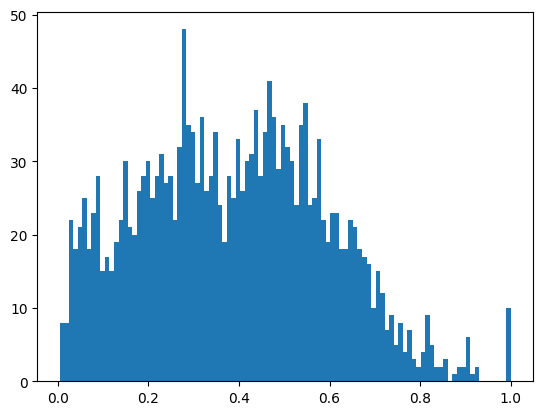

In [59]:
# BLEU-4 점수를 히스토그램으로 표시 
# 평균값과 중앙값 출력
plt.hist([r['bleu-4'] for r in test_results], bins=100);
np.mean([r['bleu-4'] for r in test_results]), np.median([r['bleu-4'] for r in test_results])

In [60]:
valid_batch = packed_loader(Validdataloader)

batch_dict = next(valid_batch)

model = model.eval()
sampler = NMTSampler(model)
sampler.apply_to_batch(batch_dict)

x_source:
tensor([[   2,   30,  810,  ...,    0,    0,    0],
        [   2,    4,   75,  ...,    0,    0,    0],
        [   2,  128, 1527,  ...,    0,    0,    0],
        ...,
        [   2,  241,  810,  ...,    0,    0,    0],
        [   2,   30,  123,  ...,    0,    0,    0],
        [   2,  241,  810,  ...,    0,    0,    0]])

x_source 임베딩 결과:
torch.Size([64, 25, 32])
tensor([[[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.4585, -0.3484,  0.7955,  ..., -1.3426,  0.0702, -1.9287],
         [-0.2726, -1.6590,  1.7499,  ..., -0.6936, -0.2938, -0.2165],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.8790,  0.2979, -1.5131,  ...,  0.5818,  1.1508, -0.5175],
         [ 0.8396,  1.3368, -1.2248,  ..., -1.5065,  1.9408, -0.7046],
         [ 0.3659, -0.7877,  0.5554, 

In [61]:
all_results = []
for i in range(batch_size):
    all_results.append(sampler.get_ith_item(i, False))

In [62]:
# 좋은 결과들 보기 
top_results = [x for x in all_results if x['bleu-4']>0.1]
len(top_results)

54

/var/folders/bz/1fkmkxnn70gbzvvkys2cw_k40000gn/T/ipykernel_7525/507081653.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


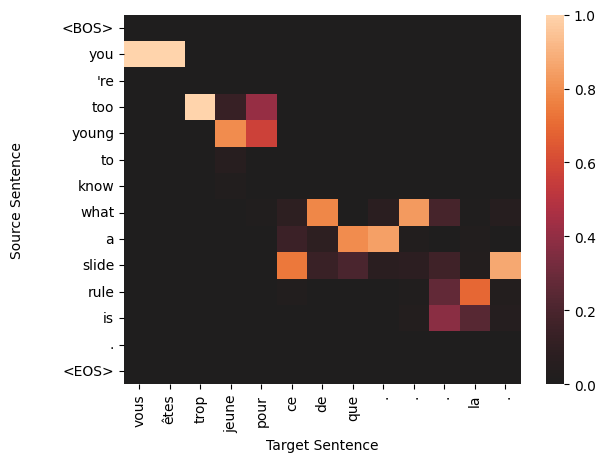

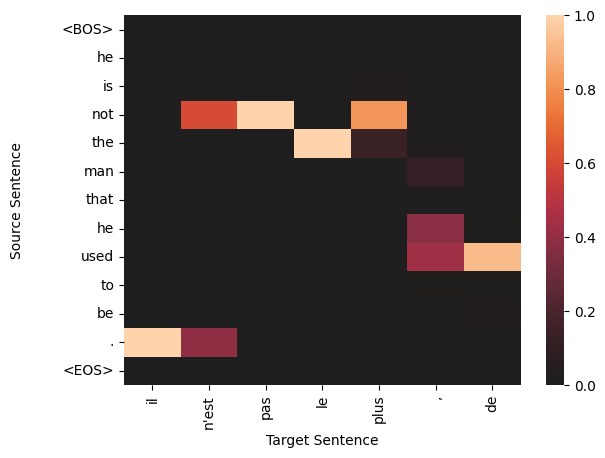

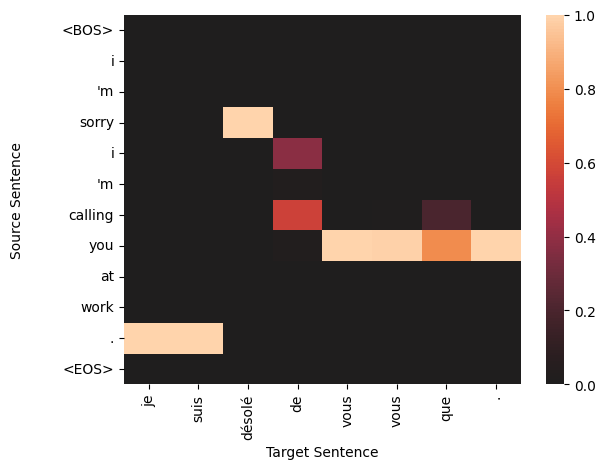

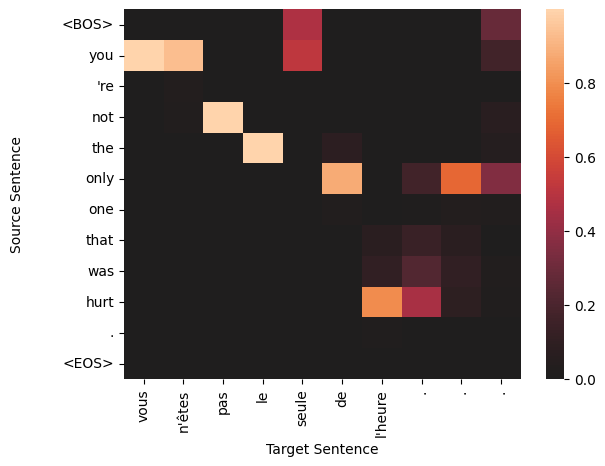

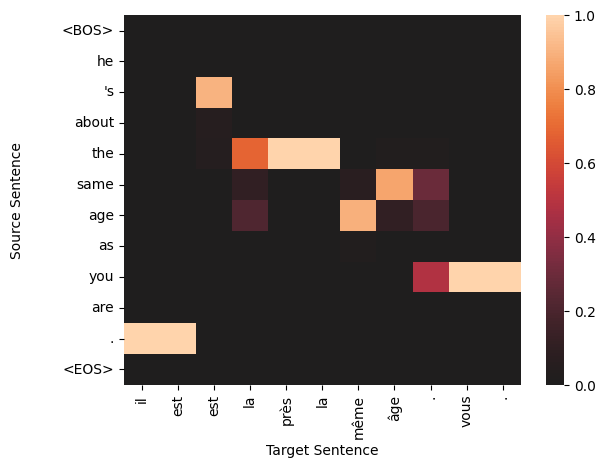

...

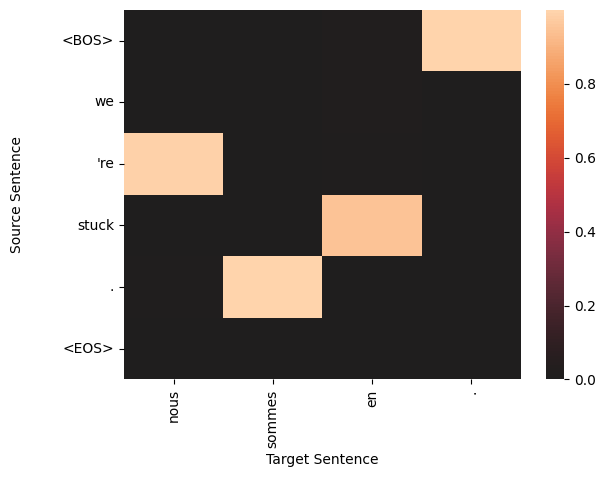

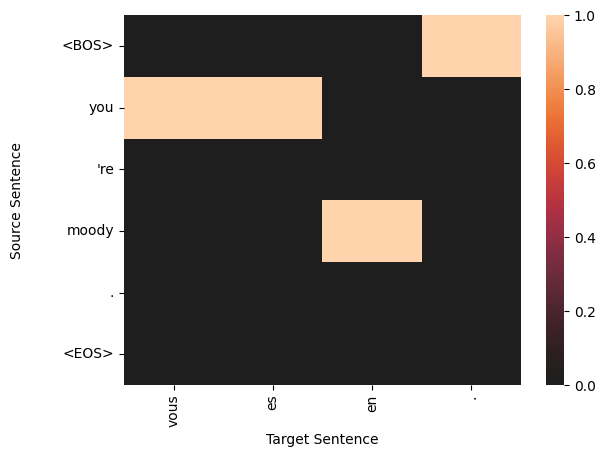

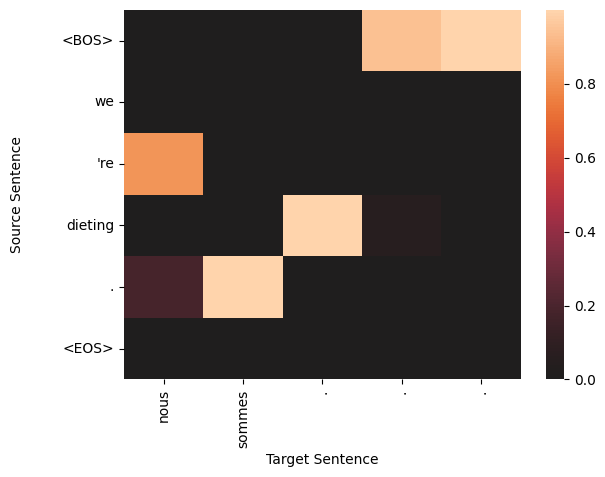

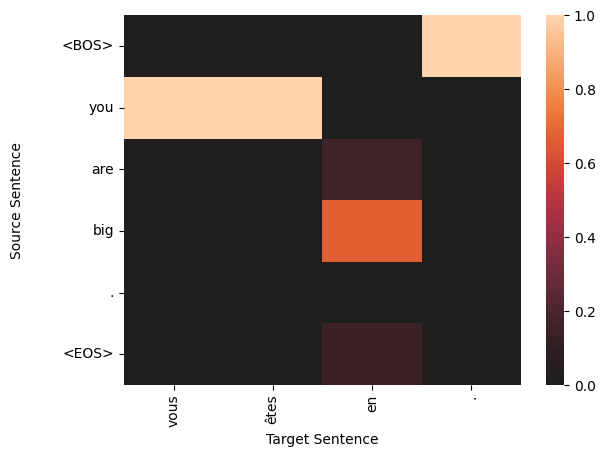

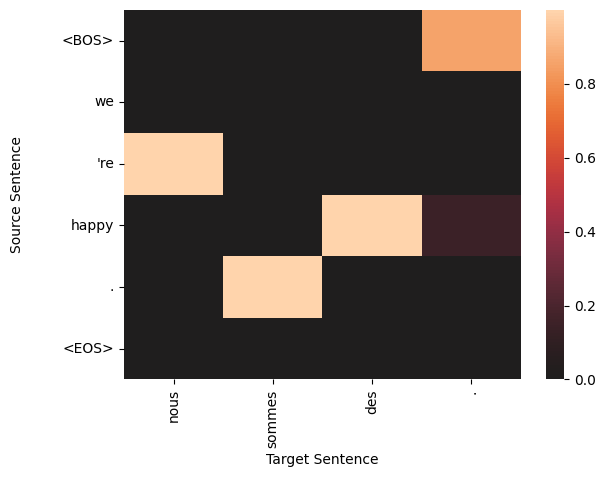

In [63]:
# 각 샘플에 대한 어텐션(attention) 히트맵 시각화
# 모델이 소스 문장에서 어떤 부분에 주의를 기울였는지 표현
for sample in top_results:
    plt.figure()
    target_len = len(sample['sampled'])
    source_len = len(sample['source'])

    attention_matrix = sample['attention'][:target_len, :source_len+2].transpose()#[::-1]
    ax = sns.heatmap(attention_matrix, center=0.0)
    ylabs = ["<BOS>"]+sample['source']+["<EOS>"]
    #ylabs = sample['source']
    #ylabs = ylabs[::-1]
    ax.set_yticklabels(ylabs, rotation=0)
    ax.set_xticklabels(sample['sampled'], rotation=90)
    ax.set_xlabel("Target Sentence")
    ax.set_ylabel("Source Sentence\n\n")